# TFT COVARIATES CQR MODELS
This notebook contains the code for the Conformal Quantile Regression (CQR) calibration and evaluation of the two TFT models previously trained with covariates using the Darts library.

Both versions of the model are evaluated on their respective test sets, with the MinMax-scaled model also evaluated on a dedicated test set.

In [ ]:
# We install darts
!pip install u8darts[torch] --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.4/57.4 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.3/46.3 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.6/200.6 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.1/823.1 kB 30.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 354.4/354.4 kB 21.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 104.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 97.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 62.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# Necessary imports to read the datasets
import pandas as pd
import zipfile
import os
import numpy as np
import matplotlib.pyplot as plt
import joblib
from darts import TimeSeries
from darts.dataprocessing.transformers import Scaler
from darts.models import TFTModel
from darts import concatenate, metrics
from darts.models import ConformalQRModel
from darts.utils.timeseries_generation import datetime_attribute_timeseries

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# We start with minmax scaling

In [ ]:
# Load model
model = TFTModel.load("/content/drive/MyDrive/Colab Notebooks/TFG/data/02_models/TFT/covariates/TFT_model_covariates.pkl")

In [ ]:
# Load the test data
test_data = joblib.load('/content/drive/MyDrive/Colab Notebooks/TFG/data/01_datasets/train_test/scaled_test.pkl')

# Extract components
scaled_val_series = test_data['validation']        # validation not used in our case
scaled_calib_test_series = test_data['calib_test']
scalers_test = test_data['scalers']           # the scalers to reescale the series later

# Reuse the same sorted meter IDs to align
meter_ids_test = sorted(scaled_calib_test_series.keys())

# Build aligned lists
test_series_scaled = [scaled_calib_test_series[meter_id] for meter_id in meter_ids_test]

print(f"Loaded {len(test_series_scaled)} time series for testing.")

Loaded 60 time series for testing.


In [ ]:
# We define the list of holidays in Catalonia during 2022 and 2023
holiday_dates = pd.to_datetime([
    # 2022
    "2022-01-01", "2022-01-06", "2022-04-15", "2022-04-18", "2022-05-01", "2022-06-06",
    "2022-06-24", "2022-08-15", "2022-09-11", "2022-09-24", "2022-10-12", "2022-11-01",
    "2022-12-06", "2022-12-08", "2022-12-25", "2022-12-26",
    # 2023
    "2023-01-01", "2023-01-06", "2023-04-07", "2023-04-10", "2023-05-01", "2023-05-29",
    "2023-06-24", "2023-08-15", "2023-09-11", "2023-09-24", "2023-10-12", "2023-11-01",
    "2023-12-06", "2023-12-08", "2023-12-25", "2023-12-26"
])

# We define the complete date range for our dataset
date_range = pd.date_range(start='2022-01-01', end='2023-12-31')

# We create a binary holiday series where 1 indicates a holiday and 0 otherwise
holiday_series = pd.Series(0, index=date_range)
holiday_series.loc[holiday_dates.intersection(date_range)] = 1
holiday_timeseries = TimeSeries.from_series(holiday_series.rename("is_holiday"))

# We create a binary series indicating whether each date is a weekend (Saturday or Sunday)
is_weekend_series = pd.Series((date_range.weekday >= 5).astype(int), index=date_range)
is_weekend_timeseries = TimeSeries.from_series(is_weekend_series.rename("is_weekend"))

# We create a normalized day-of-year series (scaled to [0, 1])
day_of_year_norm = pd.Series(date_range.dayofyear / 365, index=date_range)
day_of_year_timeseries = TimeSeries.from_series(day_of_year_norm.rename("day_of_year_norm"))

# We build the future covariates for the test set
future_covariates_test = []

for test_ts in test_series_scaled:
    test_cov = concatenate([
        datetime_attribute_timeseries(test_ts, "day_of_week", one_hot=True),
        datetime_attribute_timeseries(test_ts, "month", one_hot=True),
        is_weekend_timeseries.slice_intersect(test_ts),
        holiday_timeseries.slice_intersect(test_ts),
        day_of_year_timeseries.slice_intersect(test_ts)
    ], axis=1)

    future_covariates_test.append(test_cov)

In [ ]:
# Constants
start_date = pd.Timestamp("2023-11-6")
horizon = 7
quantiles = [0.05, 0.5, 0.95]
pred_kwargs={"predict_likelihood_parameters": True, "verbose": True}

# Initialize the conformal quantile regression model
cp_model = ConformalQRModel(
    model=model,
    quantiles=quantiles,
    symmetric=False
    # if cal_length is None, it considers all calibration scores
)
q_interval = cp_model.q_interval  # [(0.05, 0.95)]
q_range = cp_model.interval_range  # [0.9]

# Prepare to collect results
all_hfcs = {}
all_bt_results = {}

# We loop over each time series
for meter_id, ts, fcov in zip(meter_ids_test, test_series_scaled, future_covariates_test):
    # Historical forecasts
    hfcs = cp_model.historical_forecasts(
        series=ts,
        future_covariates=fcov,
        forecast_horizon=7,
        start=start_date,
        last_points_only=False,
        stride=7,
        **pred_kwargs,
    )

    scaler = scalers_test[meter_id]
    widths = []

    for forecast in hfcs:
        q05 = forecast["Consumption per meter_q0.05"]
        q95 = forecast["Consumption per meter_q0.95"]
        q05_orig = scaler.inverse_transform(q05)
        q95_orig = scaler.inverse_transform(q95)
        width = (q95_orig - q05_orig).values()
        widths.append(width)

    mean_width = np.mean([np.mean(w) for w in widths])

    # We evaluate the already-generated historical forecasts
    bt = cp_model.backtest(
        ts,
        future_covariates=fcov,
        historical_forecasts=hfcs,
        last_points_only=False,
        metric=[metrics.mic, metrics.miw],
        metric_kwargs={"q_interval": q_interval},
    )
    df_results = pd.DataFrame({"Interval": q_range, "Coverage": bt[0], "Width": bt[1], "Width rescaled": mean_width})
    print(f"Results for meter {meter_id}:\n", df_results, "\n")

    # Store results
    all_hfcs[meter_id] = hfcs
    all_bt_results[meter_id] = df_results

# We combine results across meters
combined_results = pd.concat(all_bt_results.values(), keys=all_bt_results.keys())
combined_results.reset_index(level=1, drop=True, inplace=True)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 450.84it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801501002_Badalona:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.910714  0.20596        20.23143 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 423.58it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801503008_Badalona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.299467       28.455342 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 406.92it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801901042_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  0.685018       10.658881 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 443.85it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801902035_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.151302        1.844366 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 285.71it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801902037_Barcelona:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.910714  0.17707         2.97301 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 452.92it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801902052_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.767857  0.267097        3.023533 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 314.52it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801902102_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  0.203158        2.722314 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 457.49it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801903006_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.839286  0.309798        3.190924 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 287.82it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801903035_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.267079         0.74782 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 449.43it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801903040_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9     0.875  0.400935        1.090544 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 449.65it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801903048_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.803571  0.175266        4.069674 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 418.24it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801903060_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  0.360988        4.530399 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 417.36it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801903067_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  0.276775        0.963176 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 439.00it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801903081_Barcelona:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.892857  0.26512        2.293289 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 435.91it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801904008_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.857143  0.147058        6.070556 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 423.54it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801904030_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  0.245163        3.145443 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 470.80it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801905054_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.159032       16.197426 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 310.37it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801905091_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  0.254184        5.365827 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 438.73it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801906002_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.857143  0.308096        2.526391 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 340.40it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801906010_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.284486        7.777839 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 374.93it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801906041_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.732143  0.194404        5.361672 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 449.09it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801907003_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.767857  0.093485        1.865966 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 461.41it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801907011_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.308746        3.297409 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 434.40it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801907013_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  0.243399        2.166252 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 457.36it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801907025_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9       1.0  0.389219       10.816397 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 443.07it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801907037_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9       1.0  0.306289        5.396808 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 408.72it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801907084_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.857143  0.499748       12.853528 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 391.47it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801907088_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  0.137308        8.900291 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 314.15it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801907115_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.214649       15.946305 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 461.83it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801908002_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9       1.0  0.192063        3.875841 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 317.03it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801908022_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.232694        3.476445 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 423.54it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801908043_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.186539        0.762944 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 422.67it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801908046_Barcelona:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.839286  0.30948        2.417036 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 370.55it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801908049_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.279031       15.170903 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 419.84it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801908061_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  0.307057        1.424744 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 436.51it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801908088_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  0.236873        5.391221 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 364.02it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801908111_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.714286  0.274158        7.026681 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 425.17it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801909015_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  0.200917        5.452894 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 427.04it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801909017_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9       1.0  0.233306         8.79329 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 284.67it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801910053_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  0.437483        7.511588 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 443.73it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801910054_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9       1.0  0.512779        5.435461 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 288.58it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801910080_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9     0.875  0.310345        1.443105 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 381.97it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801910092_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.457758        1.730324 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 320.30it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801910119_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.252815          1.1048 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 417.36it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801910235_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.857143  0.268359         0.74067 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 423.12it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810101040_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.345237        6.904738 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 426.03it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810101041_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.184769        3.974378 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 446.87it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810102007_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.714286  0.488855        6.858631 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 409.77it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810102008_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.160421        2.024518 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 474.09it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810102017_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.402891        5.934588 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 457.92it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810102033_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.657591       20.608907 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 448.18it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810102045_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.839286  0.366617        9.084763 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 426.78it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810102048_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  0.149945        3.631675 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 461.80it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810104040_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.367582        1.650445 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 459.93it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810105003_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.121082        0.738598 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 462.84it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810105026_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.714286  0.129891        3.686317 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 459.06it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810105032_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.243172        5.374102 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 452.64it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810106012_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.181495        1.602605 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 443.34it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810106013_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.358506        2.337462 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 474.71it/s]

Results for meter 0810106023_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  0.315676        1.887745 



In [ ]:
mean_coverage = combined_results["Coverage"].mean()
mean_width = combined_results["Width"].mean()
mean_width_rescaled = combined_results["Width rescaled"].mean()

print(f"Mean Coverage: {mean_coverage:.4f}")
print(f"Mean Width: {mean_width:.4f}")
print(f"Mean Width rescaled: {mean_width_rescaled:.4f}")

Mean Coverage: 0.9131
Mean Width: 0.2833
Mean Width rescaled: 5.7090


In [ ]:
import matplotlib.pyplot as plt
from darts import concatenate  # Darts utility to merge TimeSeries

for meter_id, hfcs in all_hfcs.items():
    # Get the actual time series
    ts = scaled_calib_test_series[meter_id]

    # Get scaler and results
    scaler = scalers_test[meter_id]
    df_result = all_bt_results[meter_id]
    coverage = df_result["Coverage"].iloc[0]
    width = df_result["Width rescaled"].iloc[0]

    # Start a new plot
    fig, ax = plt.subplots(figsize=(12, 6))

    # Plot actuals (rescaled)
    ts_orig = scaler.inverse_transform(ts)
    ts_orig.plot(ax=ax, label='Actual (rescaled)', lw=2)

    full_lower = []
    full_upper = []

    # Collect lower and upper quantiles from each forecast window
    for forecast in hfcs:
        if ('Consumption per meter_q0.05' in forecast.components
            and 'Consumption per meter_q0.95' in forecast.components):

            lower = forecast['Consumption per meter_q0.05']
            upper = forecast['Consumption per meter_q0.95']
            lower_orig = scaler.inverse_transform(lower)
            upper_orig = scaler.inverse_transform(upper)
            full_lower.append(lower_orig)
            full_upper.append(upper_orig)


    if full_lower and full_upper:
        # Concatenate all the TimeSeries pieces into full series
        combined_lower = concatenate(full_lower)
        combined_upper = concatenate(full_upper)

        # Plot the quantile area as a filled region
        ax.fill_between(
            combined_lower.time_index,
            combined_lower.values().flatten(),
            combined_upper.values().flatten(),
            color='orange',
            alpha=0.3,
            label='0.05-0.95 quantile'
        )

    ax.set_title(f"Meter {meter_id} - Forecasts vs Actuals")
    ax.legend()
    plt.show()

    # Print the metrics below each plot
    print(f"Meter {meter_id} - Coverage: {coverage:.4f}, Width: {width:.4f}\n")

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Let's continue with the standard scaling

In [ ]:
# Load model
model = TFTModel.load("/content/drive/MyDrive/Colab Notebooks/TFG/data/02_models/TFT/covariates/TFT_model_standard_covariates.pkl")

In [ ]:
# Load the test data
test_data = joblib.load('/content/drive/MyDrive/Colab Notebooks/TFG/data/01_datasets/train_test/scaled_test_standard.pkl')

# Extract components
scaled_val_series = test_data['validation']        # validation not used in our case
scaled_calib_test_series = test_data['calib_test']
scalers_test = test_data['scalers']           # the scalers to reescale the series later

# Reuse the same sorted meter IDs to align
meter_ids_test = sorted(scaled_calib_test_series.keys())

# Build aligned lists
test_series_scaled = [scaled_calib_test_series[meter_id] for meter_id in meter_ids_test]

print(f"Loaded {len(test_series_scaled)} time series for testing.")

Loaded 60 time series for testing.


In [ ]:
# We build the future covariates for the test set
future_covariates_test = []

for test_ts in test_series_scaled:
    test_cov = concatenate([
        datetime_attribute_timeseries(test_ts, "day_of_week", one_hot=True),
        datetime_attribute_timeseries(test_ts, "month", one_hot=True),
        is_weekend_timeseries.slice_intersect(test_ts),
        holiday_timeseries.slice_intersect(test_ts),
        day_of_year_timeseries.slice_intersect(test_ts)
    ], axis=1)

    future_covariates_test.append(test_cov)

In [ ]:
# Constants
start_date = pd.Timestamp("2023-11-6")
horizon = 7
quantiles = [0.05, 0.5, 0.95]
pred_kwargs={"predict_likelihood_parameters": True, "verbose": True}

# Initialize the conformal quantile regression model
cp_model = ConformalQRModel(
    model=model,
    quantiles=quantiles,
    symmetric=False
    # if cal_length is None, it considers all calibration scores
)
q_interval = cp_model.q_interval  # [(0.05, 0.95)]
q_range = cp_model.interval_range  # [0.9]

# Prepare to collect results
all_hfcs = {}
all_bt_results = {}

# We loop over each time series
for meter_id, ts, fcov in zip(meter_ids_test, test_series_scaled, future_covariates_test):
    # Historical forecasts
    hfcs = cp_model.historical_forecasts(
        series=ts,
        future_covariates=fcov,
        forecast_horizon=7,
        start=start_date,
        last_points_only=False,
        stride=7,
        **pred_kwargs,
    )

    scaler = scalers_test[meter_id]
    widths = []

    for forecast in hfcs:
        q05 = forecast["Consumption per meter_q0.05"]
        q95 = forecast["Consumption per meter_q0.95"]
        q05_orig = scaler.inverse_transform(q05)
        q95_orig = scaler.inverse_transform(q95)
        width = (q95_orig - q05_orig).values()
        widths.append(width)

    mean_width = np.mean([np.mean(w) for w in widths])

    # We evaluate the already-generated historical forecasts
    bt = cp_model.backtest(
        ts,
        future_covariates=fcov,
        historical_forecasts=hfcs,
        last_points_only=False,
        metric=[metrics.mic, metrics.miw],
        metric_kwargs={"q_interval": q_interval},
    )
    df_results = pd.DataFrame({"Interval": q_range, "Coverage": bt[0], "Width": bt[1], "Width rescaled": mean_width})
    print(f"Results for meter {meter_id}:\n", df_results, "\n")

    # Store results
    all_hfcs[meter_id] = hfcs
    all_bt_results[meter_id] = df_results

# We combine results across meters
combined_results = pd.concat(all_bt_results.values(), keys=all_bt_results.keys())
combined_results.reset_index(level=1, drop=True, inplace=True)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 278.16it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801501002_Badalona:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.910714  1.55458        18.35534 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 486.10it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801503008_Badalona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  1.749808       28.460304 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 464.57it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801901042_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  5.414873       11.475514 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 476.75it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801902035_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  0.936798        1.842406 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 423.41it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801902037_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9     0.875  1.174948        2.797326 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 450.42it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801902052_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.767857  2.453004         4.23786 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 409.31it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801902102_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9     0.875  1.149168        2.456781 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 411.13it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801903006_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.857143  1.800405        2.856788 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 428.41it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801903035_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  1.464191        0.666625 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 417.89it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801903040_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9     0.875  2.447853        1.071574 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 403.37it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801903048_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.839286  2.187306        3.988543 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 348.89it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801903060_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  2.025097        4.021619 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 437.33it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801903067_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.839286  1.312262        0.837971 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 424.44it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801903081_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.803571  1.304618        1.781566 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 414.81it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801904008_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  1.524968        7.499058 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 433.84it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801904030_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  1.626152         3.33341 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 450.93it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801905054_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  0.961647       17.382418 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 449.63it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801905091_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.857143  1.337774        5.377961 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 437.80it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801906002_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  1.872571        2.783431 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 437.56it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801906010_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  1.984753        7.603044 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 451.67it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801906041_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9     0.875  1.366141        5.879082 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 433.83it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801907003_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.839286  0.854863        1.816926 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 426.06it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801907011_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  1.803832        2.963884 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 385.89it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801907013_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  1.263659         1.86342 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 331.72it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801907025_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  2.115007        8.873007 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 423.32it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801907037_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.857143  1.816034        4.699203 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 344.59it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801907084_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.839286  3.572501       12.223961 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 431.20it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801907088_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  0.953971        7.145994 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 277.80it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801907115_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  1.121918        16.63136 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 421.52it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801908002_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  1.264758        2.967361 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 317.08it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801908022_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.696429  1.511639        2.593713 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 445.37it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801908043_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  1.543443        0.695658 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 331.17it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801908046_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.857143  1.904706        2.256775 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 455.27it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801908049_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9     0.875  1.283428       12.264194 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 270.85it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801908061_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  1.361261        1.038289 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 452.97it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801908088_Barcelona:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.946429  1.41292        5.314647 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 312.70it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801908111_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.839286  1.929068        7.306373 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 448.76it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801909015_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.803571  1.283502         5.90661 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 425.95it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801909017_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  1.153439         6.62585 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 378.15it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801910053_Barcelona:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.946429  2.63099        7.736896 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 407.89it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801910054_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.714286  2.510118        5.346635 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 461.10it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801910080_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  2.355869        1.535656 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 469.86it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801910092_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9      0.75  2.472228        1.500793 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 399.48it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801910119_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  0.827047        0.834292 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 303.27it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801910235_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.803571  1.307936         0.66211 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 358.84it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810101040_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  1.726065        6.789324 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 438.37it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810101041_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  1.561873        3.390899 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 408.67it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810102007_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9      0.75  4.218171         9.49293 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 414.98it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810102008_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  1.265876        1.755212 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 461.81it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810102017_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.857143  1.524912        4.329312 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 427.97it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810102033_Hospitalet:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.642857  2.57448       15.228179 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 403.81it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810102045_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.839286  2.077823        9.381382 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 434.64it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810102048_Hospitalet:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.928571  1.96897        3.241256 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 448.53it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810104040_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9     0.875  2.527695        1.523286 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 433.02it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810105003_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.767857  0.758816        0.478324 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 414.04it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810105026_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  1.482308        3.580943 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 442.99it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810105032_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  1.653361        4.473189 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 422.67it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810106012_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.857143  1.310406        1.662155 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 452.44it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810106013_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  1.904629        2.169478 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 284.82it/s]

Results for meter 0810106023_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  1.924761        1.828957 



In [ ]:
mean_coverage = combined_results["Coverage"].mean()
mean_width = combined_results["Width"].mean()
mean_width_rescaled = combined_results["Width rescaled"].mean()

print(f"Mean Coverage: {mean_coverage:.4f}")
print(f"Mean Width: {mean_width:.4f}")
print(f"Mean Width rescaled: {mean_width_rescaled:.4f}")

Mean Coverage: 0.8780
Mean Width: 1.7731
Mean Width rescaled: 5.4140


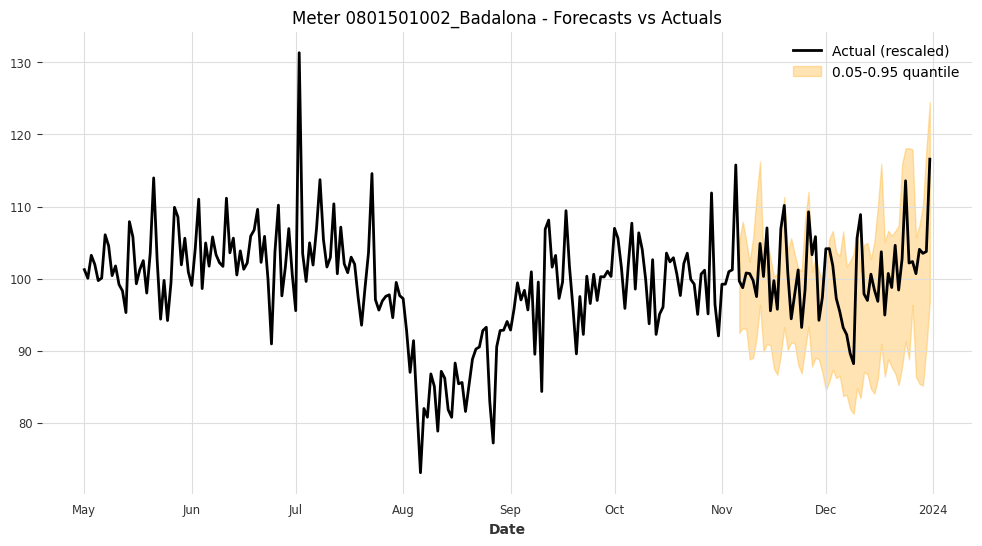

Meter 0801501002_Badalona - Coverage: 0.9107, Width: 18.3553



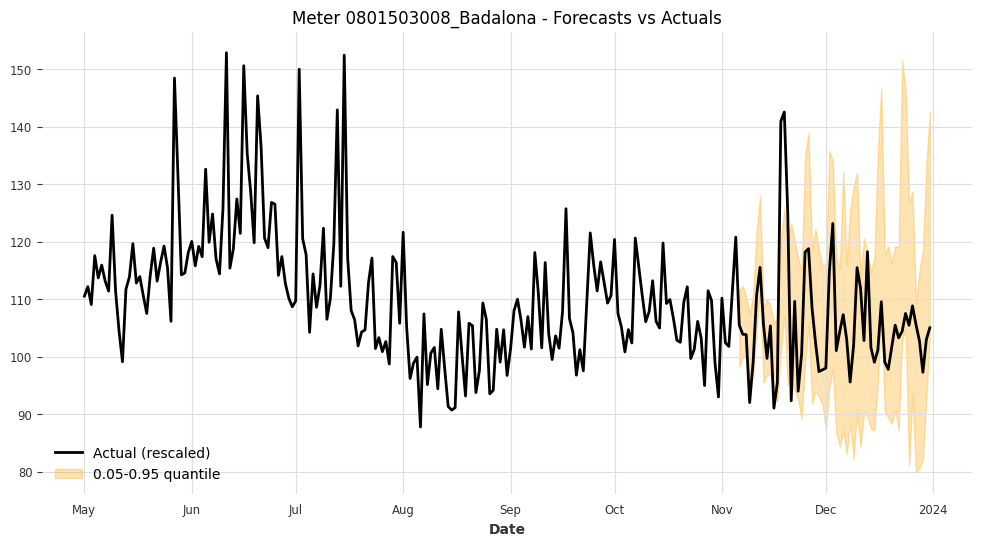

Meter 0801503008_Badalona - Coverage: 0.8929, Width: 28.4603



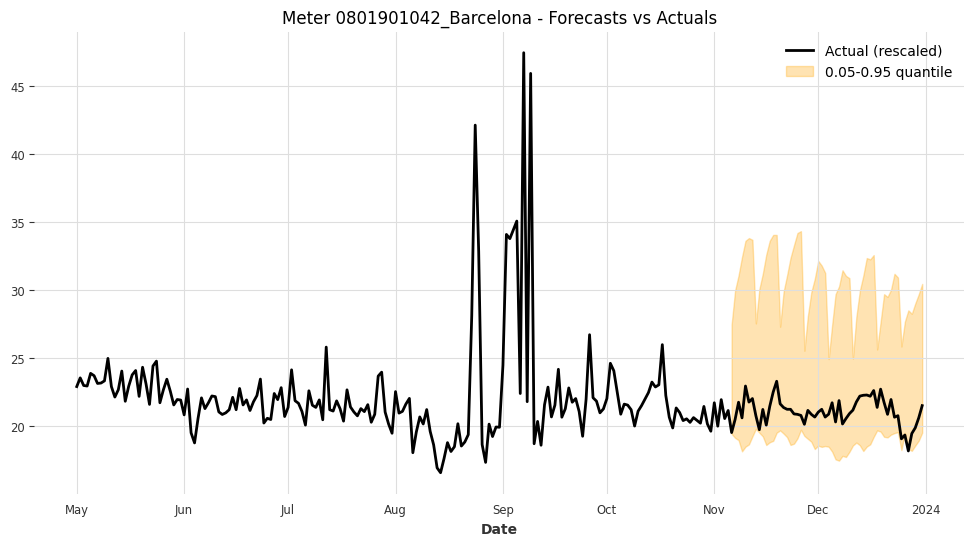

Meter 0801901042_Barcelona - Coverage: 0.9643, Width: 11.4755



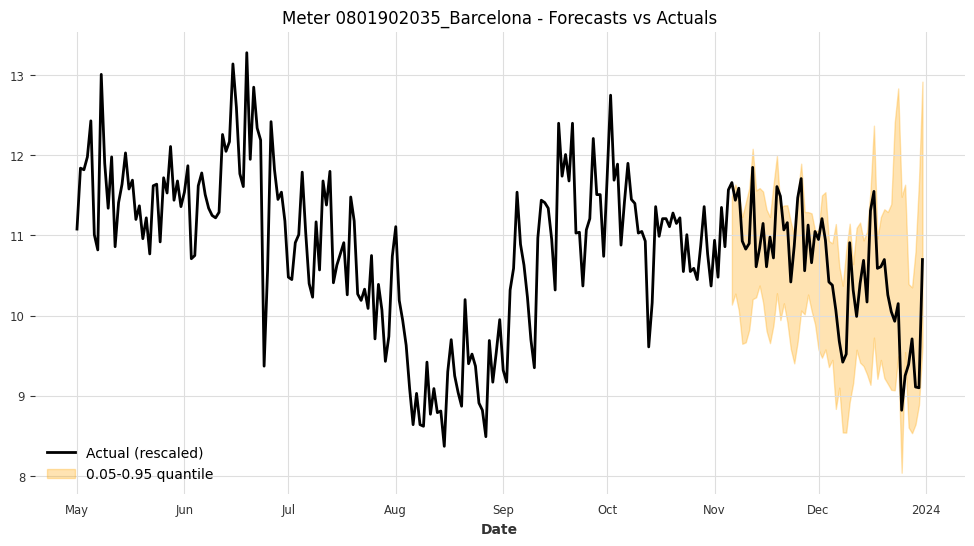

Meter 0801902035_Barcelona - Coverage: 0.9286, Width: 1.8424



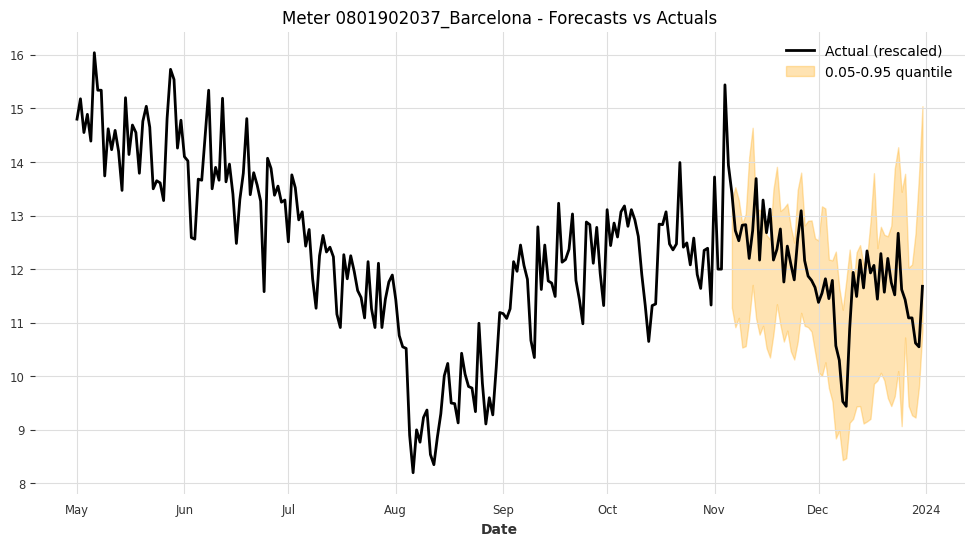

Meter 0801902037_Barcelona - Coverage: 0.8750, Width: 2.7973



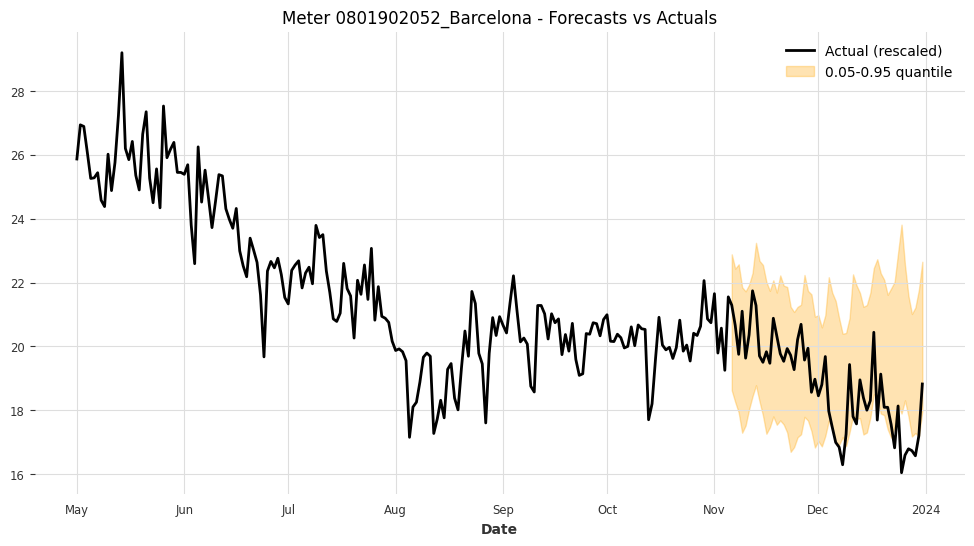

Meter 0801902052_Barcelona - Coverage: 0.7679, Width: 4.2379



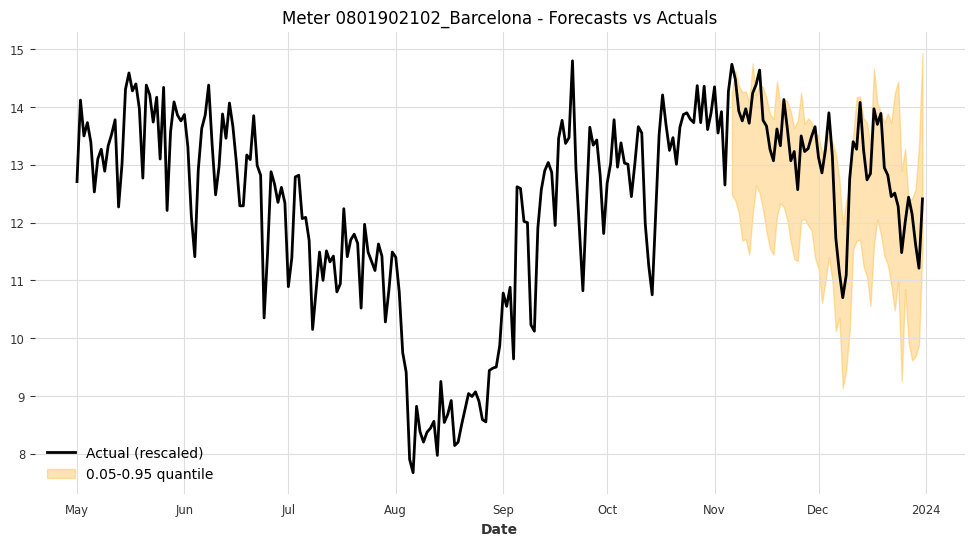

Meter 0801902102_Barcelona - Coverage: 0.8750, Width: 2.4568



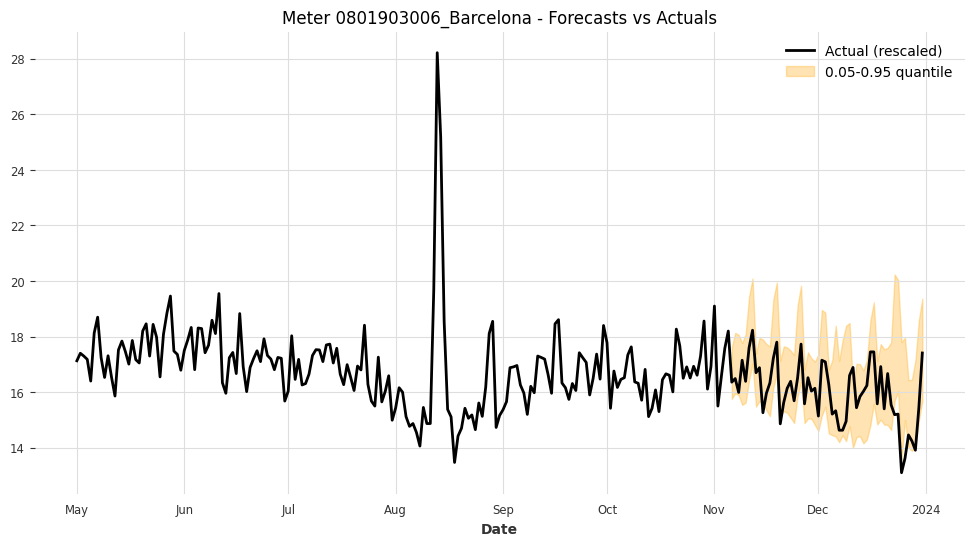

Meter 0801903006_Barcelona - Coverage: 0.8571, Width: 2.8568



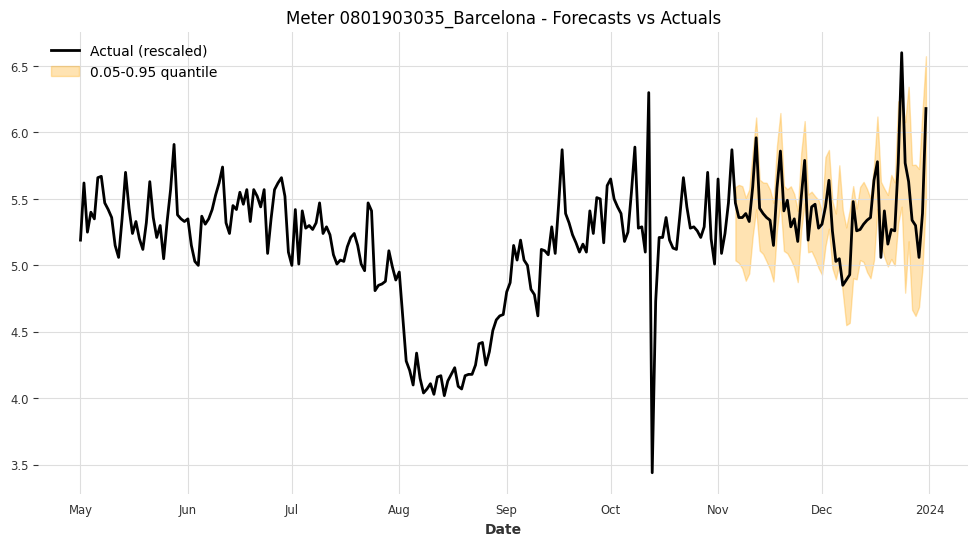

Meter 0801903035_Barcelona - Coverage: 0.9643, Width: 0.6666



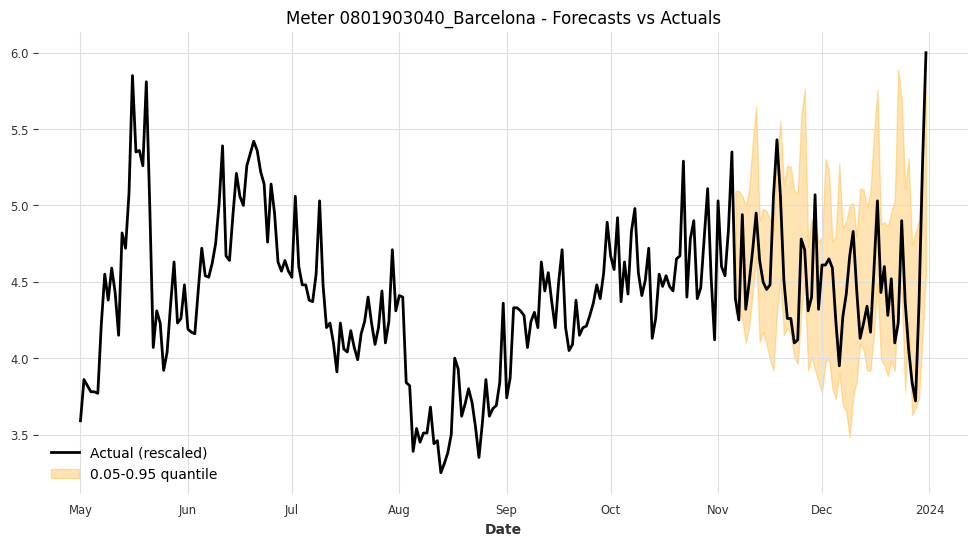

Meter 0801903040_Barcelona - Coverage: 0.8750, Width: 1.0716



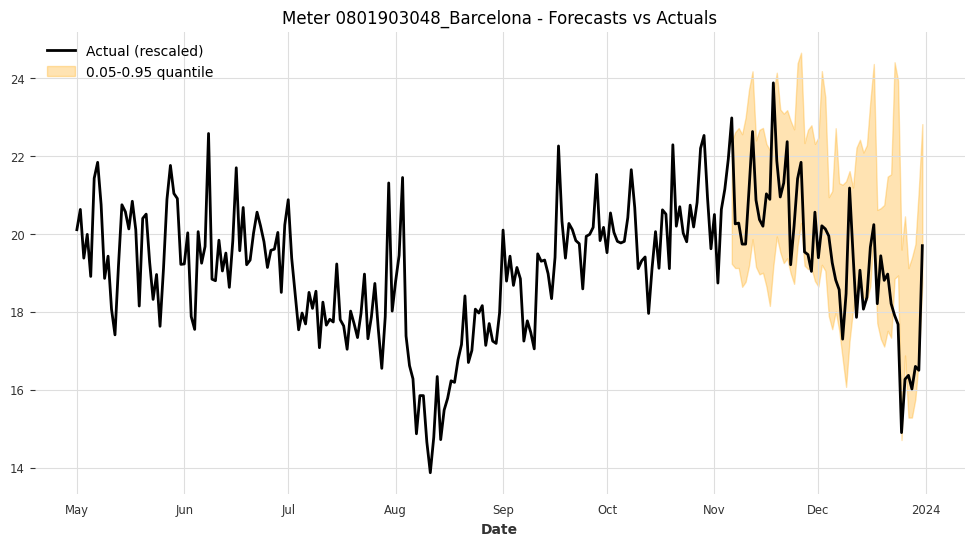

Meter 0801903048_Barcelona - Coverage: 0.8393, Width: 3.9885



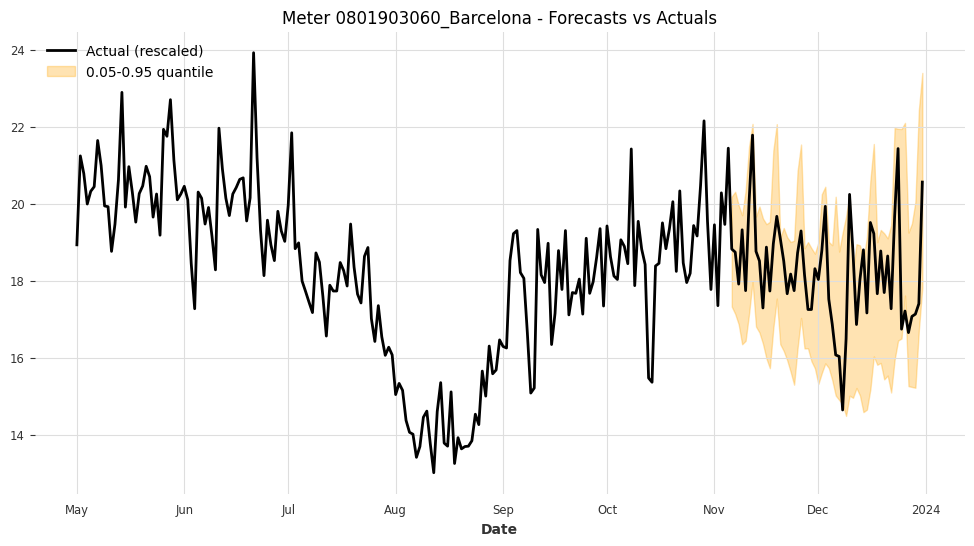

Meter 0801903060_Barcelona - Coverage: 0.9286, Width: 4.0216



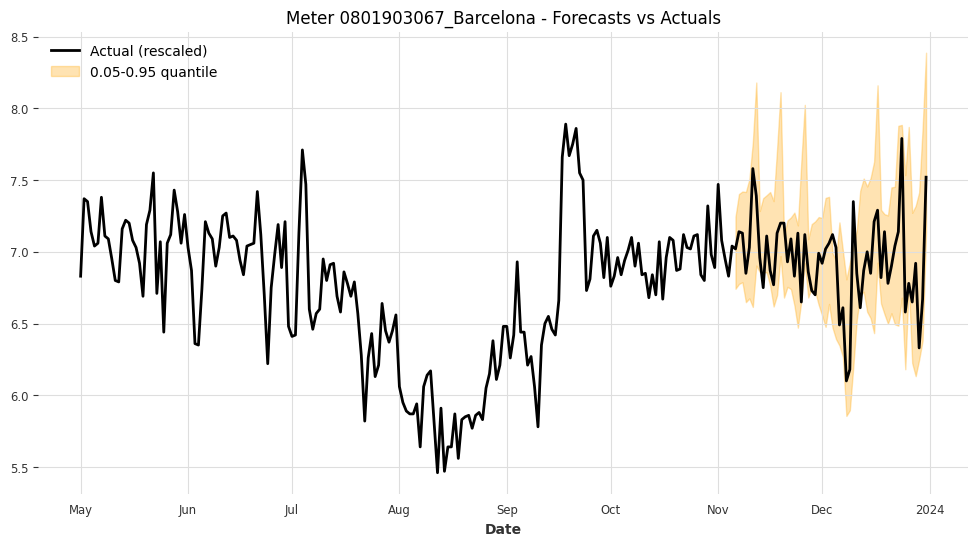

Meter 0801903067_Barcelona - Coverage: 0.8393, Width: 0.8380



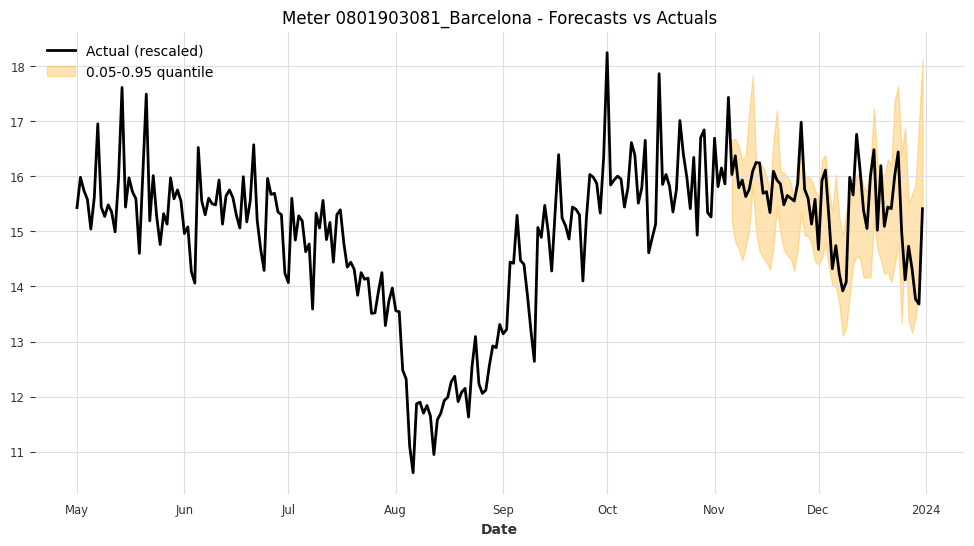

Meter 0801903081_Barcelona - Coverage: 0.8036, Width: 1.7816



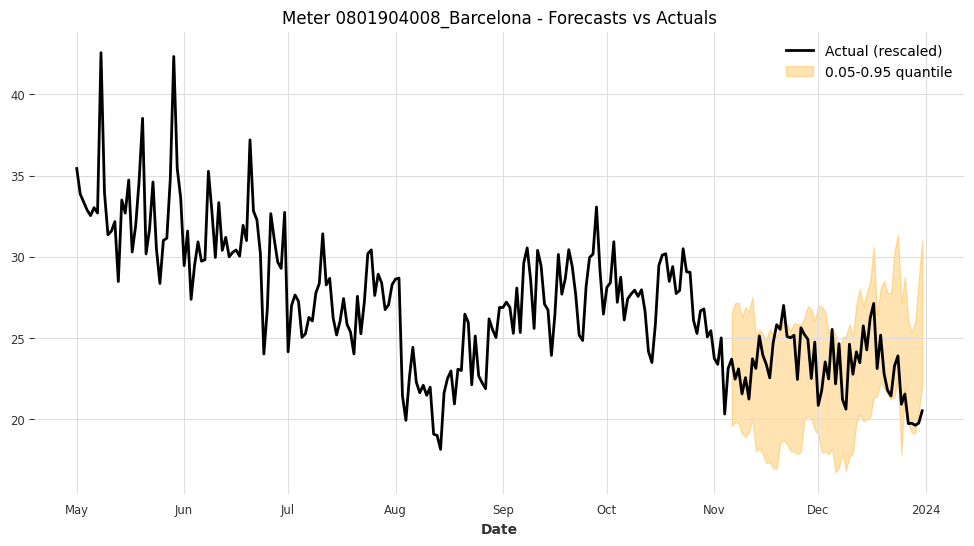

Meter 0801904008_Barcelona - Coverage: 0.8929, Width: 7.4991



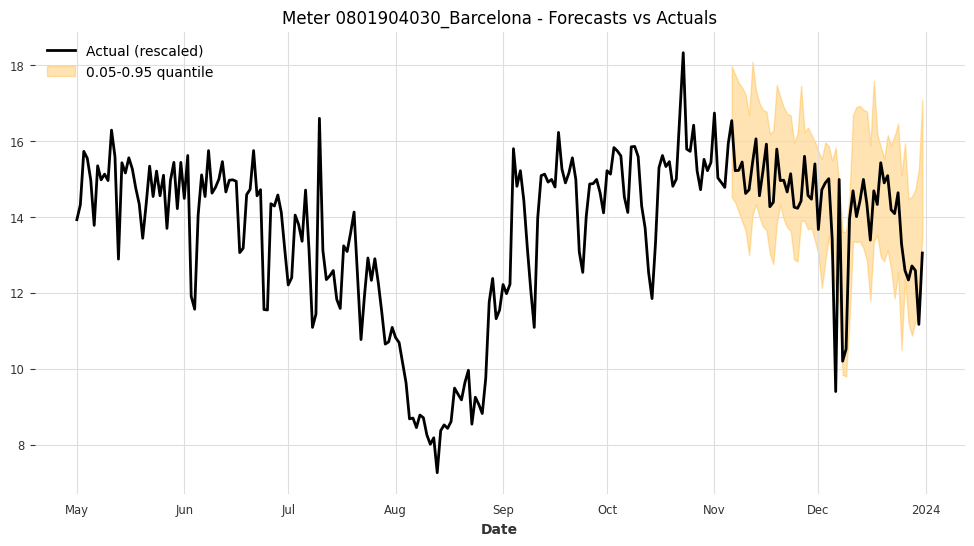

Meter 0801904030_Barcelona - Coverage: 0.9286, Width: 3.3334



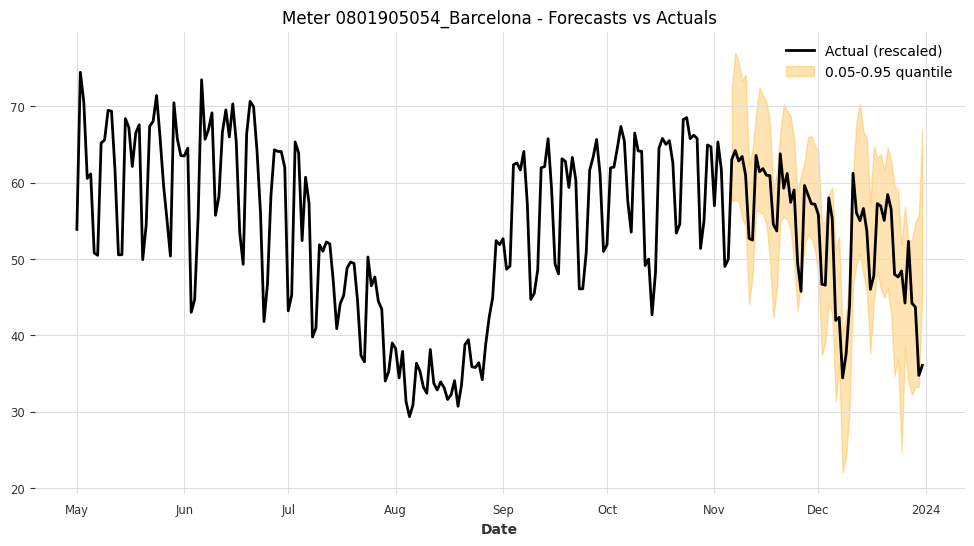

Meter 0801905054_Barcelona - Coverage: 0.9286, Width: 17.3824



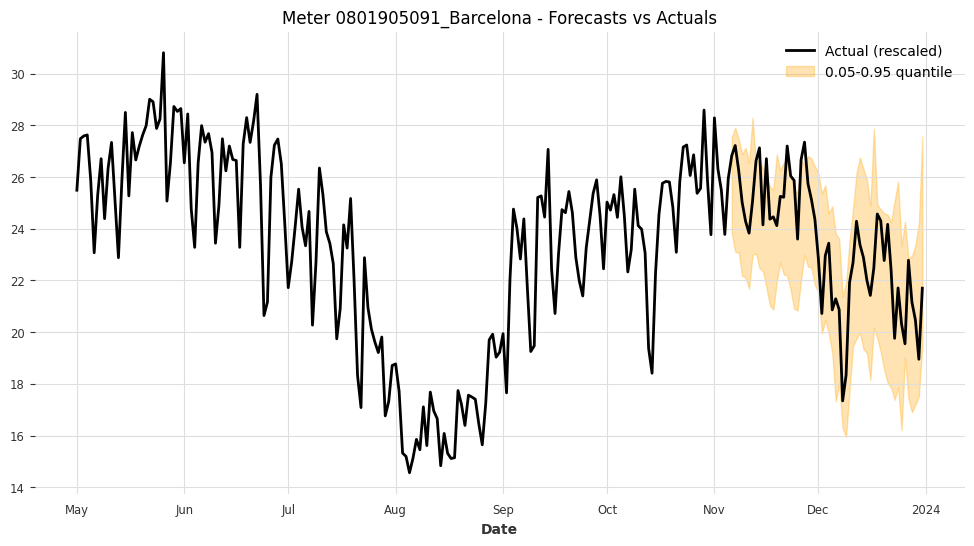

Meter 0801905091_Barcelona - Coverage: 0.8571, Width: 5.3780



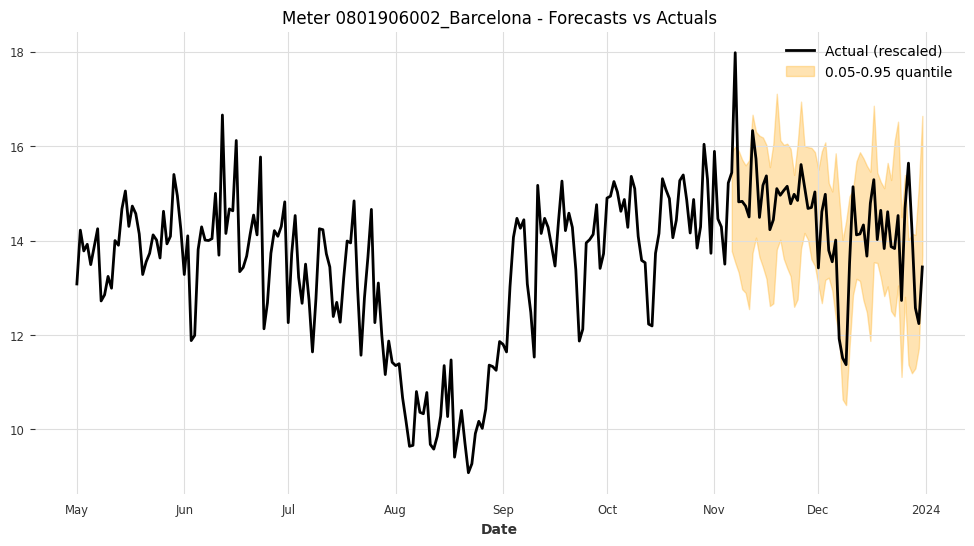

Meter 0801906002_Barcelona - Coverage: 0.8929, Width: 2.7834



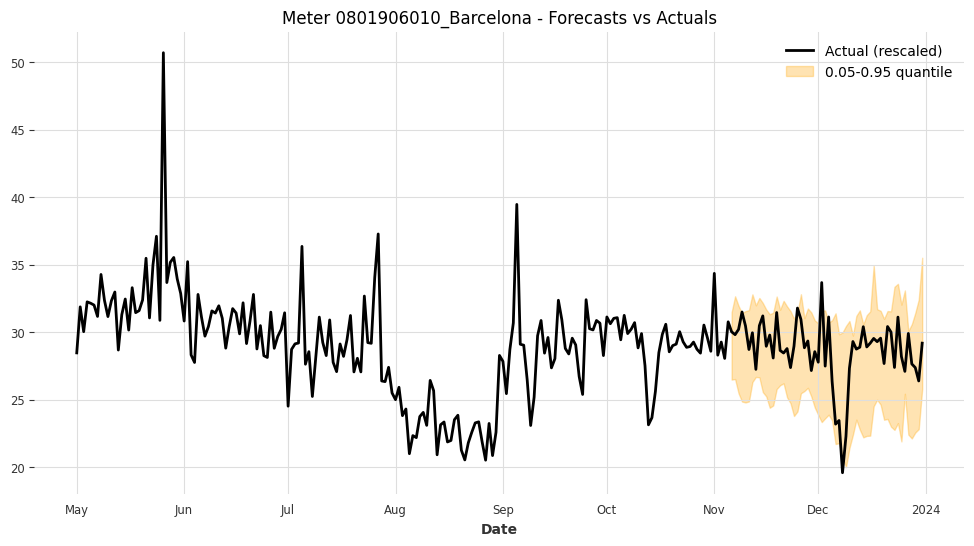

Meter 0801906010_Barcelona - Coverage: 0.9107, Width: 7.6030



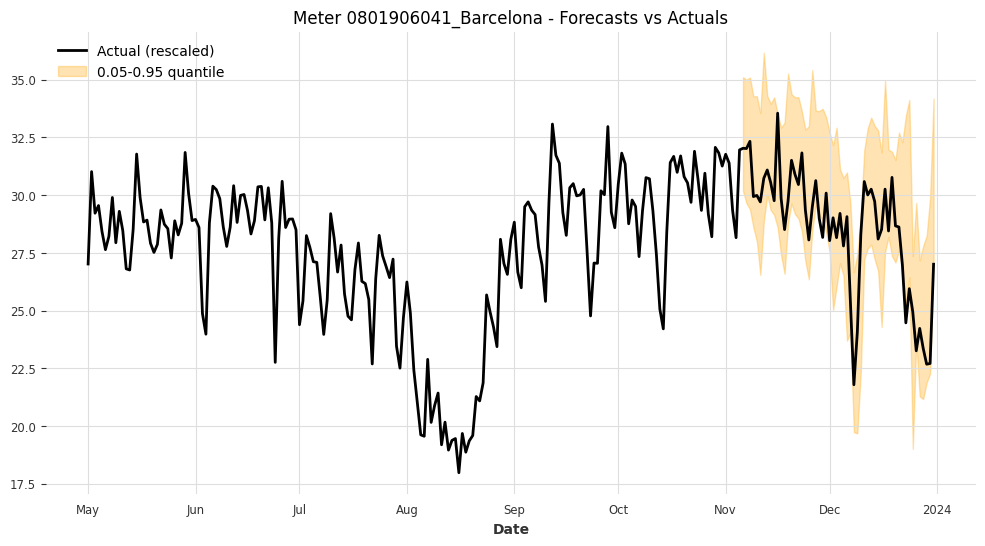

Meter 0801906041_Barcelona - Coverage: 0.8750, Width: 5.8791



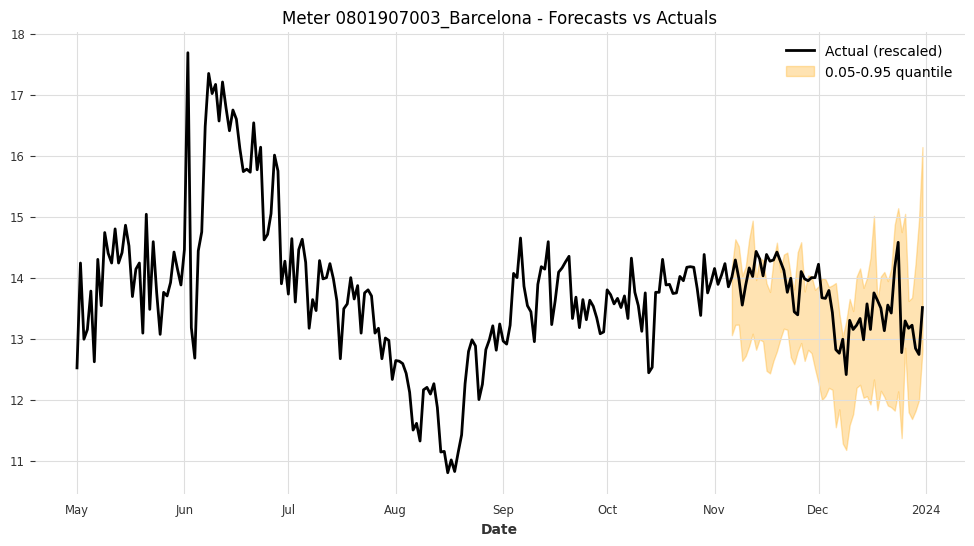

Meter 0801907003_Barcelona - Coverage: 0.8393, Width: 1.8169



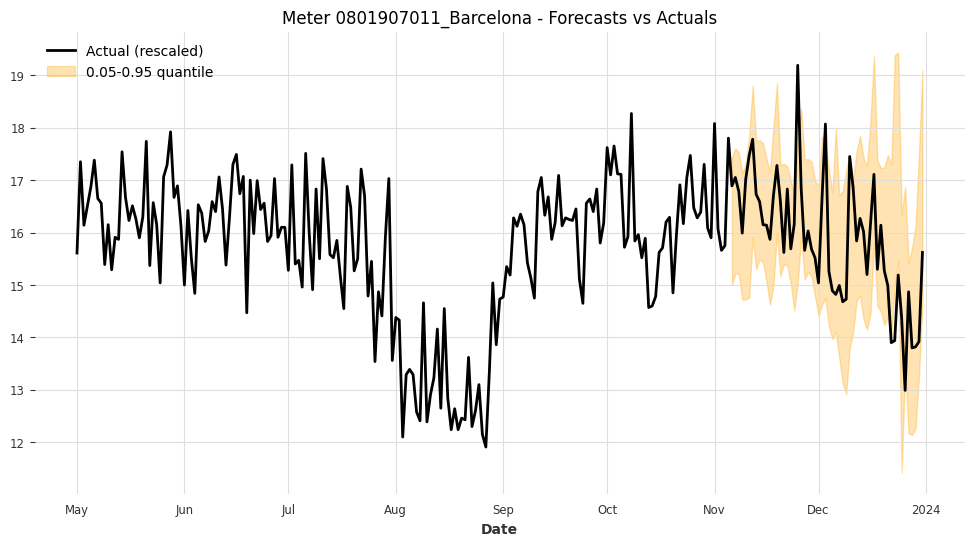

Meter 0801907011_Barcelona - Coverage: 0.8929, Width: 2.9639



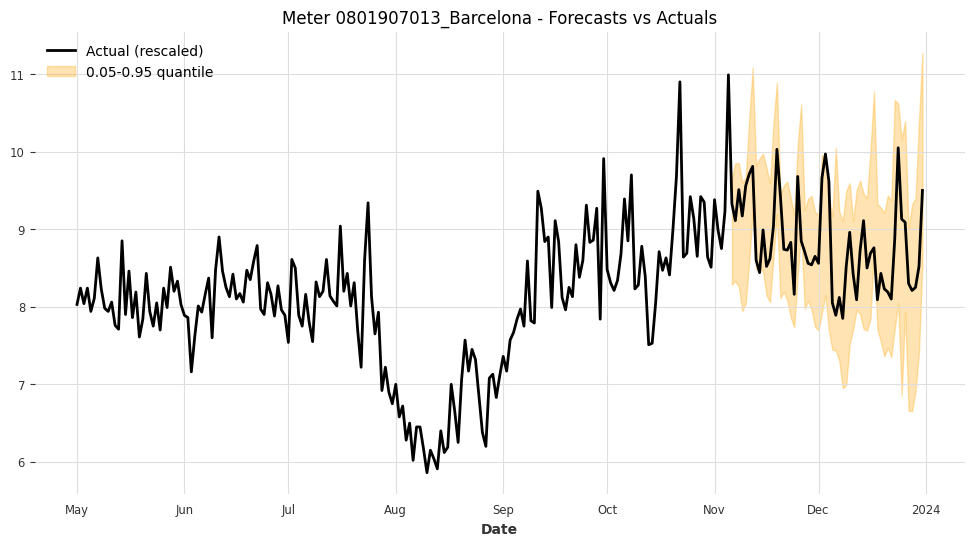

Meter 0801907013_Barcelona - Coverage: 0.9286, Width: 1.8634



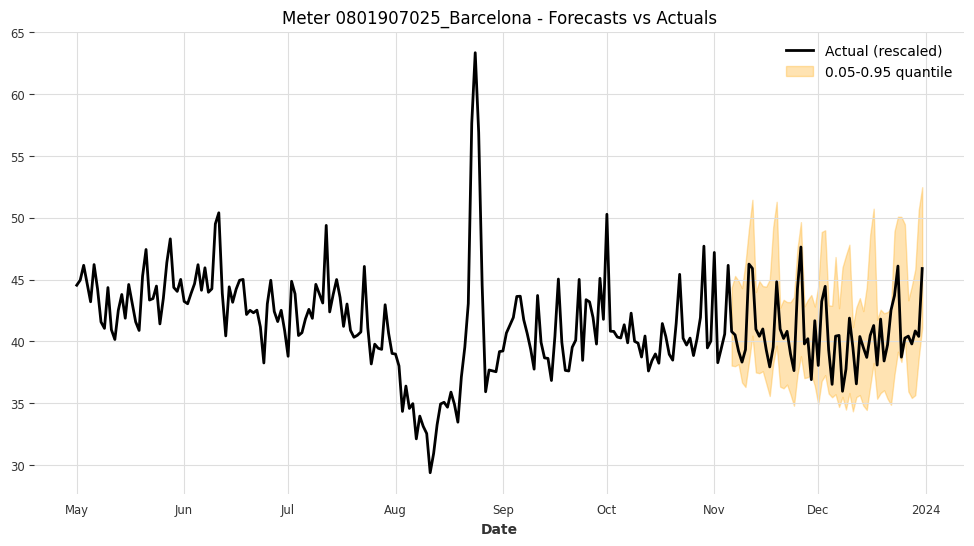

Meter 0801907025_Barcelona - Coverage: 0.9821, Width: 8.8730



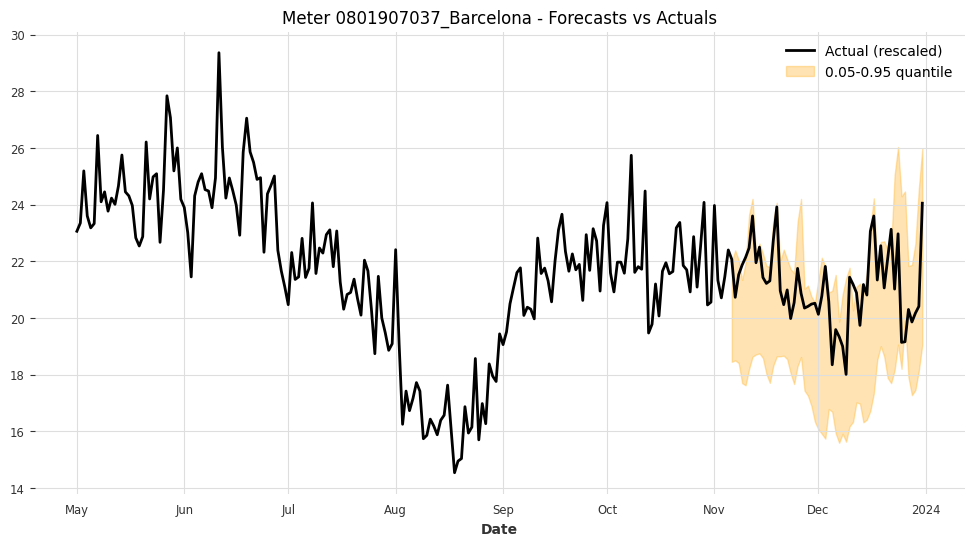

Meter 0801907037_Barcelona - Coverage: 0.8571, Width: 4.6992



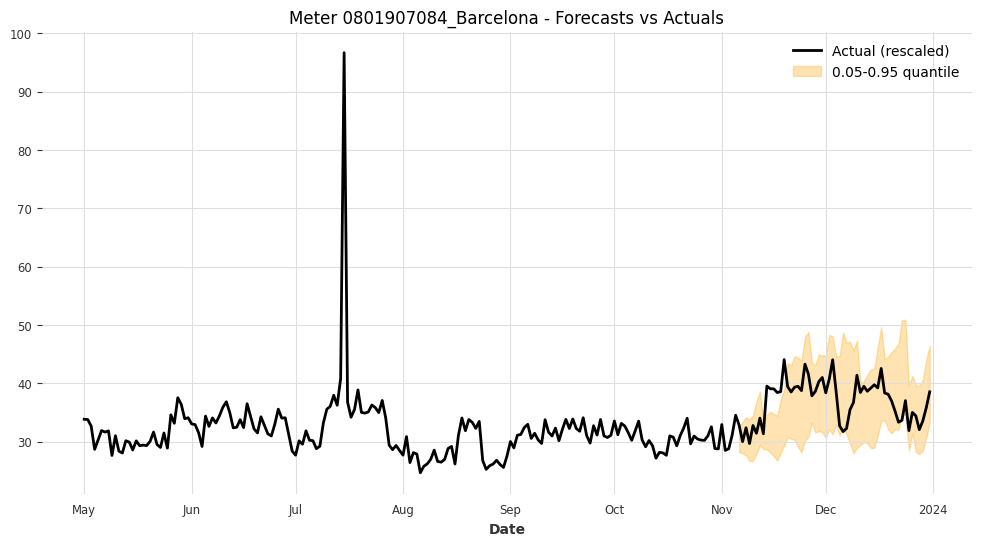

Meter 0801907084_Barcelona - Coverage: 0.8393, Width: 12.2240



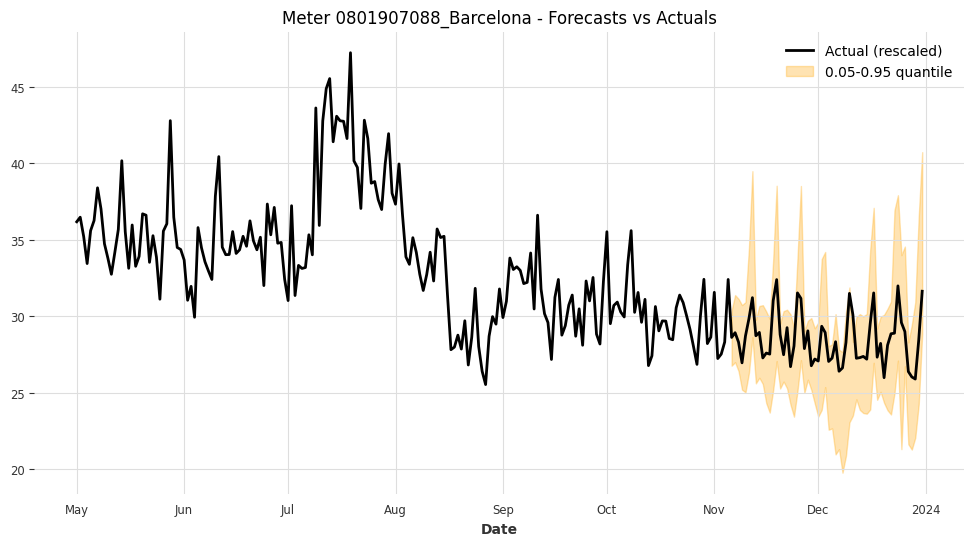

Meter 0801907088_Barcelona - Coverage: 0.9821, Width: 7.1460



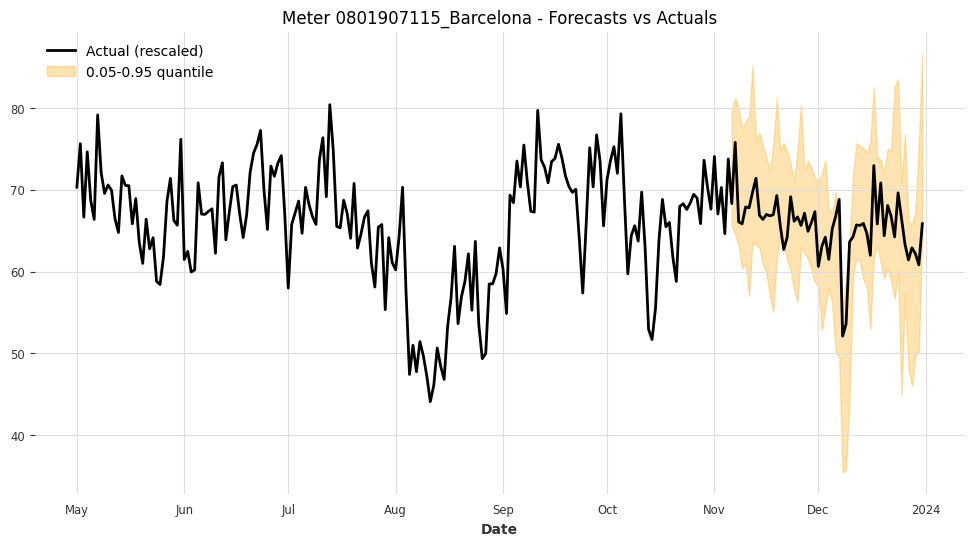

Meter 0801907115_Barcelona - Coverage: 0.9464, Width: 16.6314



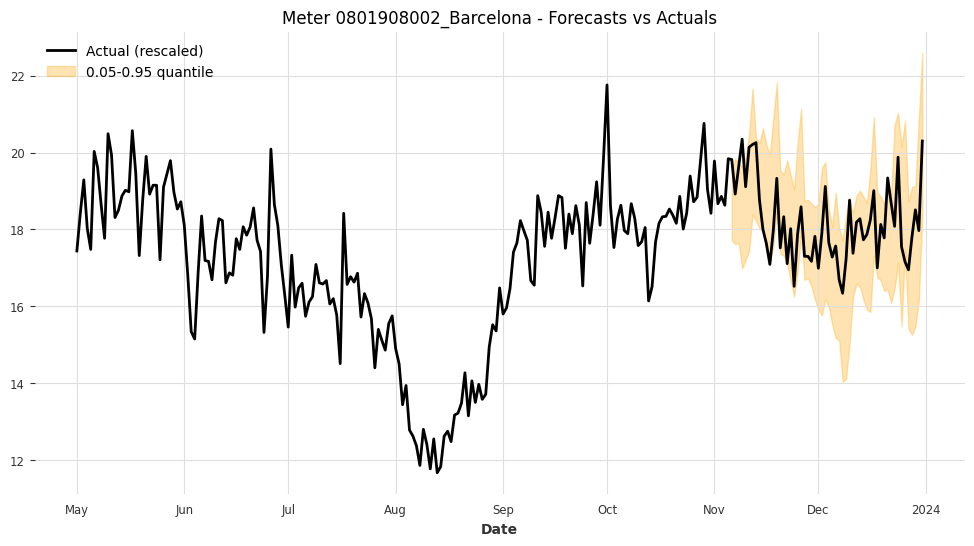

Meter 0801908002_Barcelona - Coverage: 0.9107, Width: 2.9674



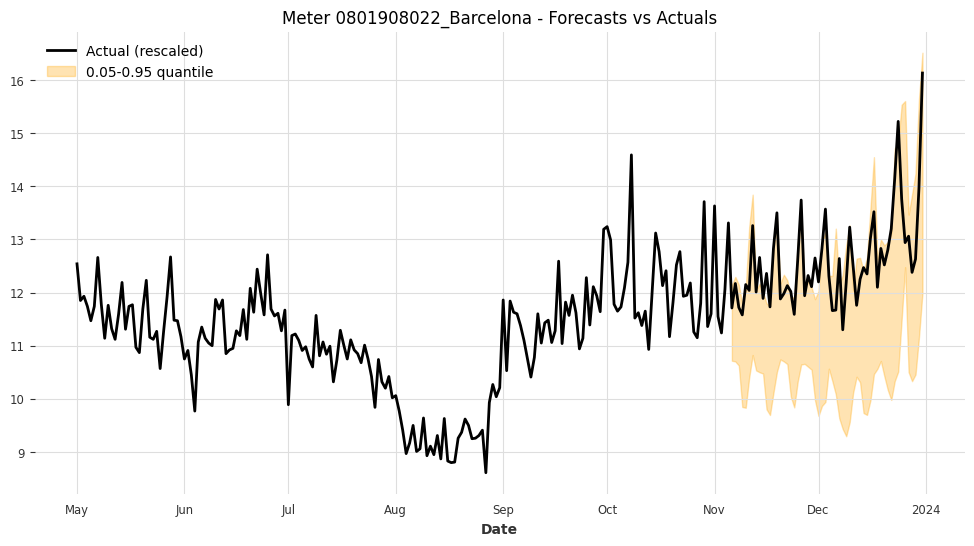

Meter 0801908022_Barcelona - Coverage: 0.6964, Width: 2.5937



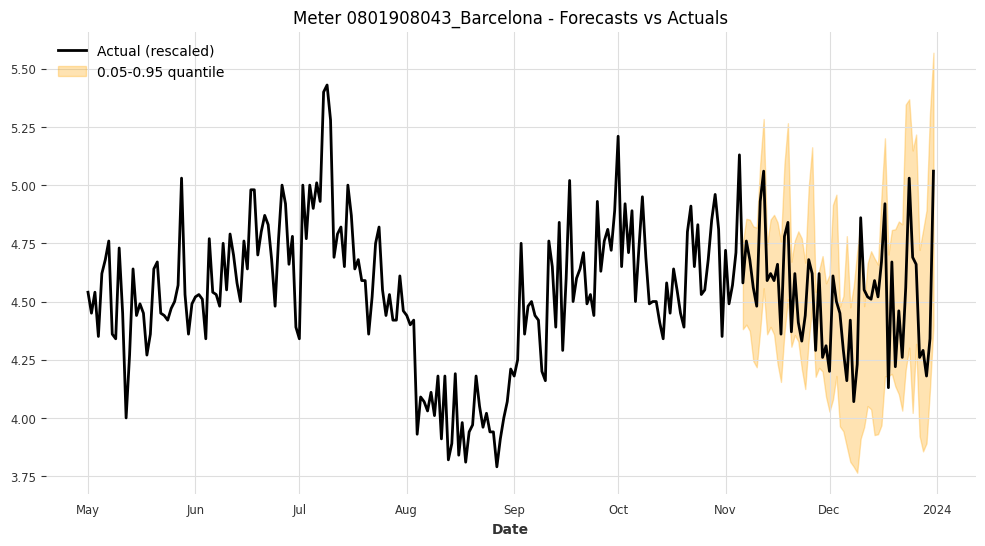

Meter 0801908043_Barcelona - Coverage: 0.9464, Width: 0.6957



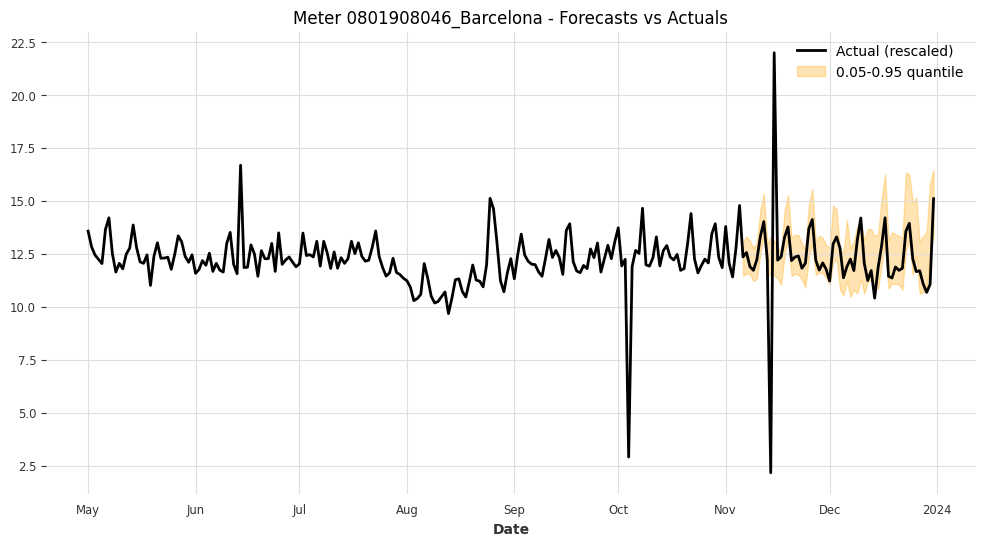

Meter 0801908046_Barcelona - Coverage: 0.8571, Width: 2.2568



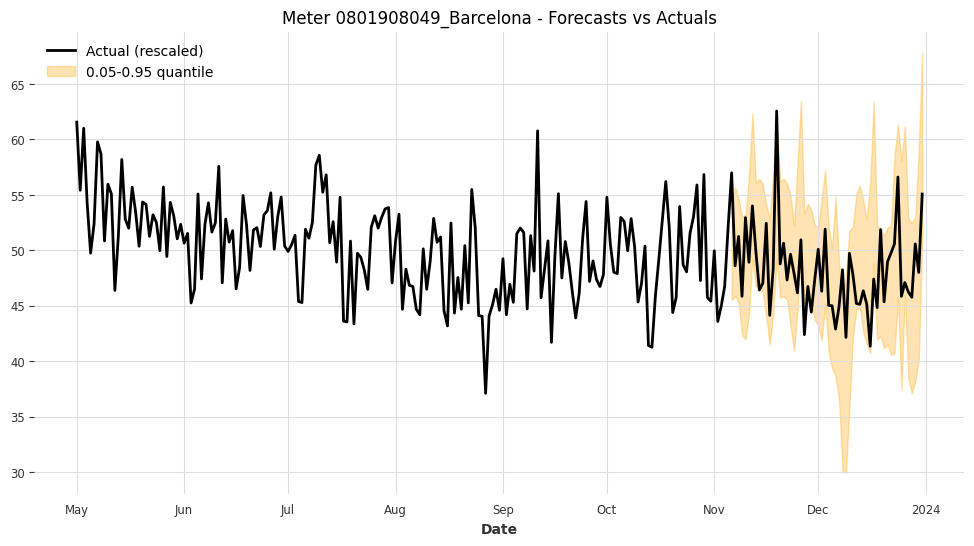

Meter 0801908049_Barcelona - Coverage: 0.8750, Width: 12.2642



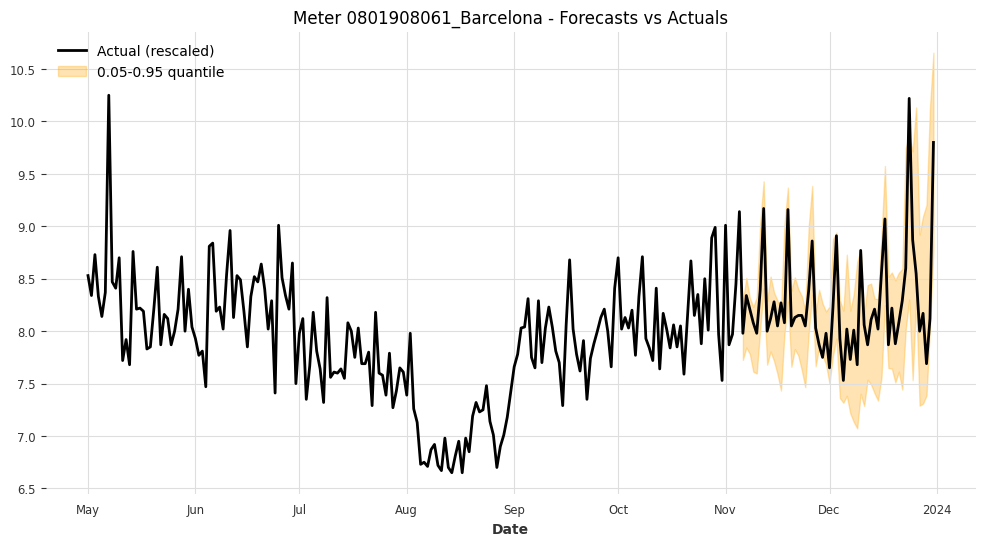

Meter 0801908061_Barcelona - Coverage: 0.9464, Width: 1.0383



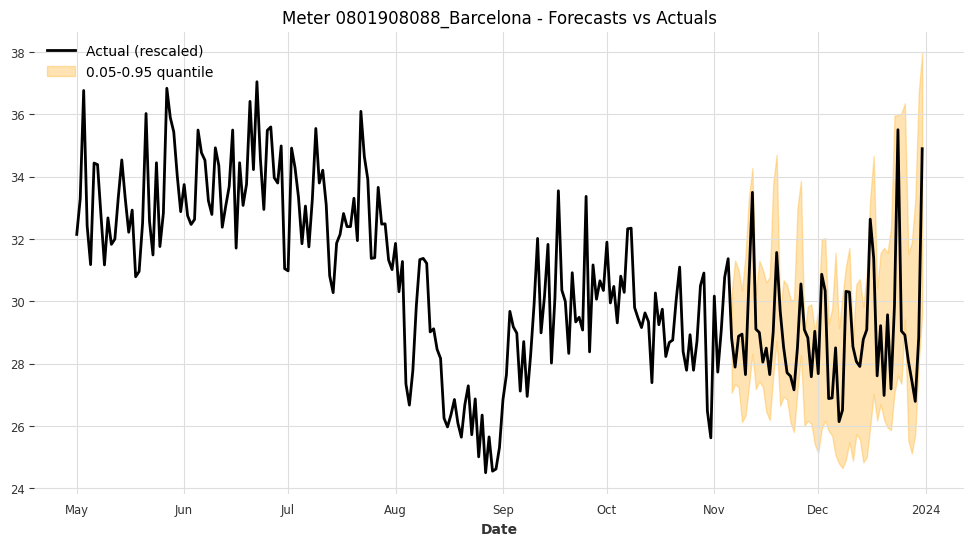

Meter 0801908088_Barcelona - Coverage: 0.9464, Width: 5.3146



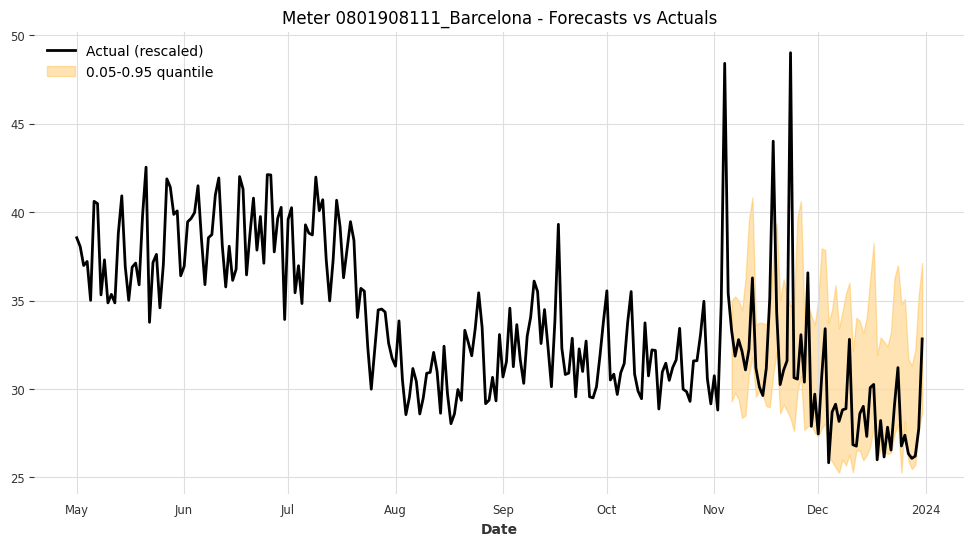

Meter 0801908111_Barcelona - Coverage: 0.8393, Width: 7.3064



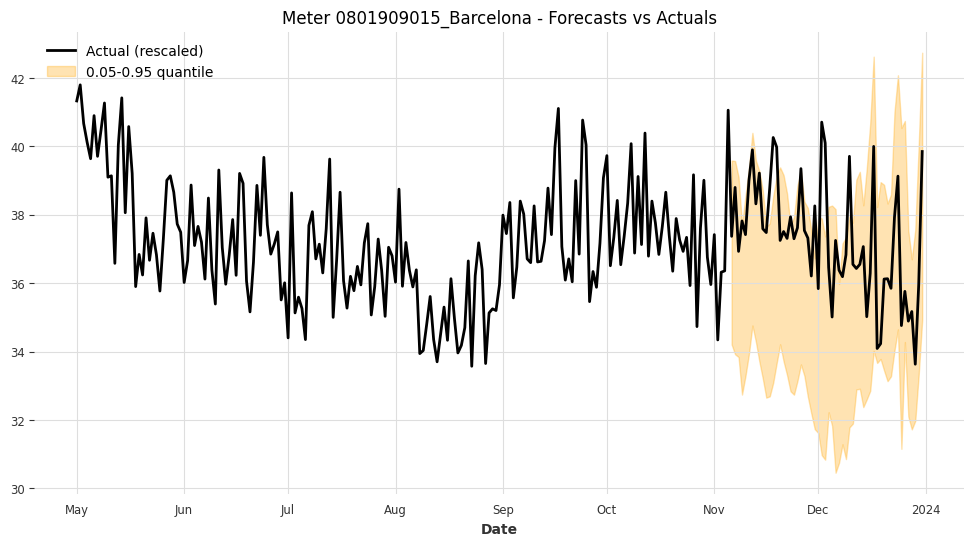

Meter 0801909015_Barcelona - Coverage: 0.8036, Width: 5.9066



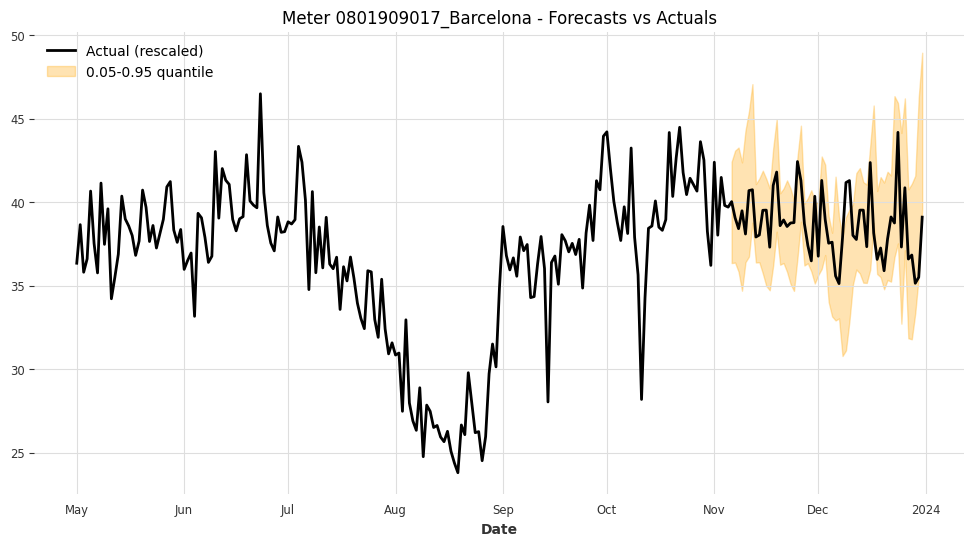

Meter 0801909017_Barcelona - Coverage: 0.8929, Width: 6.6259



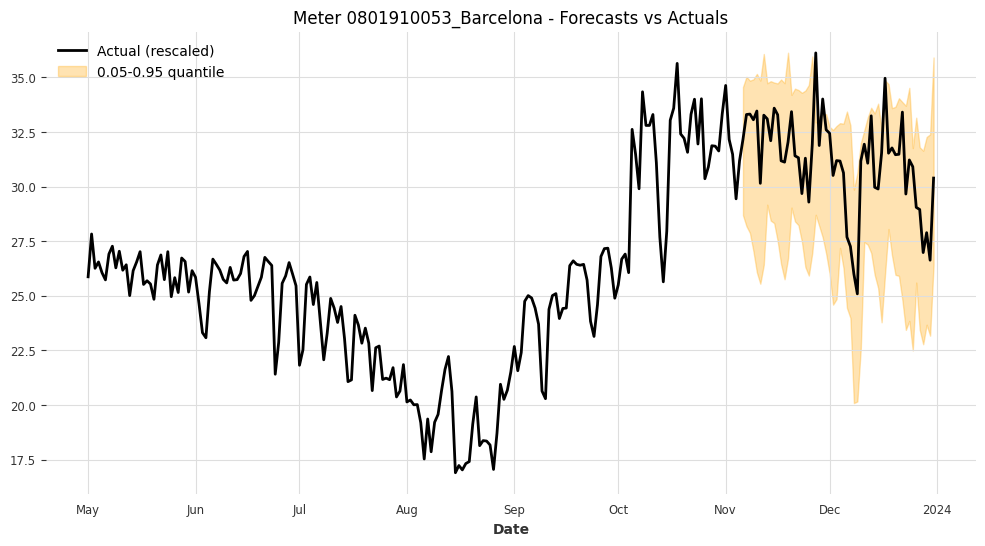

Meter 0801910053_Barcelona - Coverage: 0.9464, Width: 7.7369



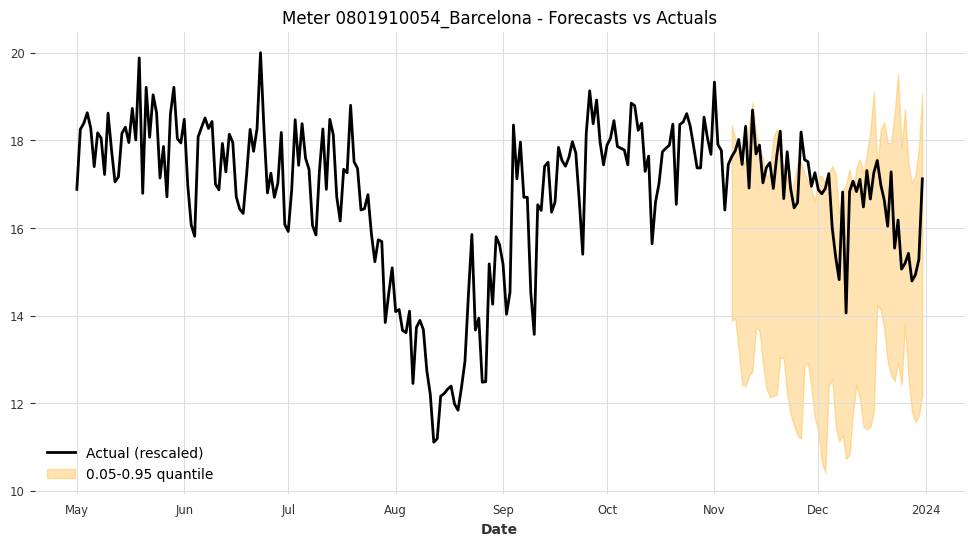

Meter 0801910054_Barcelona - Coverage: 0.7143, Width: 5.3466



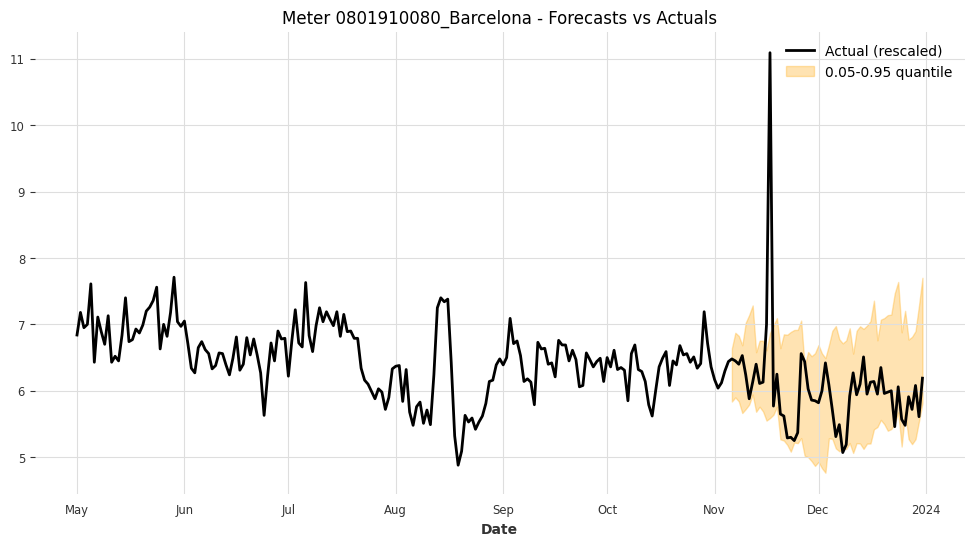

Meter 0801910080_Barcelona - Coverage: 0.8929, Width: 1.5357



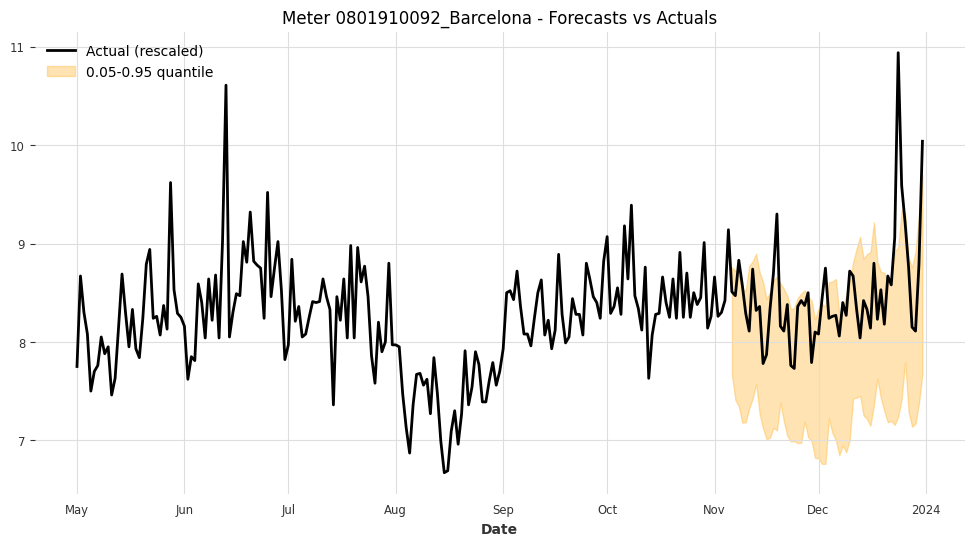

Meter 0801910092_Barcelona - Coverage: 0.7500, Width: 1.5008



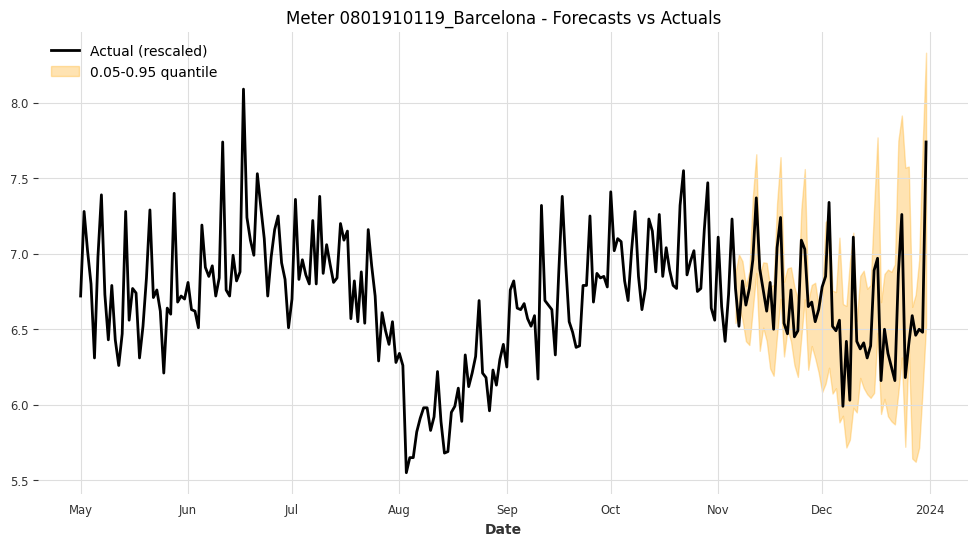

Meter 0801910119_Barcelona - Coverage: 0.8929, Width: 0.8343



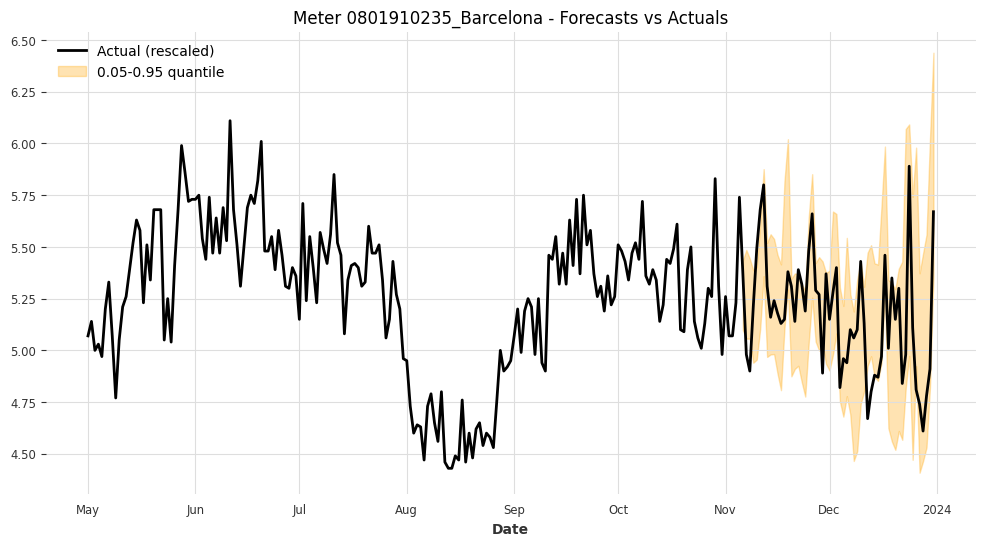

Meter 0801910235_Barcelona - Coverage: 0.8036, Width: 0.6621



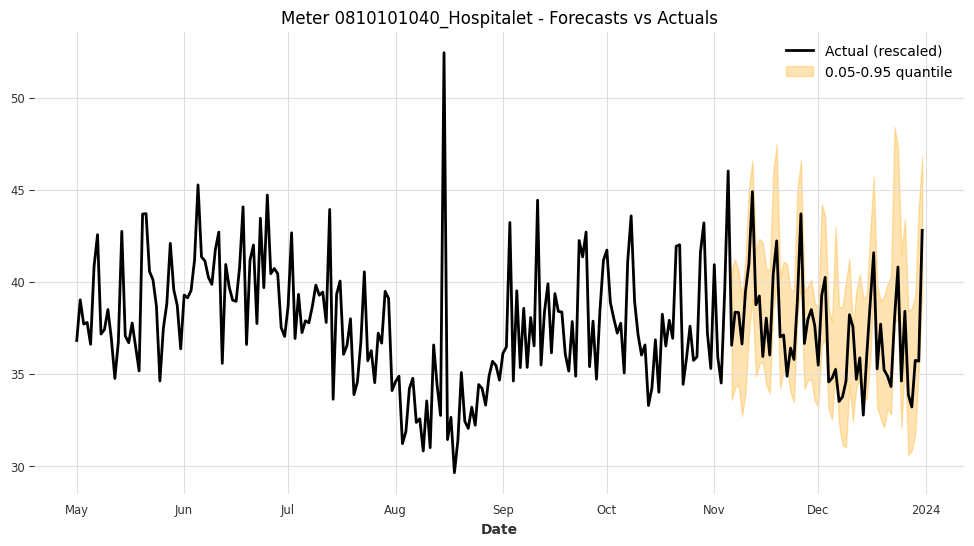

Meter 0810101040_Hospitalet - Coverage: 0.9286, Width: 6.7893



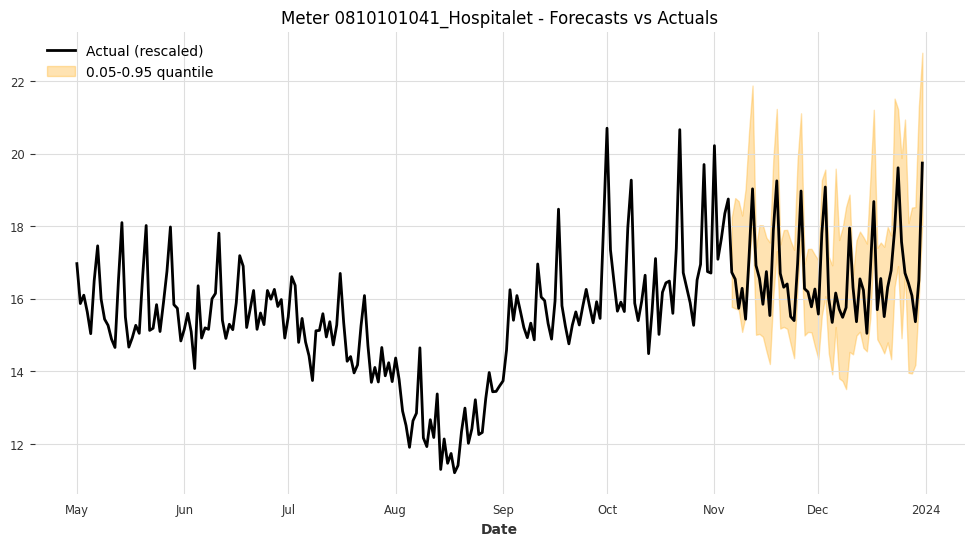

Meter 0810101041_Hospitalet - Coverage: 0.9643, Width: 3.3909



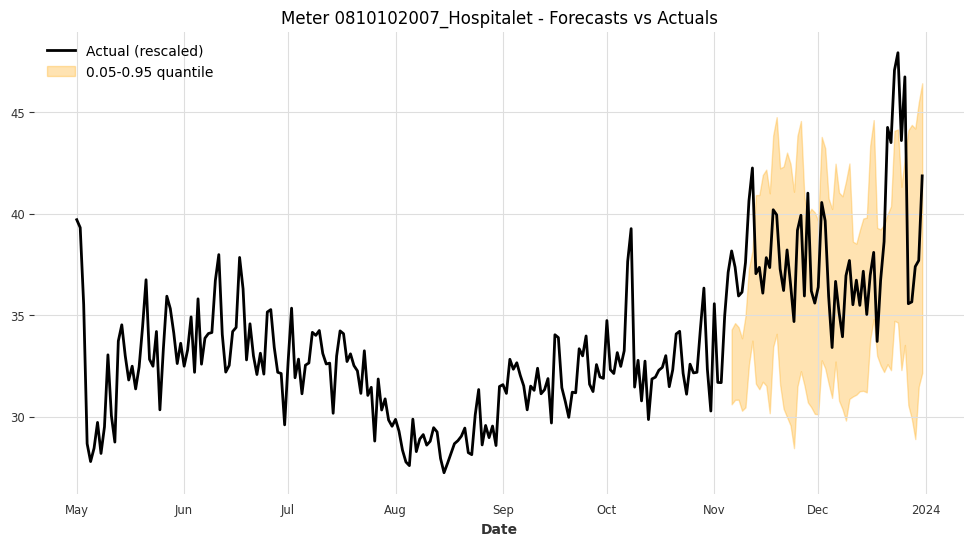

Meter 0810102007_Hospitalet - Coverage: 0.7500, Width: 9.4929



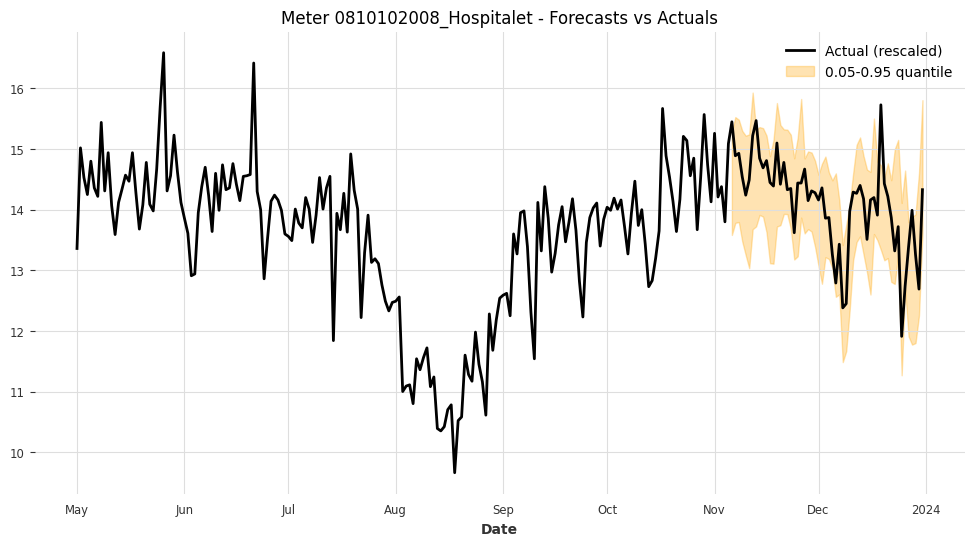

Meter 0810102008_Hospitalet - Coverage: 0.9286, Width: 1.7552



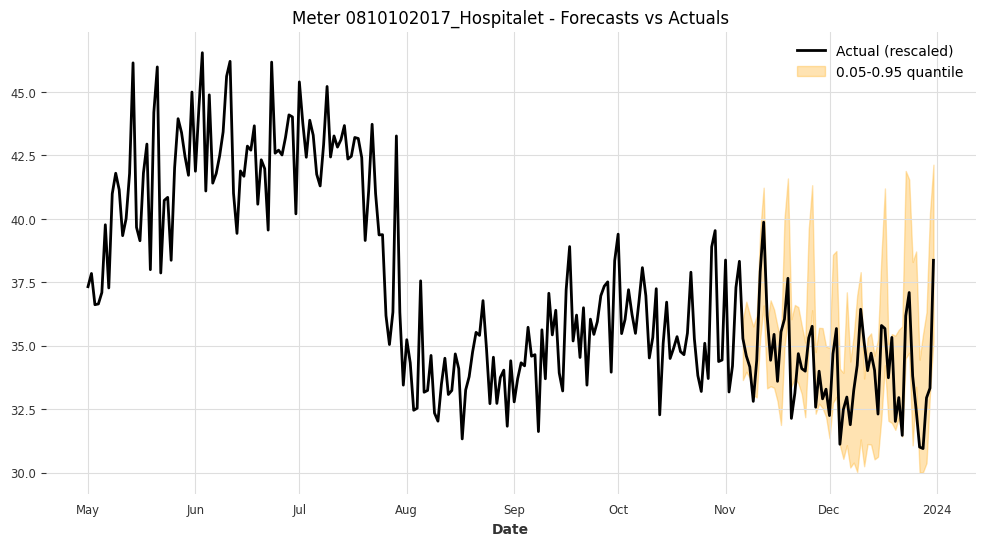

Meter 0810102017_Hospitalet - Coverage: 0.8571, Width: 4.3293



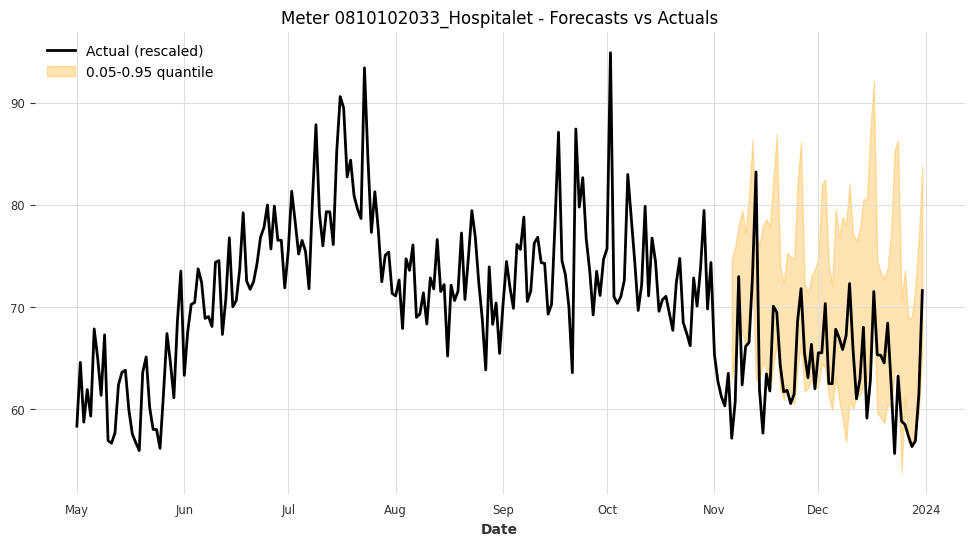

Meter 0810102033_Hospitalet - Coverage: 0.6429, Width: 15.2282



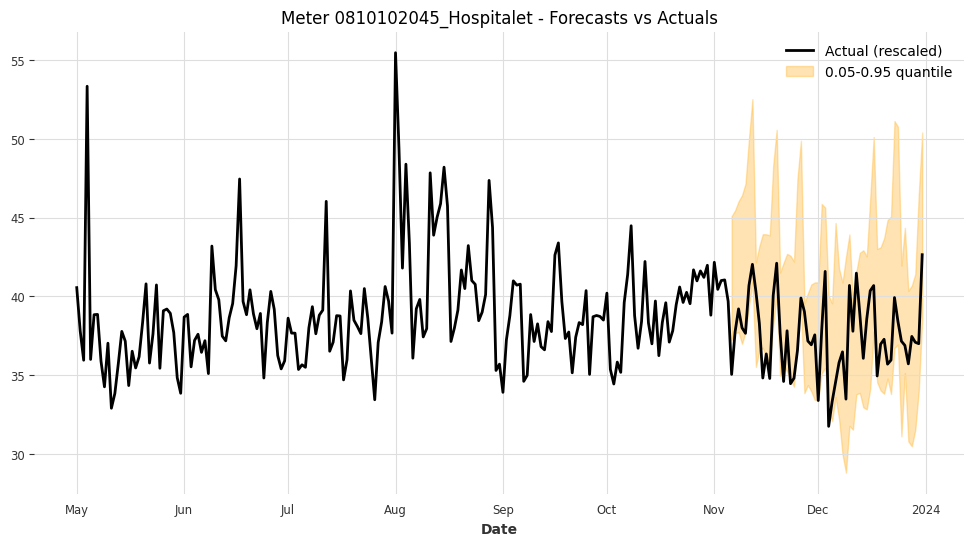

Meter 0810102045_Hospitalet - Coverage: 0.8393, Width: 9.3814



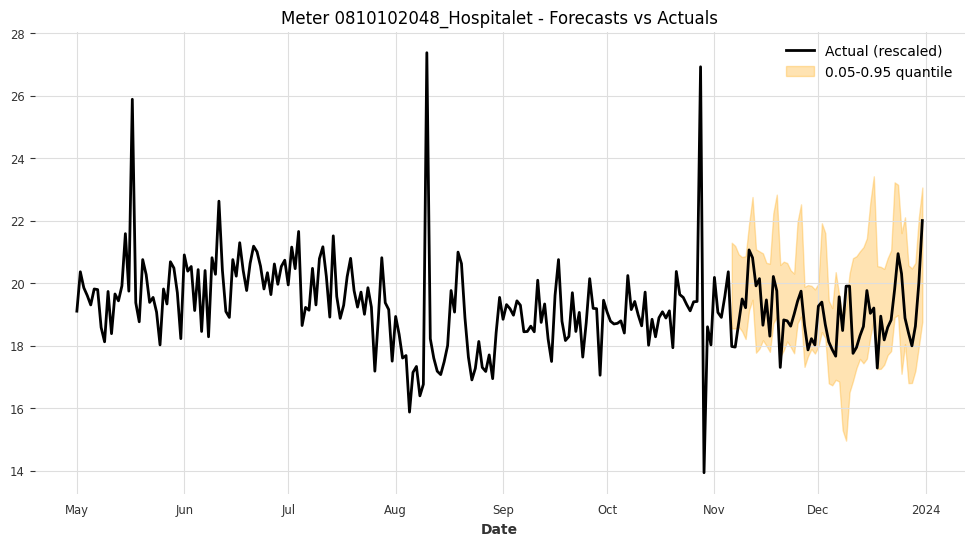

Meter 0810102048_Hospitalet - Coverage: 0.9286, Width: 3.2413



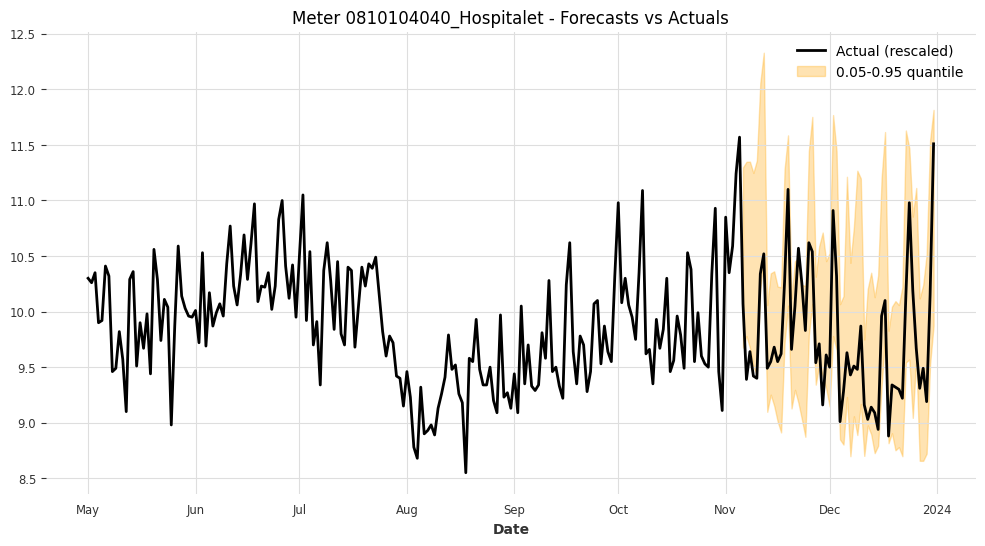

Meter 0810104040_Hospitalet - Coverage: 0.8750, Width: 1.5233



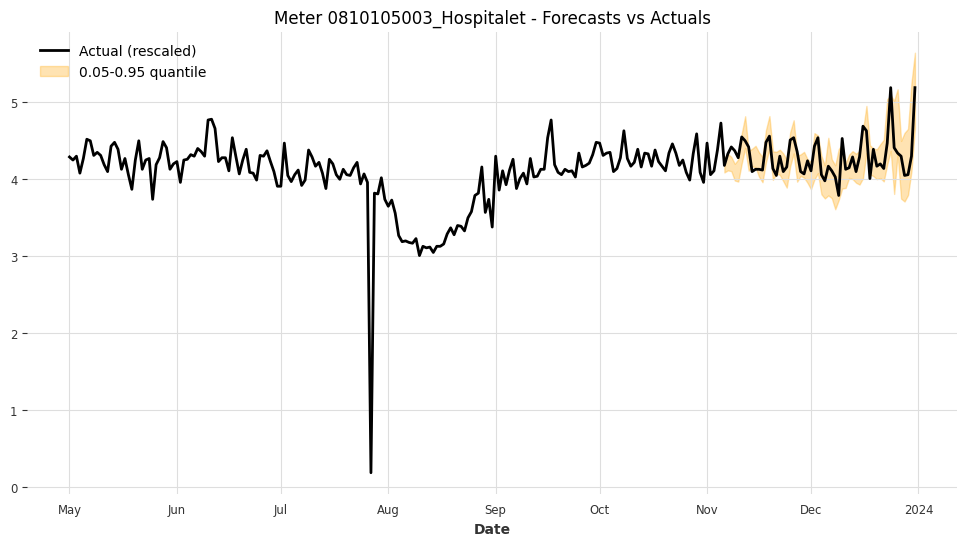

Meter 0810105003_Hospitalet - Coverage: 0.7679, Width: 0.4783



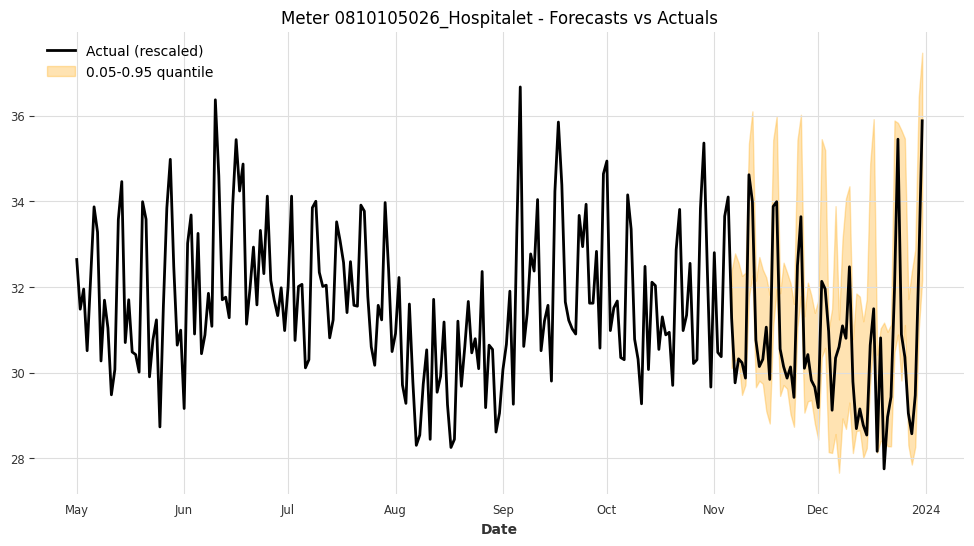

Meter 0810105026_Hospitalet - Coverage: 0.9464, Width: 3.5809



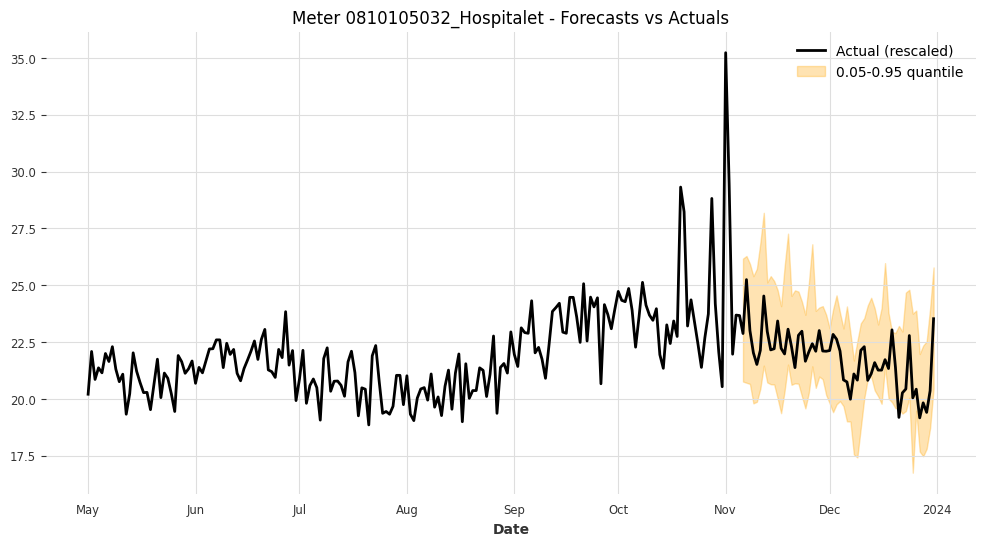

Meter 0810105032_Hospitalet - Coverage: 0.9464, Width: 4.4732



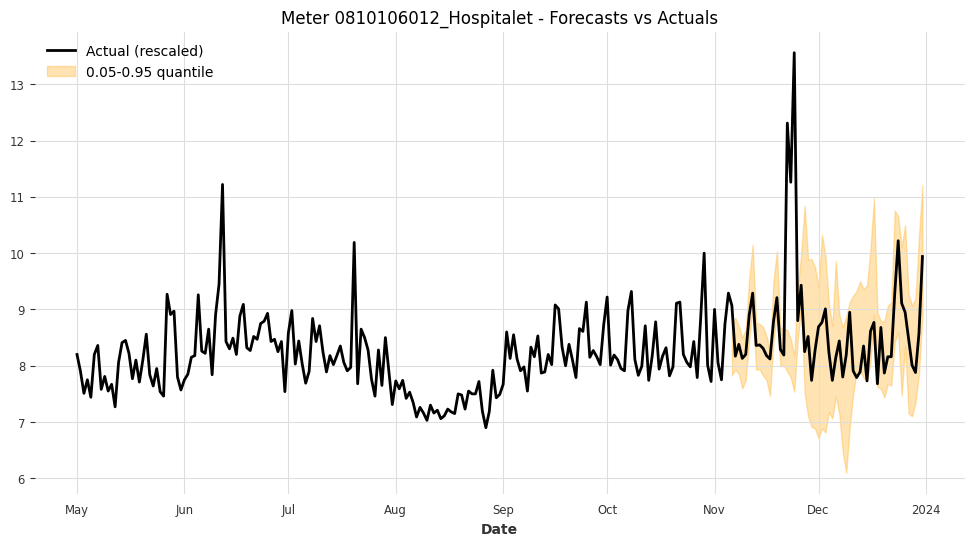

Meter 0810106012_Hospitalet - Coverage: 0.8571, Width: 1.6622



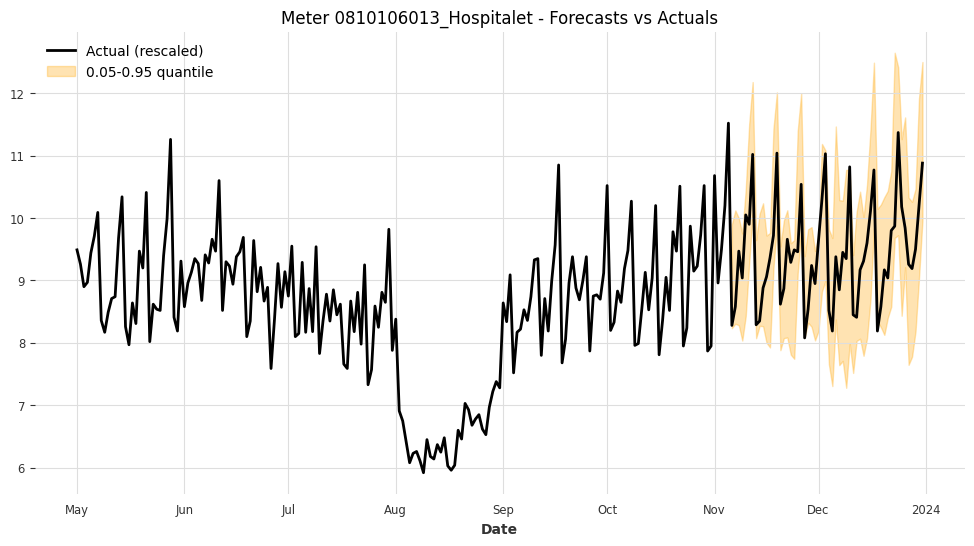

Meter 0810106013_Hospitalet - Coverage: 0.9464, Width: 2.1695



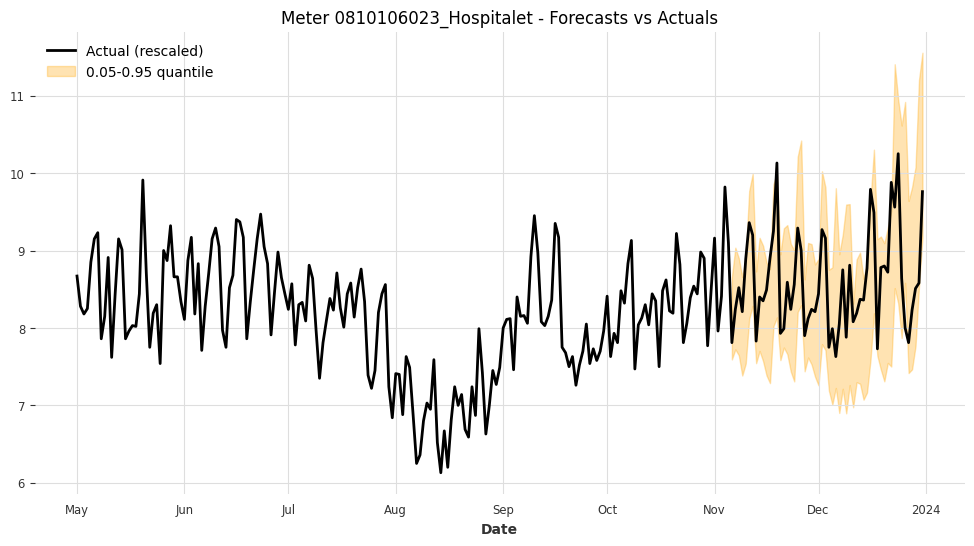

Meter 0810106023_Hospitalet - Coverage: 0.9107, Width: 1.8290



In [ ]:
import matplotlib.pyplot as plt
from darts import concatenate  # Darts utility to merge TimeSeries

for meter_id, hfcs in all_hfcs.items():
    # Get the actual time series
    ts = scaled_calib_test_series[meter_id]

    # Get scaler and results
    scaler = scalers_test[meter_id]
    df_result = all_bt_results[meter_id]
    coverage = df_result["Coverage"].iloc[0]
    width = df_result["Width rescaled"].iloc[0]

    # Start a new plot
    fig, ax = plt.subplots(figsize=(12, 6))

    # Plot actuals (rescaled)
    ts_orig = scaler.inverse_transform(ts)
    ts_orig.plot(ax=ax, label='Actual (rescaled)', lw=2)

    full_lower = []
    full_upper = []

    # Collect lower and upper quantiles from each forecast window
    for forecast in hfcs:
        if ('Consumption per meter_q0.05' in forecast.components
            and 'Consumption per meter_q0.95' in forecast.components):

            lower = forecast['Consumption per meter_q0.05']
            upper = forecast['Consumption per meter_q0.95']
            lower_orig = scaler.inverse_transform(lower)
            upper_orig = scaler.inverse_transform(upper)
            full_lower.append(lower_orig)
            full_upper.append(upper_orig)


    if full_lower and full_upper:
        # Concatenate all the TimeSeries pieces into full series
        combined_lower = concatenate(full_lower)
        combined_upper = concatenate(full_upper)

        # Plot the quantile area as a filled region
        ax.fill_between(
            combined_lower.time_index,
            combined_lower.values().flatten(),
            combined_upper.values().flatten(),
            color='orange',
            alpha=0.3,
            label='0.05-0.95 quantile'
        )

    ax.set_title(f"Meter {meter_id} - Forecasts vs Actuals")
    ax.legend()
    plt.show()

    # Print the metrics below each plot
    print(f"Meter {meter_id} - Coverage: {coverage:.4f}, Width: {width:.4f}\n")


In [ ]:
# Let's finish with the specifically selected test

In [ ]:
# Load model
model = TFTModel.load("/content/drive/MyDrive/Colab Notebooks/TFG/data/02_models/TFT/covariates/TFT_model_covariates.pkl")

In [ ]:
# Load the test data
test_data = joblib.load('/content/drive/MyDrive/Colab Notebooks/TFG/data/01_datasets/train_test_reduced/scaled_test_reduced.pkl')

# Extract components
scaled_val_series = test_data['validation']        # validation not used in our case
scaled_calib_test_series = test_data['calib_test']
scalers_test = test_data['scalers']           # the scalers to reescale the series later

# Reuse the same sorted meter IDs to align
meter_ids_test = sorted(scaled_calib_test_series.keys())

# Build aligned lists
test_series_scaled = [scaled_calib_test_series[meter_id] for meter_id in meter_ids_test]

print(f"Loaded {len(test_series_scaled)} time series for testing.")

Loaded 60 time series for testing.


In [ ]:
# We build the future covariates for the test set
future_covariates_test = []

for test_ts in test_series_scaled:
    test_cov = concatenate([
        datetime_attribute_timeseries(test_ts, "day_of_week", one_hot=True),
        datetime_attribute_timeseries(test_ts, "month", one_hot=True),
        is_weekend_timeseries.slice_intersect(test_ts),
        holiday_timeseries.slice_intersect(test_ts),
        day_of_year_timeseries.slice_intersect(test_ts)
    ], axis=1)

    future_covariates_test.append(test_cov)

In [ ]:
# Constants
start_date = pd.Timestamp("2023-11-6")
horizon = 7
quantiles = [0.05, 0.5, 0.95]
pred_kwargs={"predict_likelihood_parameters": True, "verbose": True}

# Initialize the conformal quantile regression model
cp_model = ConformalQRModel(
    model=model,
    quantiles=quantiles,
    symmetric=False
    # if cal_length is None, it considers all calibration scores
)
q_interval = cp_model.q_interval  # [(0.05, 0.95)]
q_range = cp_model.interval_range  # [0.9]

# Prepare to collect results
all_hfcs = {}
all_bt_results = {}

# We loop over each time series
for meter_id, ts, fcov in zip(meter_ids_test, test_series_scaled, future_covariates_test):
    # Historical forecasts
    hfcs = cp_model.historical_forecasts(
        series=ts,
        future_covariates=fcov,
        forecast_horizon=7,
        start=start_date,
        last_points_only=False,
        stride=7,
        **pred_kwargs,
    )

    scaler = scalers_test[meter_id]
    widths = []

    for forecast in hfcs:
        q05 = forecast["Consumption per meter_q0.05"]
        q95 = forecast["Consumption per meter_q0.95"]
        q05_orig = scaler.inverse_transform(q05)
        q95_orig = scaler.inverse_transform(q95)
        width = (q95_orig - q05_orig).values()
        widths.append(width)

    mean_width = np.mean([np.mean(w) for w in widths])

    # We evaluate the already-generated historical forecasts
    bt = cp_model.backtest(
        ts,
        future_covariates=fcov,
        historical_forecasts=hfcs,
        last_points_only=False,
        metric=[metrics.mic, metrics.miw],
        metric_kwargs={"q_interval": q_interval},
    )
    df_results = pd.DataFrame({"Interval": q_range, "Coverage": bt[0], "Width": bt[1], "Width rescaled": mean_width})
    print(f"Results for meter {meter_id}:\n", df_results, "\n")

    # Store results
    all_hfcs[meter_id] = hfcs
    all_bt_results[meter_id] = df_results

# We combine results across meters
combined_results = pd.concat(all_bt_results.values(), keys=all_bt_results.keys())
combined_results.reset_index(level=1, drop=True, inplace=True)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 451.21it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801902043_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  0.242807        2.882119 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 277.98it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801903008_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.164895        3.258321 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 430.59it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801903021_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.397082        1.628038 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 443.18it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801903026_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.274693        1.975044 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 439.71it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801903035_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.267408        0.748744 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 390.46it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801903037_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.362843        2.133517 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 414.43it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801903213_Barcelona:
    Interval  Coverage    Width  Width rescaled
0       0.9       1.0  0.32049         0.49035 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 439.74it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801904027_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.193373        3.074624 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 440.94it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801904047_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  0.199027        3.023221 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 285.15it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801904049_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.354367         3.18576 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 414.08it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801905057_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.234766        2.589464 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 443.46it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801906071_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.272322        1.440582 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 337.97it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0801910007_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.306427        1.002018 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 436.43it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0807302003_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  0.216029        6.811407 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 442.51it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0807710008_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.857143  0.184731       76.848134 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 437.95it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810101004_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.353075        8.127785 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 466.73it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810101011_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.262517        3.935126 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 329.78it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810101018_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.857143  0.287808        1.450551 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 423.17it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810101019_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  0.219488        1.549586 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 443.18it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810101024_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.401063        3.453149 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 301.60it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810101029_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  0.273512        6.758471 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 427.42it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810101033_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  0.380248        5.821591 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 304.97it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810101039_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.325423        4.777208 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 412.62it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810101040_Hospitalet:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.964286  0.34388        6.877607 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 438.20it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810102005_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9     0.875  0.285056        2.690927 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 426.19it/s]


Results for meter 0810102007_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.714286  0.487596        6.840978 



INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 401.04it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810102016_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.283706         4.05132 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 454.80it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810102024_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.435464        3.100506 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 438.47it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810102034_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.285909        7.899675 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 339.58it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810102038_Hospitalet:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.910714  0.45922        6.525513 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 466.73it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810102039_Hospitalet:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.946429  0.48084        7.289538 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 252.58it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810102045_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.839286  0.365975        9.068867 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 418.76it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810102048_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  0.150412        3.642969 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 291.18it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810102049_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  0.413971        3.928587 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 426.44it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810103002_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.785714  0.697028        1.366175 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 447.91it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810103006_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.237254         6.16148 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 445.31it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810103011_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.333734        3.844617 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 427.44it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810103012_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.284196        0.431978 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 351.18it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810103018_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.347602        2.141228 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 411.33it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810103022_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.291676        3.788876 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 407.19it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810104007_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  0.327803        3.894299 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 290.21it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810104010_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9     0.875  0.406957        2.746961 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 453.68it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810104011_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.128517        3.521359 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 457.69it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810104033_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.322702        3.633629 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 389.47it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810104035_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.407109        0.944493 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 440.79it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810104040_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.369182        1.657628 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 356.74it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810105001_Hospitalet:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.964286  0.20377         0.66429 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 250.18it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810105007_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  0.311345         5.83461 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 406.12it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810105018_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9     0.875  0.406083          2.8304 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 321.32it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810106005_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  0.124426         1.17956 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 377.95it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810106008_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9     0.875  0.274132        1.499503 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 443.77it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810106010_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.235871        1.191149 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 435.03it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810106014_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.414407         1.64105 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 475.04it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810106016_Hospitalet:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.892857  0.22822        0.894623 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 403.23it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810106019_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  0.258368        1.100646 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 466.10it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810106021_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.130523        1.563669 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 450.49it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810106022_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.839286  0.336249         1.02556 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 438.72it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810106023_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  0.316274        1.891321 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 461.20it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Results for meter 0810106026_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.839286  0.167551          0.5747 



Predicting: |          | 0/? [00:00<?, ?it/s]

conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 337.91it/s]

Results for meter 0810106032_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.384683        2.165765 



In [ ]:
mean_coverage = combined_results["Coverage"].mean()
mean_width = combined_results["Width"].mean()
mean_width_rescaled = combined_results["Width rescaled"].mean()

print(f"Mean Coverage: {mean_coverage:.4f}")
print(f"Mean Width: {mean_width:.4f}")
print(f"Mean Width rescaled: {mean_width_rescaled:.4f}")

Mean Coverage: 0.9193
Mean Width: 0.3072
Mean Width rescaled: 4.4512


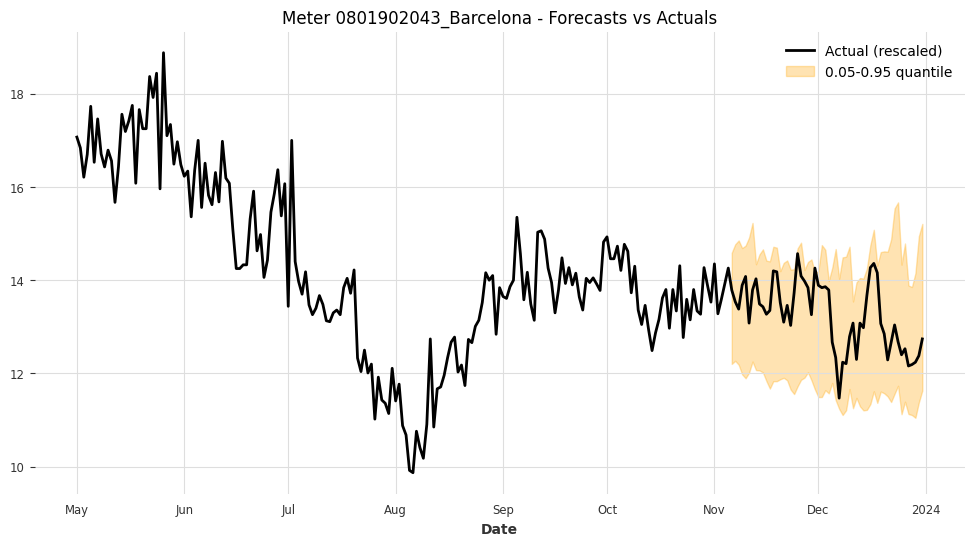

Meter 0801902043_Barcelona - Coverage: 0.9821, Width: 2.8821



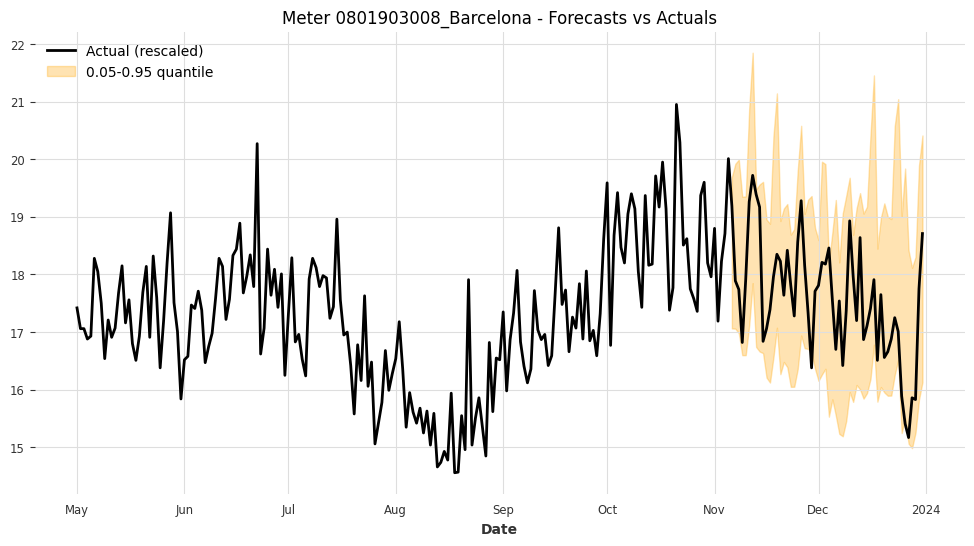

Meter 0801903008_Barcelona - Coverage: 0.9464, Width: 3.2583



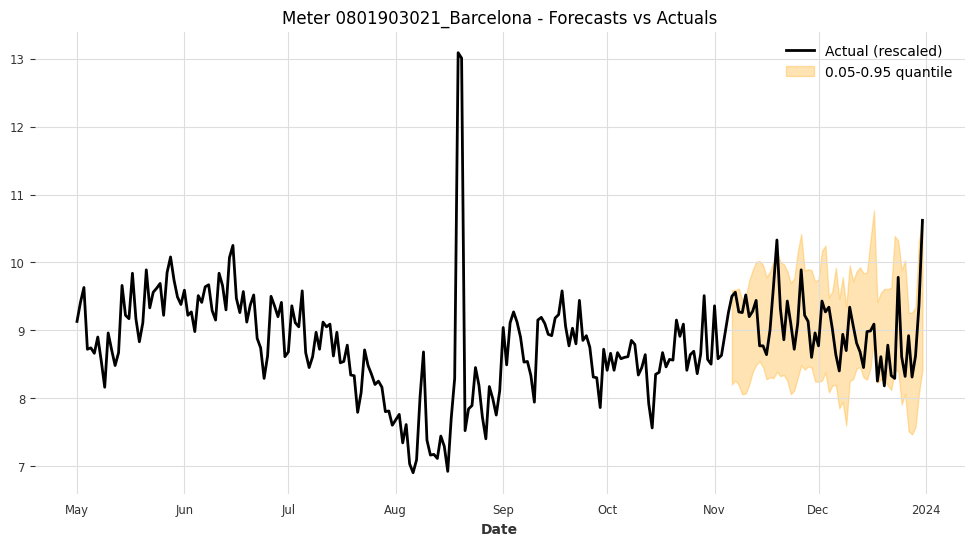

Meter 0801903021_Barcelona - Coverage: 0.9107, Width: 1.6280



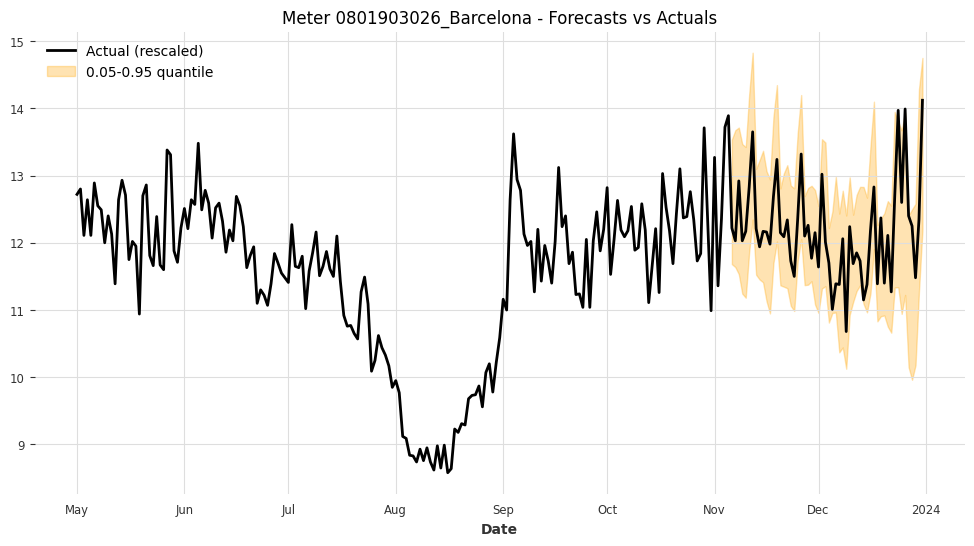

Meter 0801903026_Barcelona - Coverage: 0.9464, Width: 1.9750



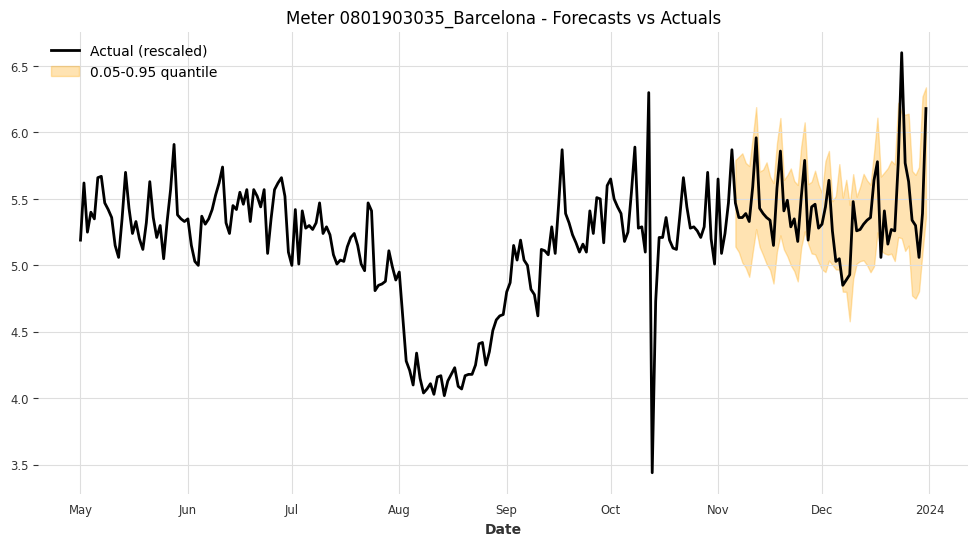

Meter 0801903035_Barcelona - Coverage: 0.9643, Width: 0.7487



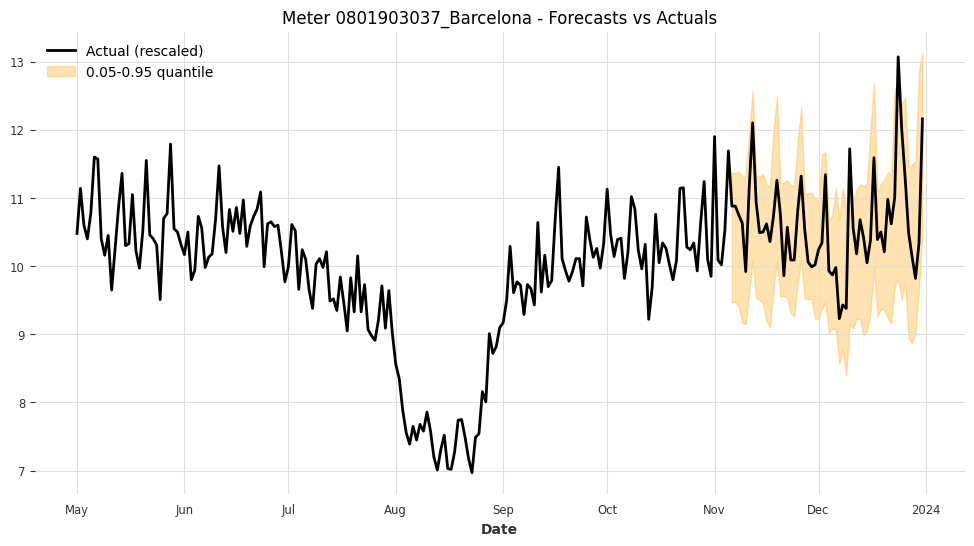

Meter 0801903037_Barcelona - Coverage: 0.9643, Width: 2.1335



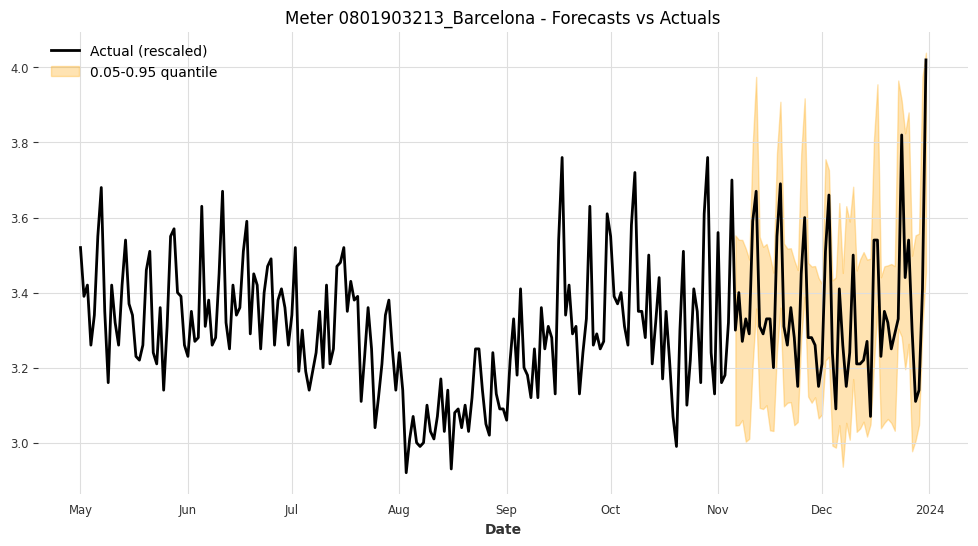

Meter 0801903213_Barcelona - Coverage: 1.0000, Width: 0.4904



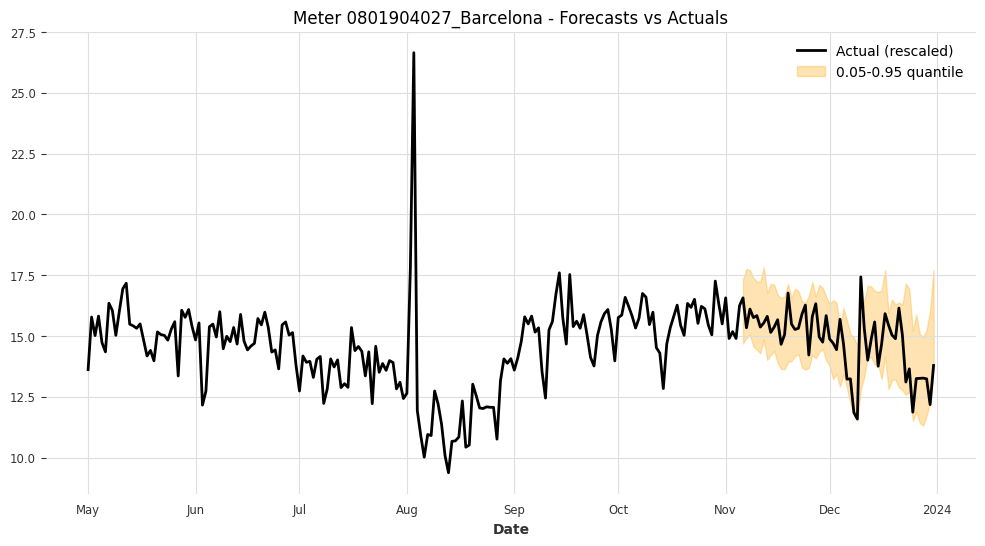

Meter 0801904027_Barcelona - Coverage: 0.9107, Width: 3.0746



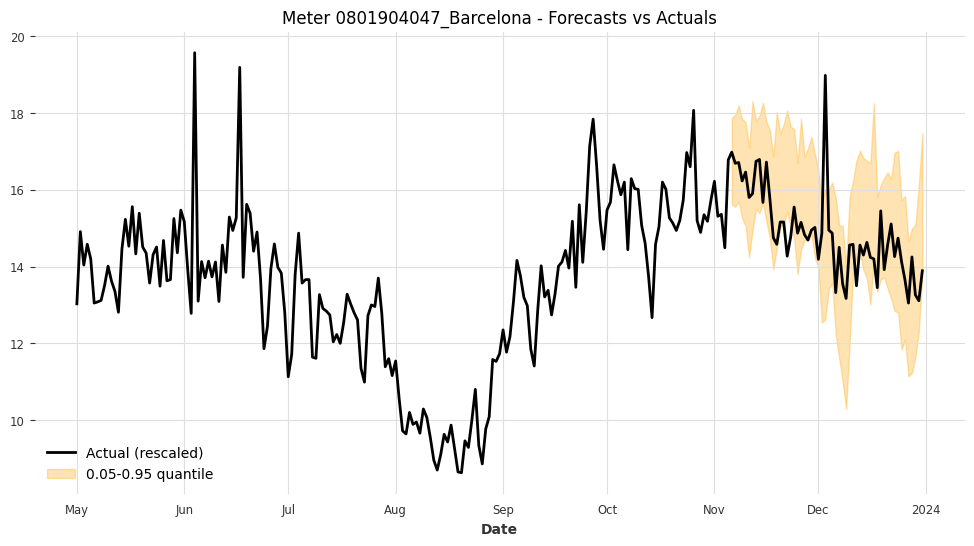

Meter 0801904047_Barcelona - Coverage: 0.9286, Width: 3.0232



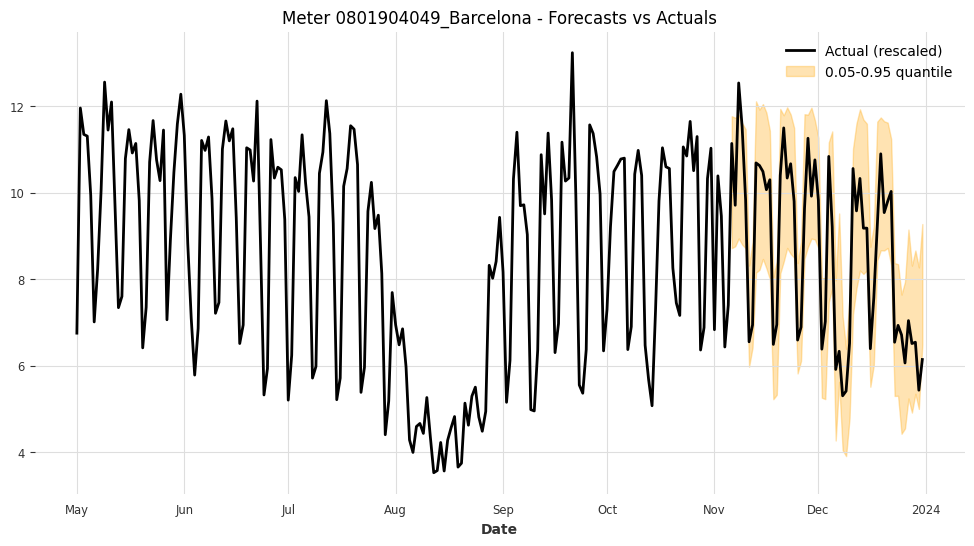

Meter 0801904049_Barcelona - Coverage: 0.9643, Width: 3.1858



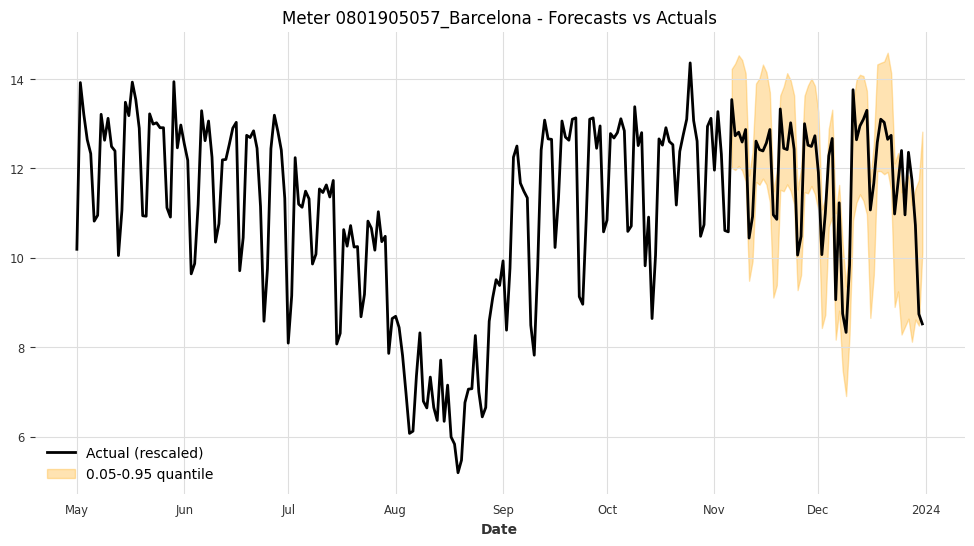

Meter 0801905057_Barcelona - Coverage: 0.9107, Width: 2.5895



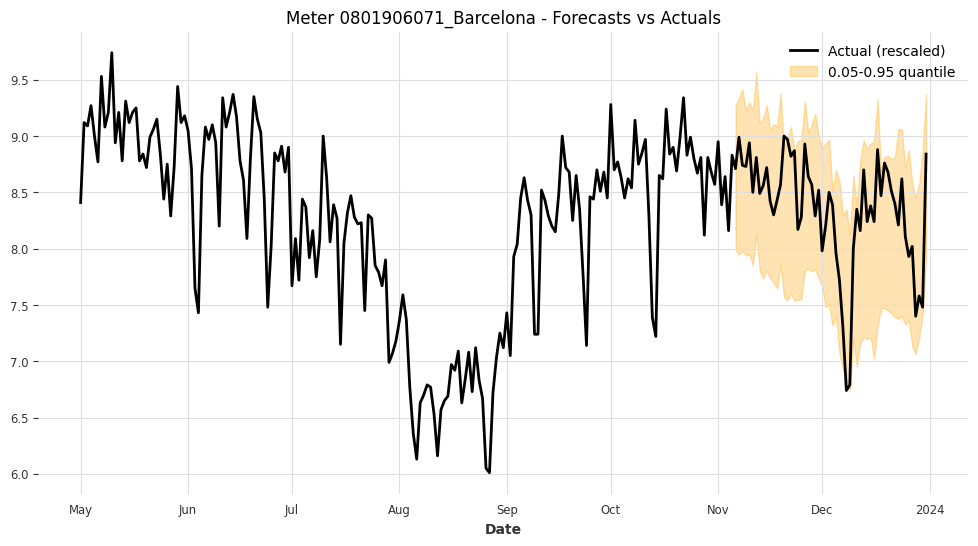

Meter 0801906071_Barcelona - Coverage: 0.9464, Width: 1.4406



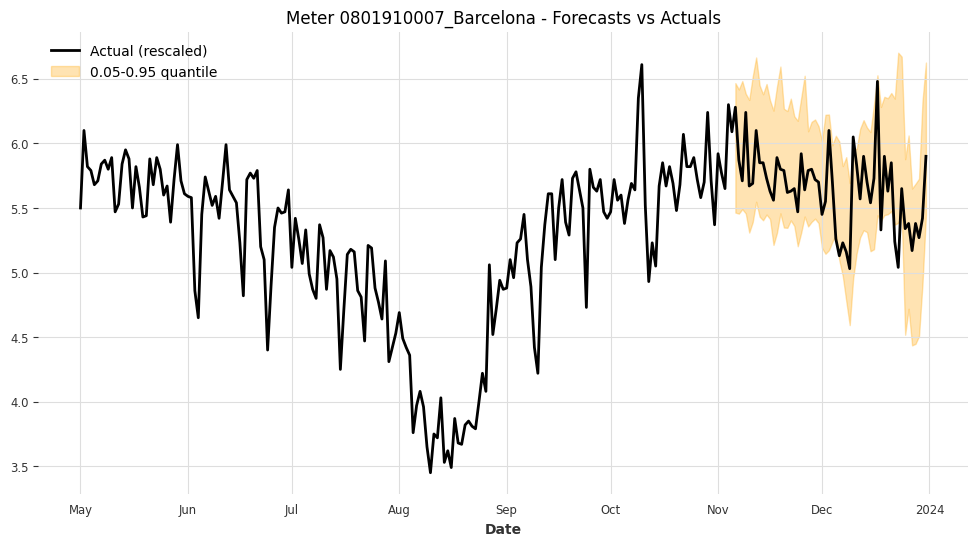

Meter 0801910007_Barcelona - Coverage: 0.9107, Width: 1.0020



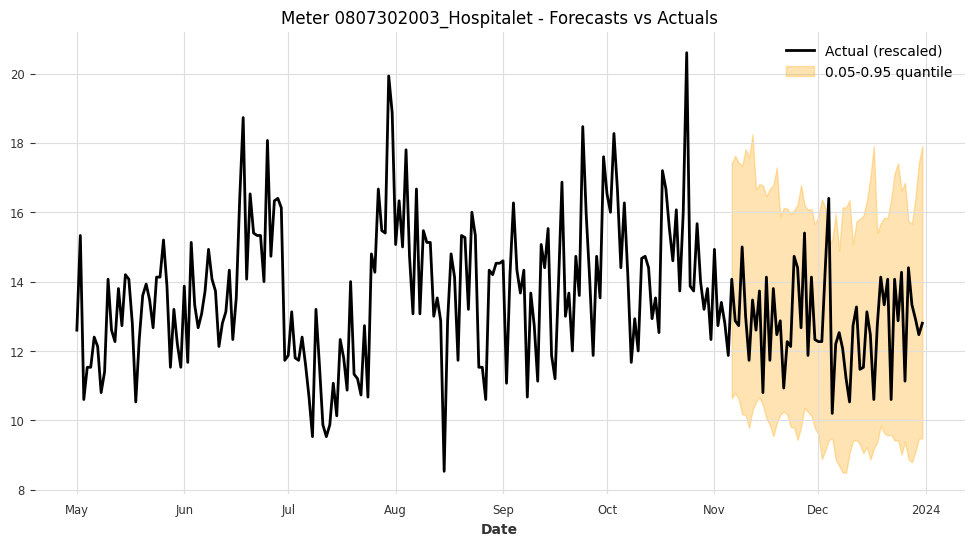

Meter 0807302003_Hospitalet - Coverage: 0.9821, Width: 6.8114



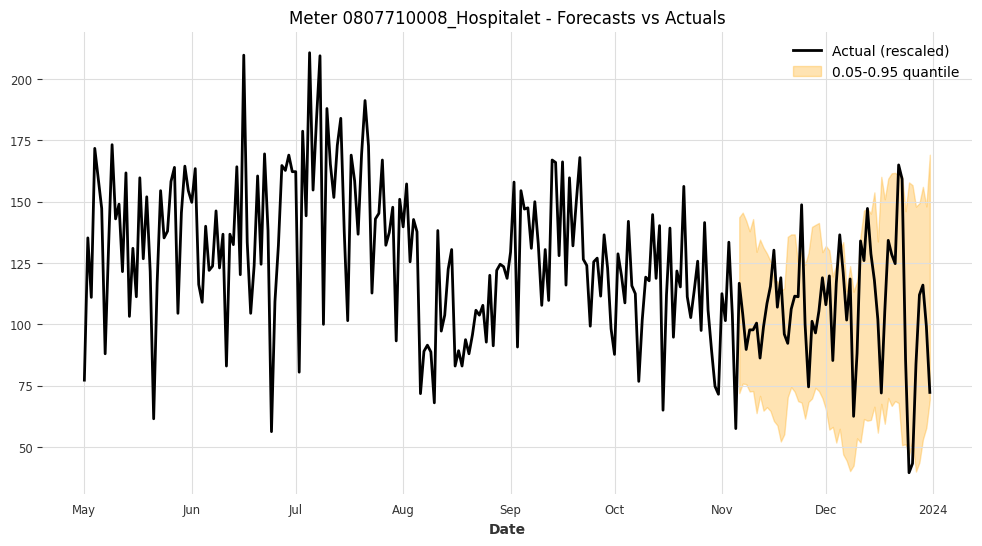

Meter 0807710008_Hospitalet - Coverage: 0.8571, Width: 76.8481



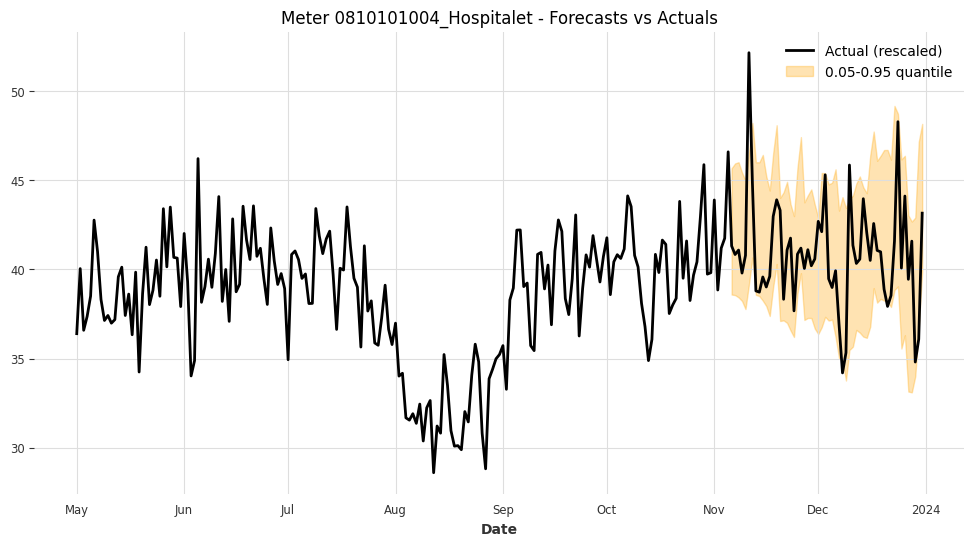

Meter 0810101004_Hospitalet - Coverage: 0.9107, Width: 8.1278



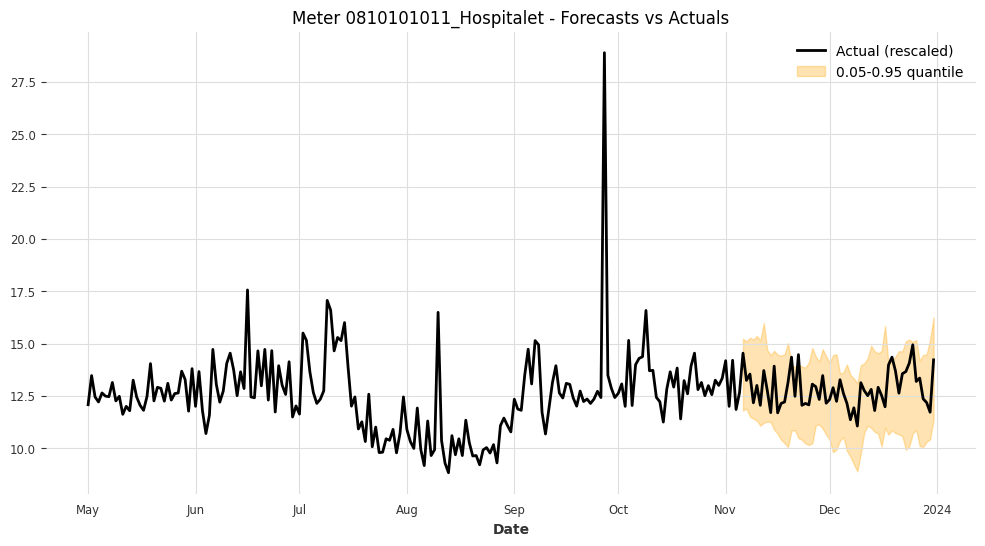

Meter 0810101011_Hospitalet - Coverage: 0.9464, Width: 3.9351



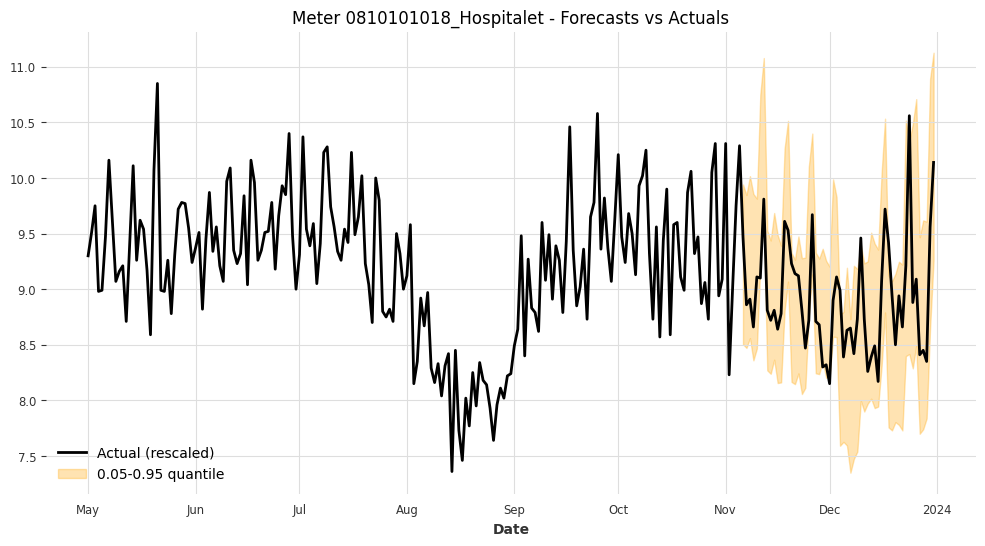

Meter 0810101018_Hospitalet - Coverage: 0.8571, Width: 1.4506



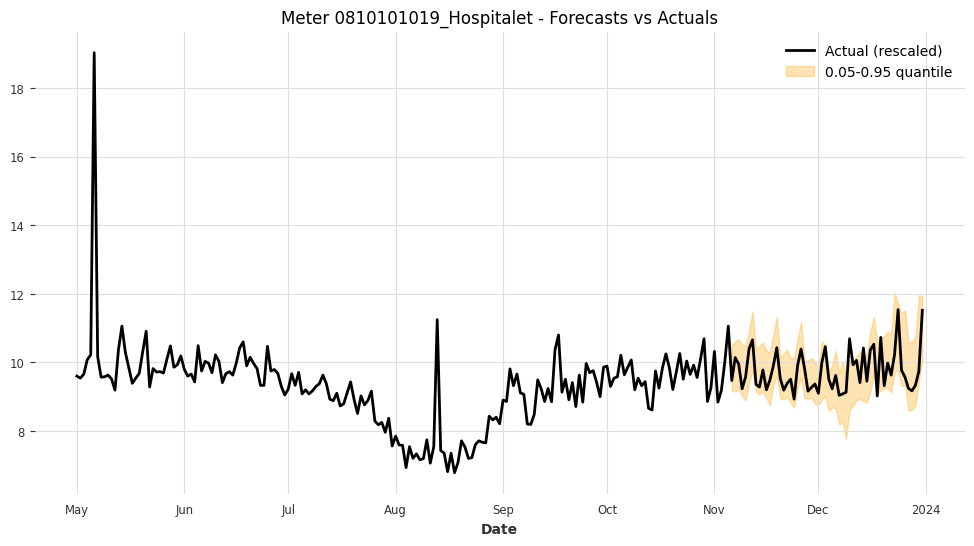

Meter 0810101019_Hospitalet - Coverage: 0.9286, Width: 1.5496



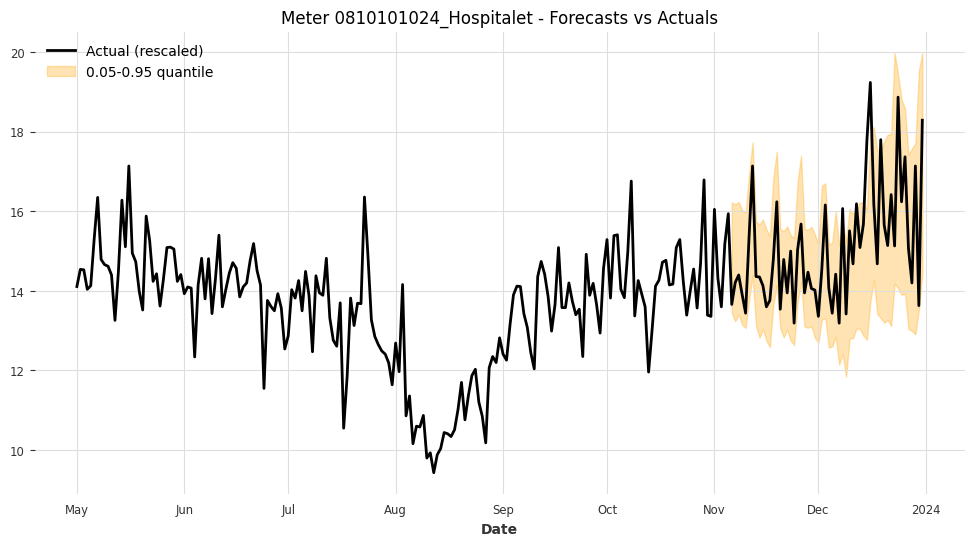

Meter 0810101024_Hospitalet - Coverage: 0.9107, Width: 3.4531



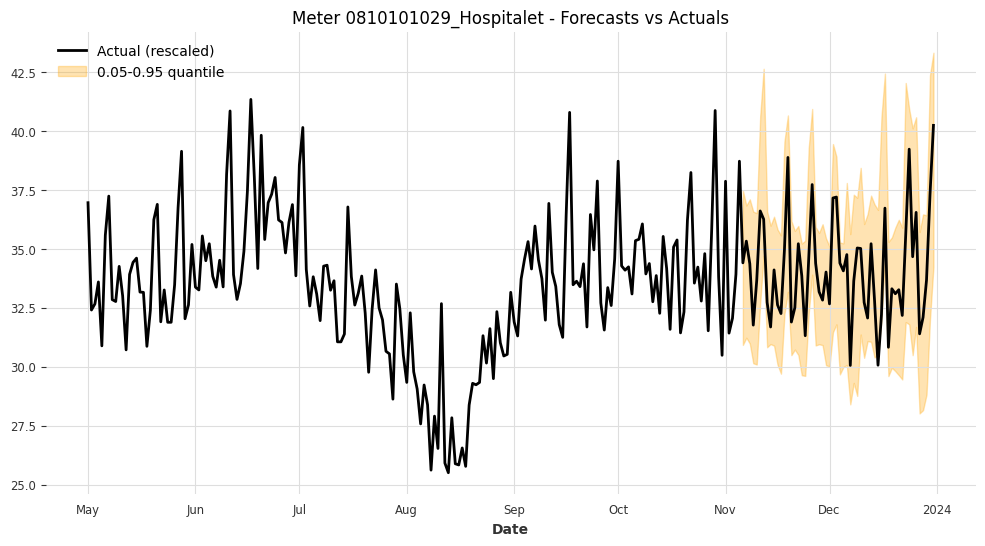

Meter 0810101029_Hospitalet - Coverage: 0.9821, Width: 6.7585



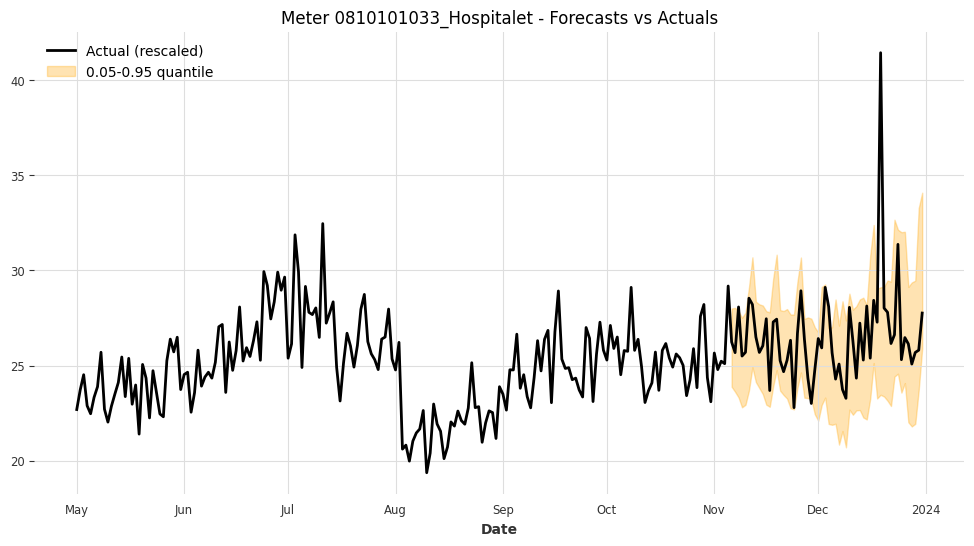

Meter 0810101033_Hospitalet - Coverage: 0.9286, Width: 5.8216



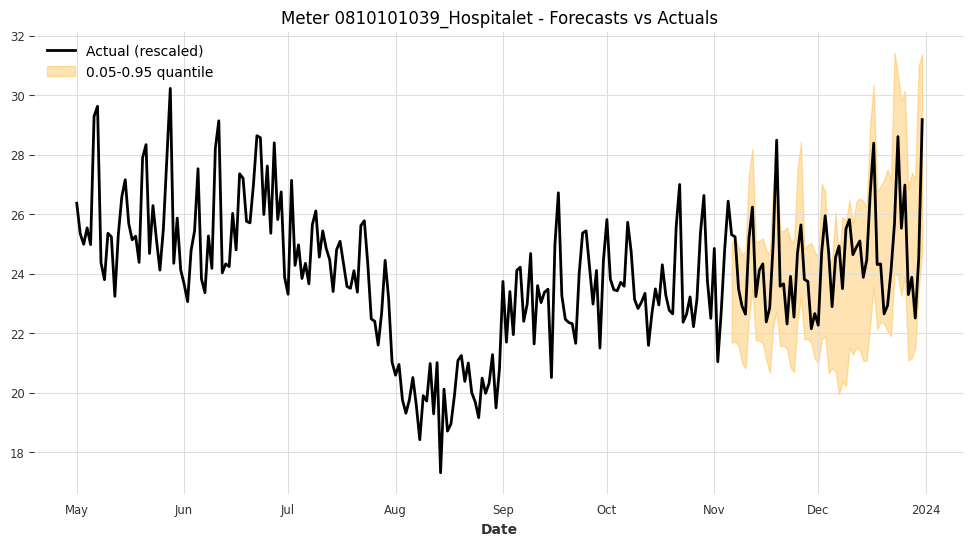

Meter 0810101039_Hospitalet - Coverage: 0.9107, Width: 4.7772



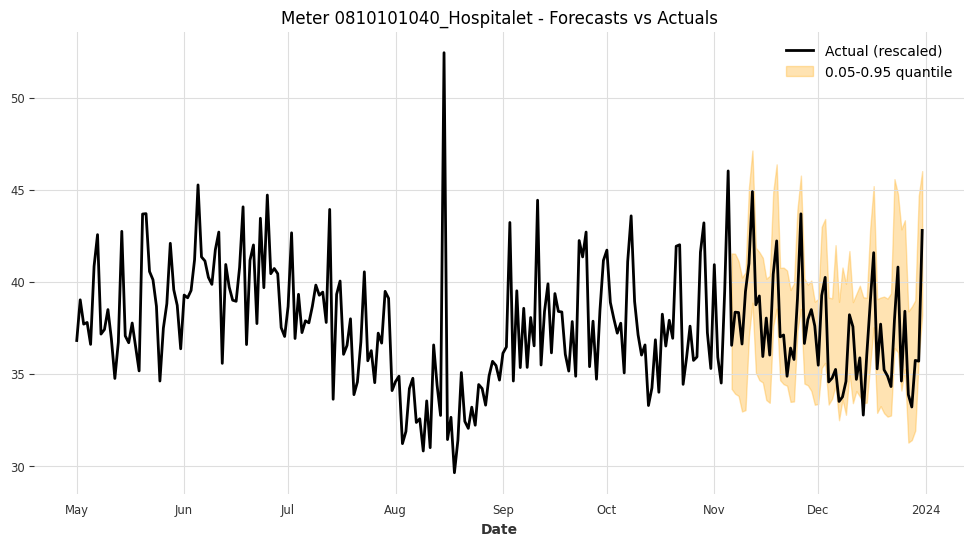

Meter 0810101040_Hospitalet - Coverage: 0.9643, Width: 6.8776



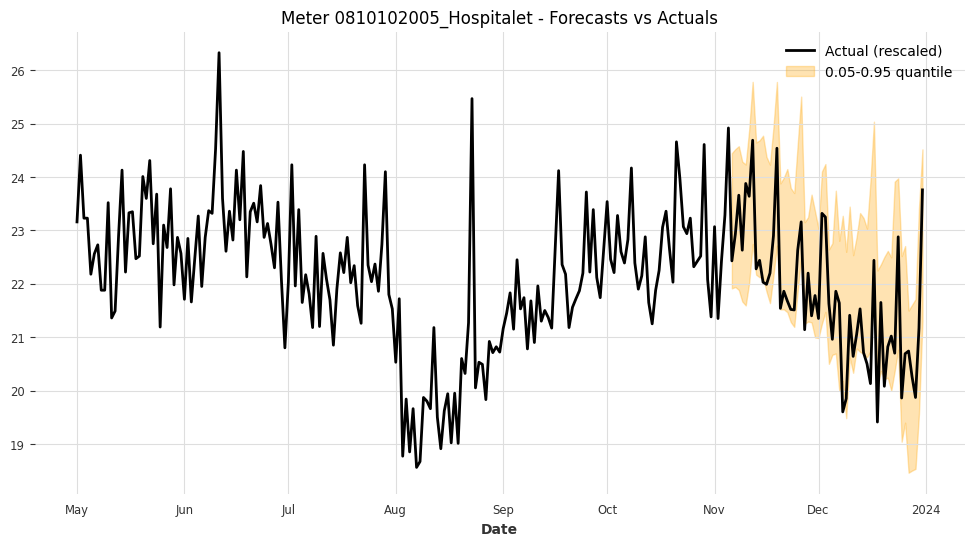

Meter 0810102005_Hospitalet - Coverage: 0.8750, Width: 2.6909



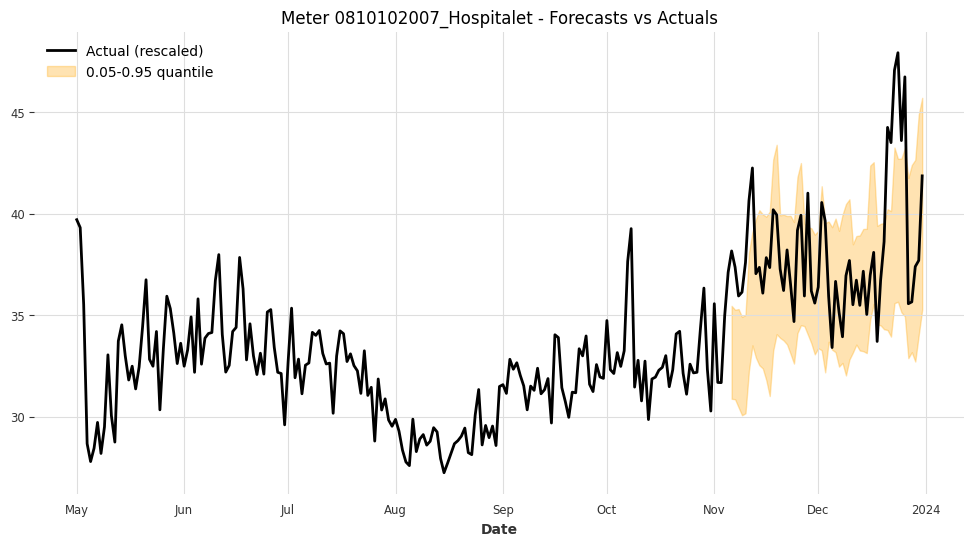

Meter 0810102007_Hospitalet - Coverage: 0.7143, Width: 6.8410



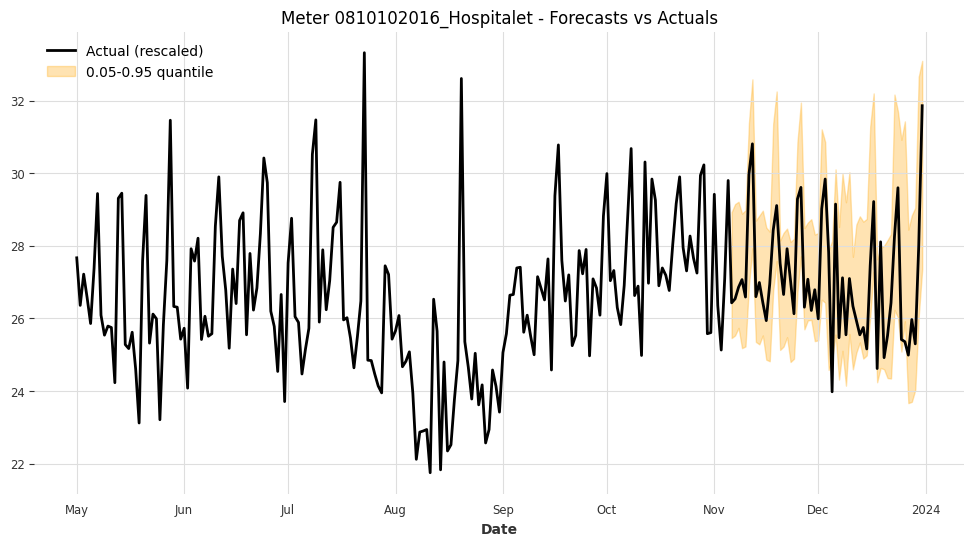

Meter 0810102016_Hospitalet - Coverage: 0.9464, Width: 4.0513



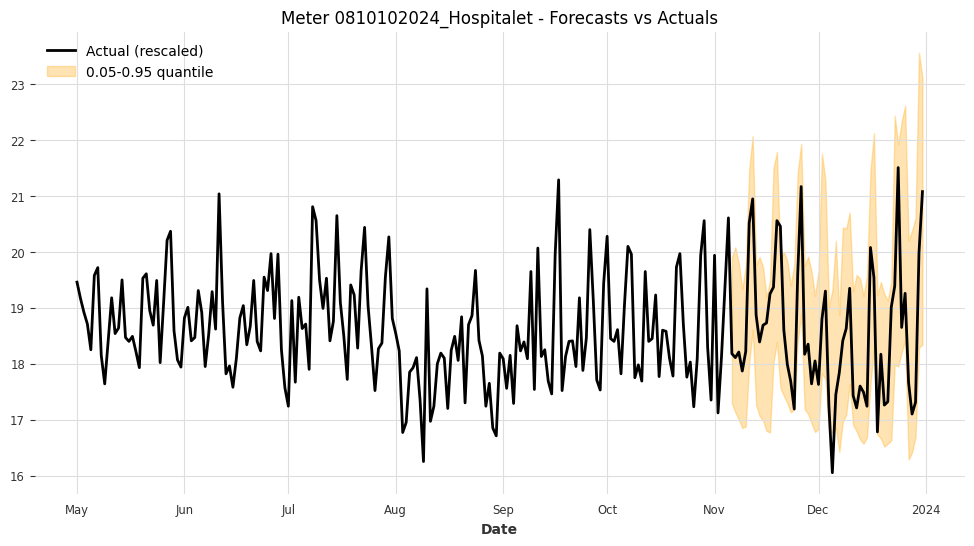

Meter 0810102024_Hospitalet - Coverage: 0.9643, Width: 3.1005



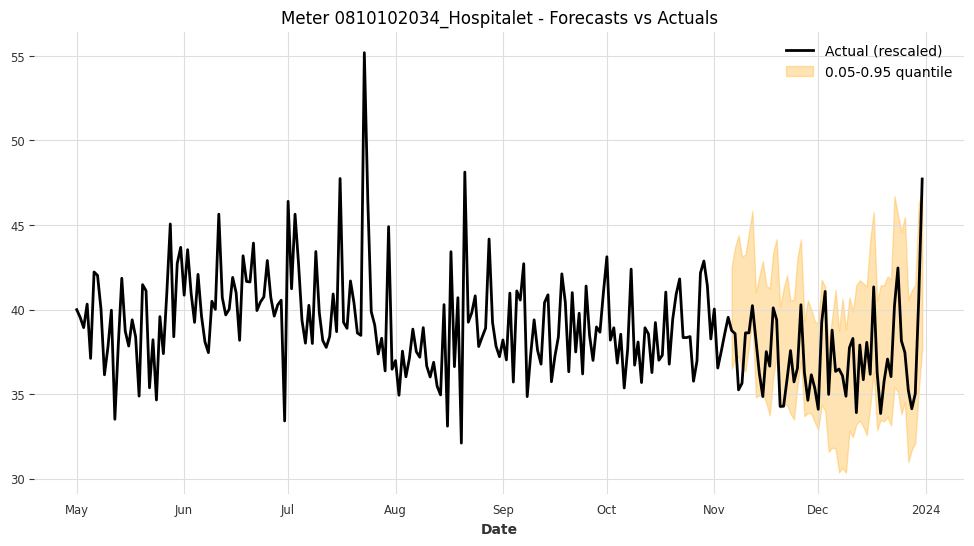

Meter 0810102034_Hospitalet - Coverage: 0.9107, Width: 7.8997



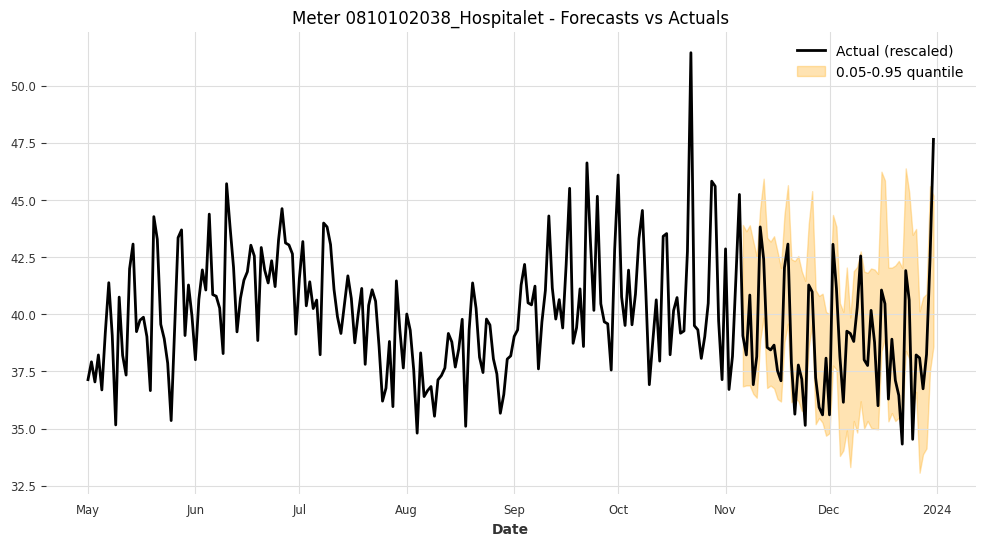

Meter 0810102038_Hospitalet - Coverage: 0.9107, Width: 6.5255



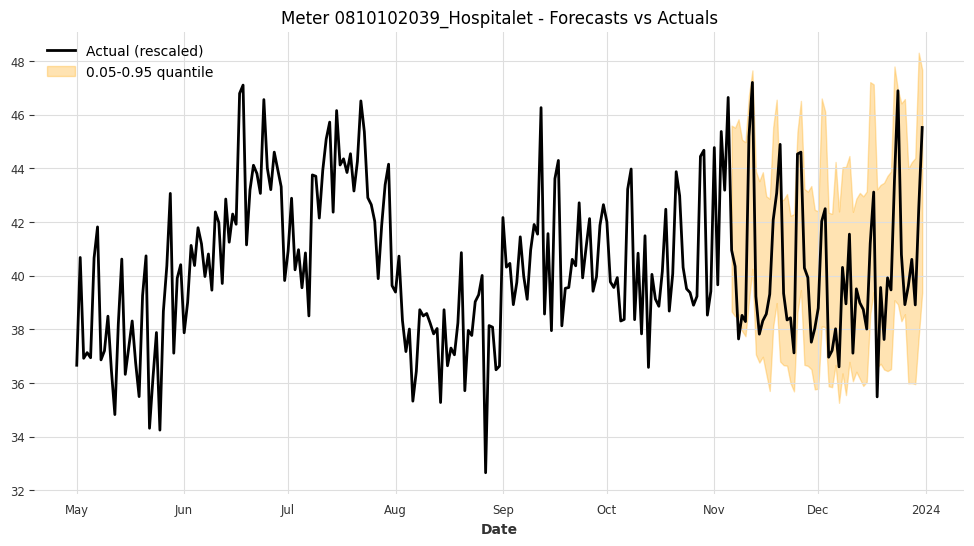

Meter 0810102039_Hospitalet - Coverage: 0.9464, Width: 7.2895



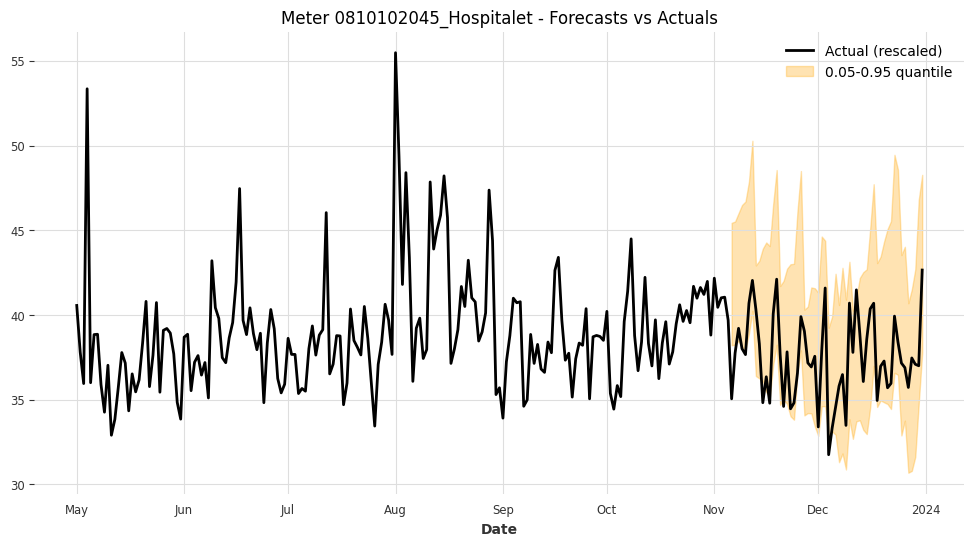

Meter 0810102045_Hospitalet - Coverage: 0.8393, Width: 9.0689



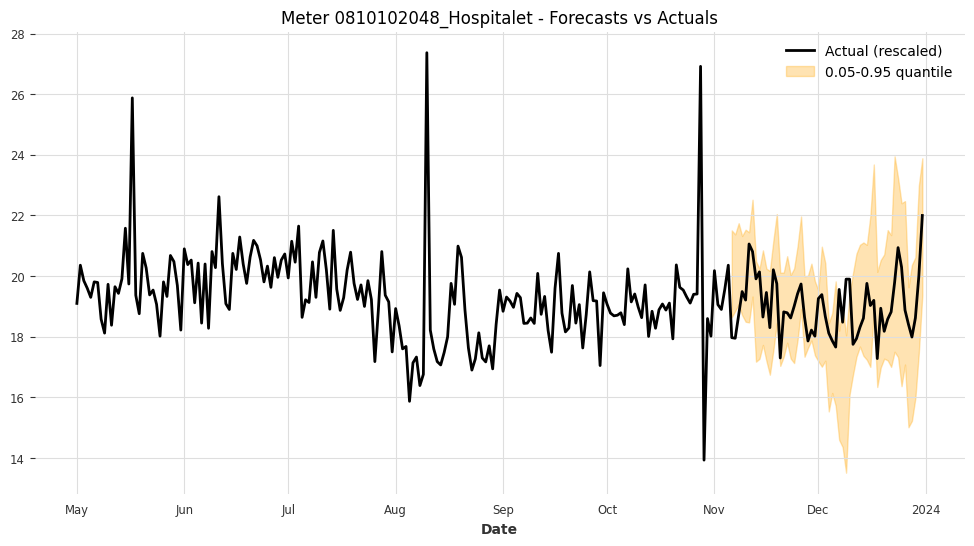

Meter 0810102048_Hospitalet - Coverage: 0.8929, Width: 3.6430



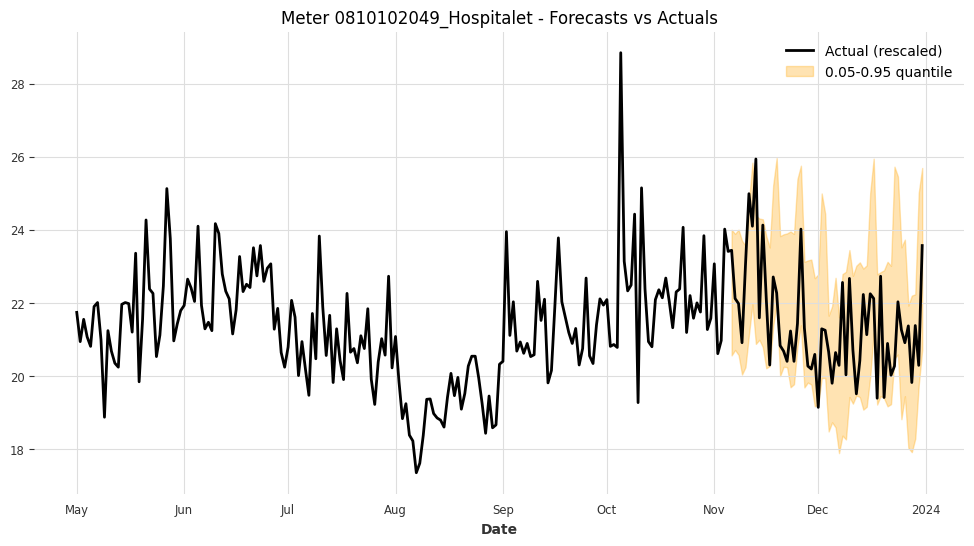

Meter 0810102049_Hospitalet - Coverage: 0.9286, Width: 3.9286



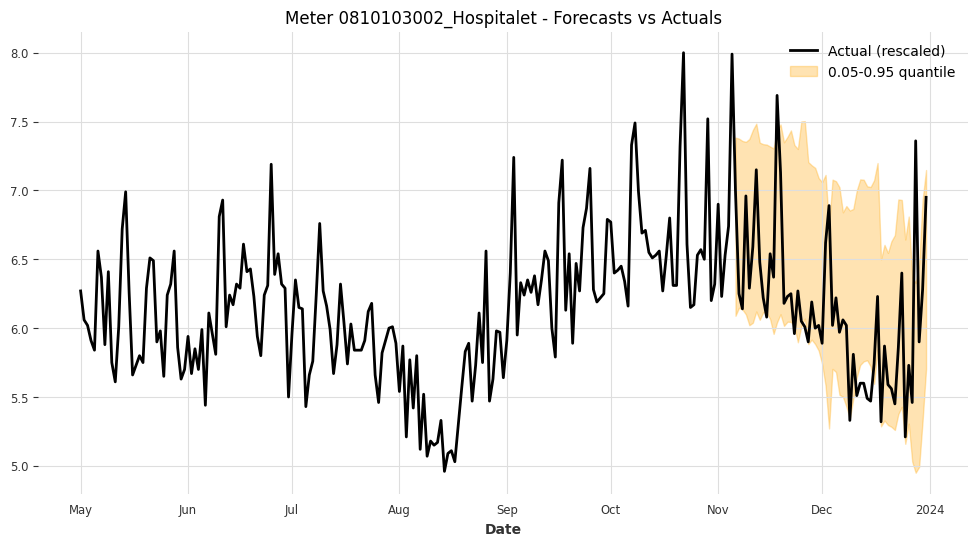

Meter 0810103002_Hospitalet - Coverage: 0.7857, Width: 1.3662



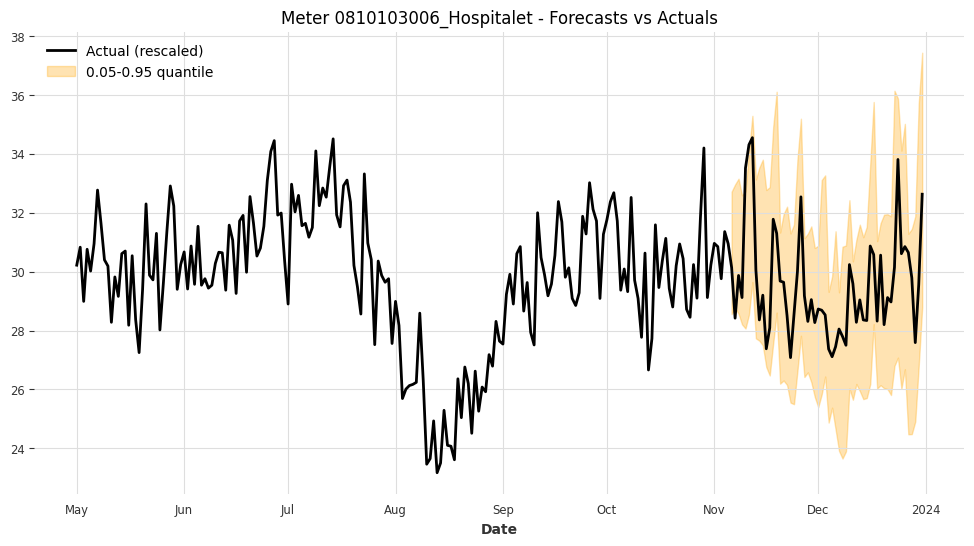

Meter 0810103006_Hospitalet - Coverage: 0.9464, Width: 6.1615



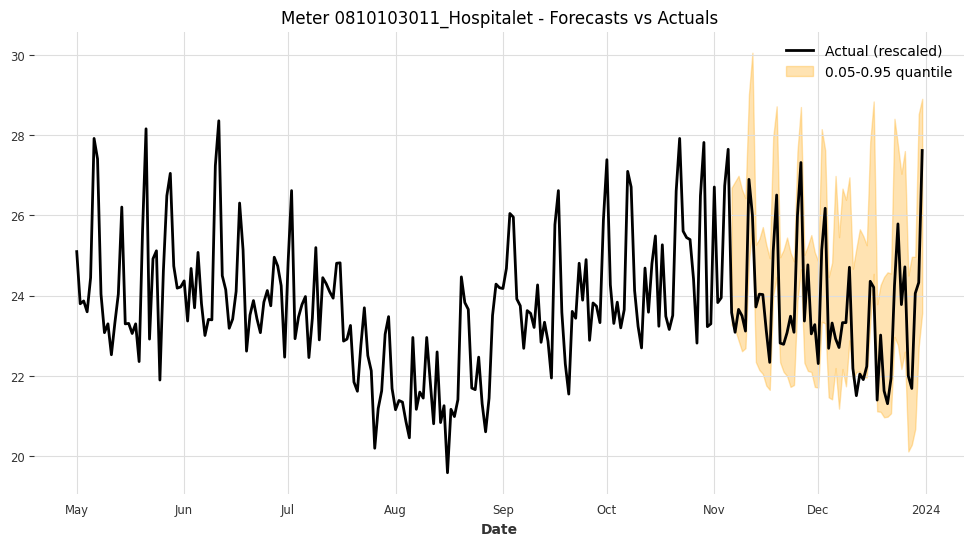

Meter 0810103011_Hospitalet - Coverage: 0.9107, Width: 3.8446



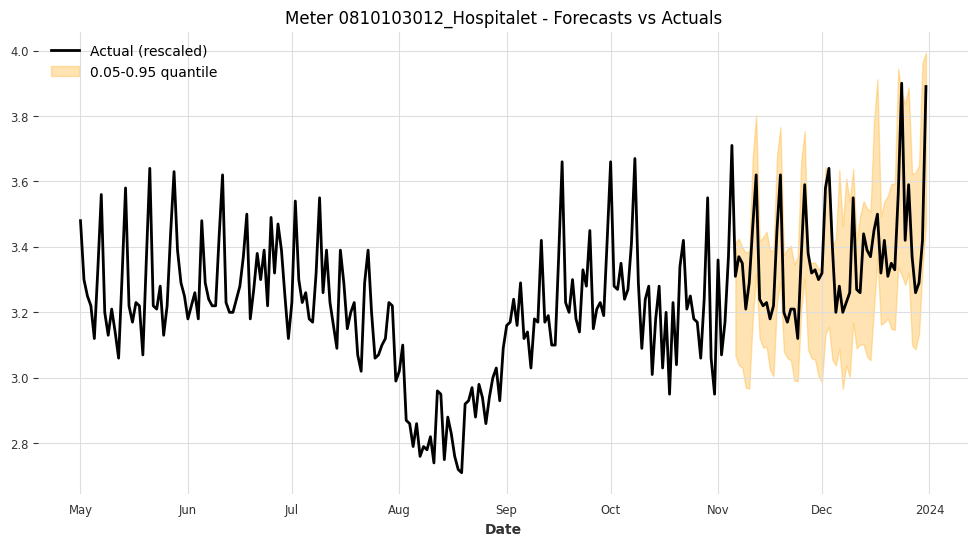

Meter 0810103012_Hospitalet - Coverage: 0.9464, Width: 0.4320



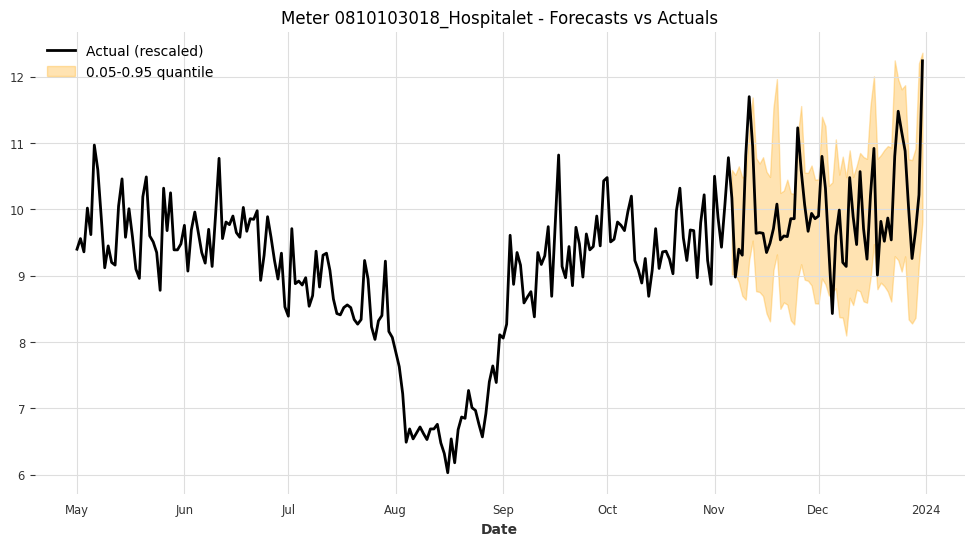

Meter 0810103018_Hospitalet - Coverage: 0.9107, Width: 2.1412



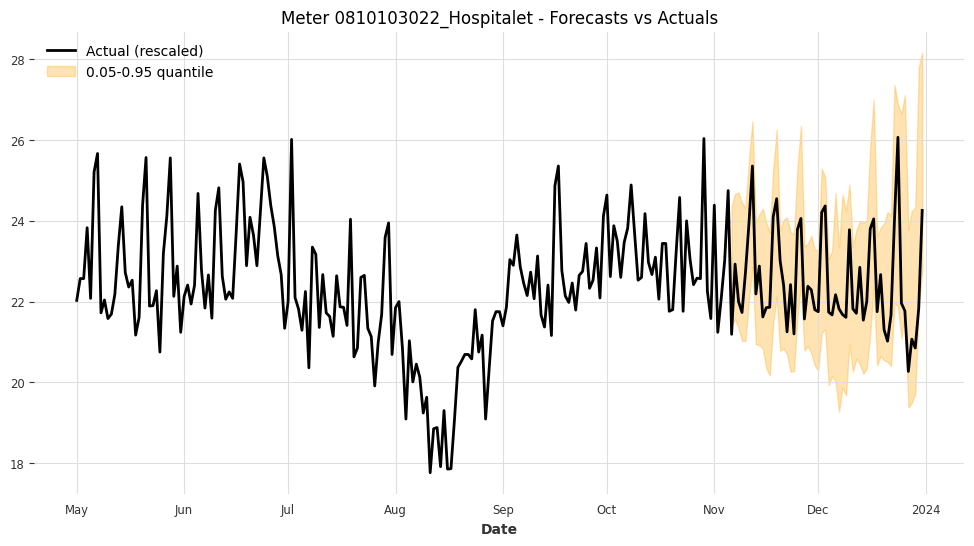

Meter 0810103022_Hospitalet - Coverage: 0.9643, Width: 3.7889



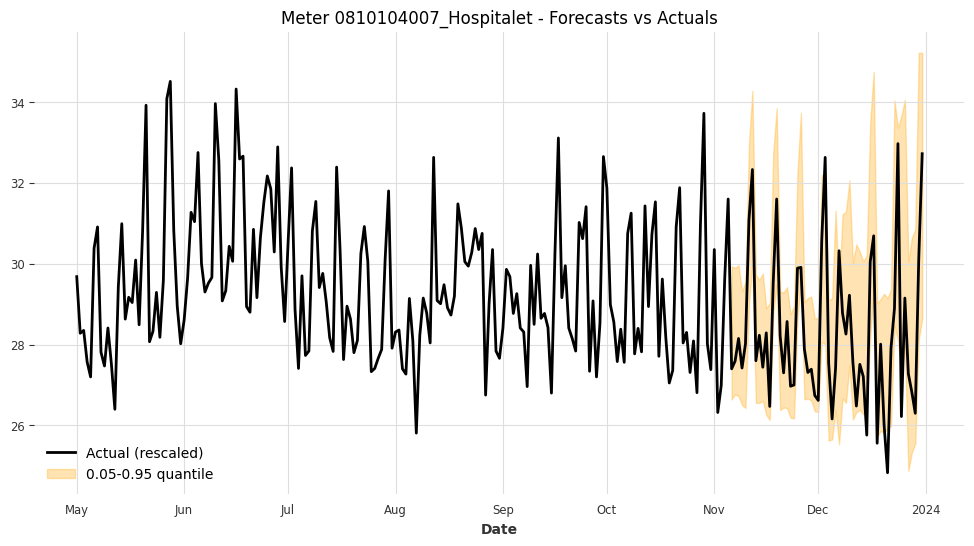

Meter 0810104007_Hospitalet - Coverage: 0.8929, Width: 3.8943



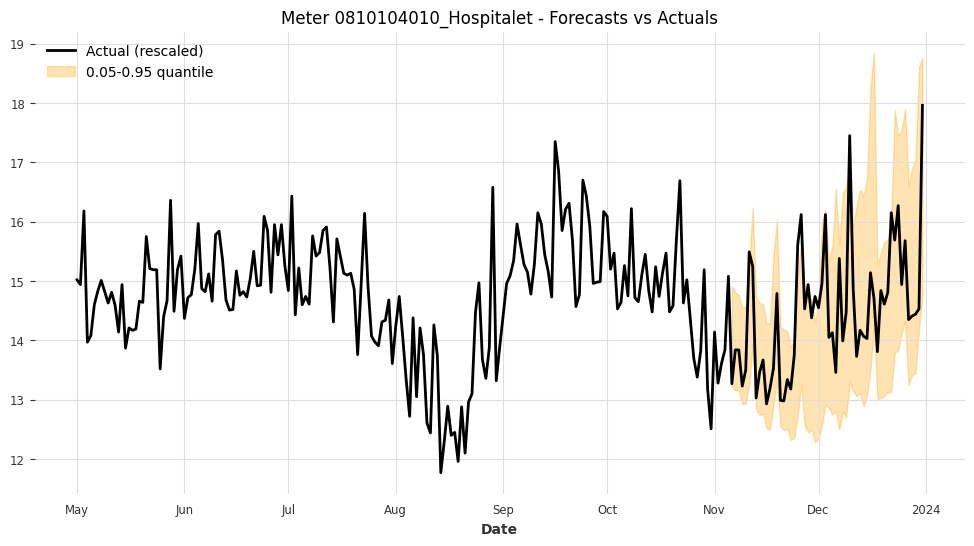

Meter 0810104010_Hospitalet - Coverage: 0.8750, Width: 2.7470



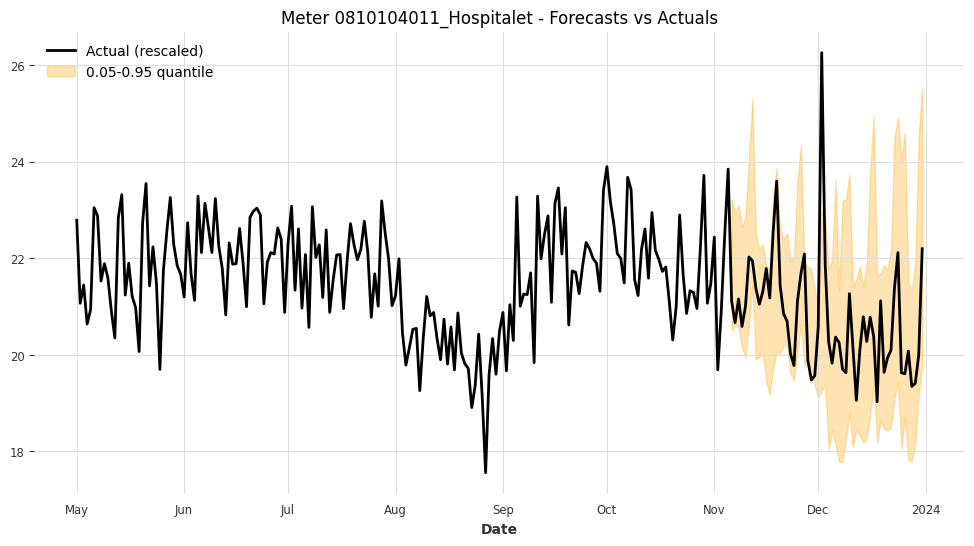

Meter 0810104011_Hospitalet - Coverage: 0.9464, Width: 3.5214



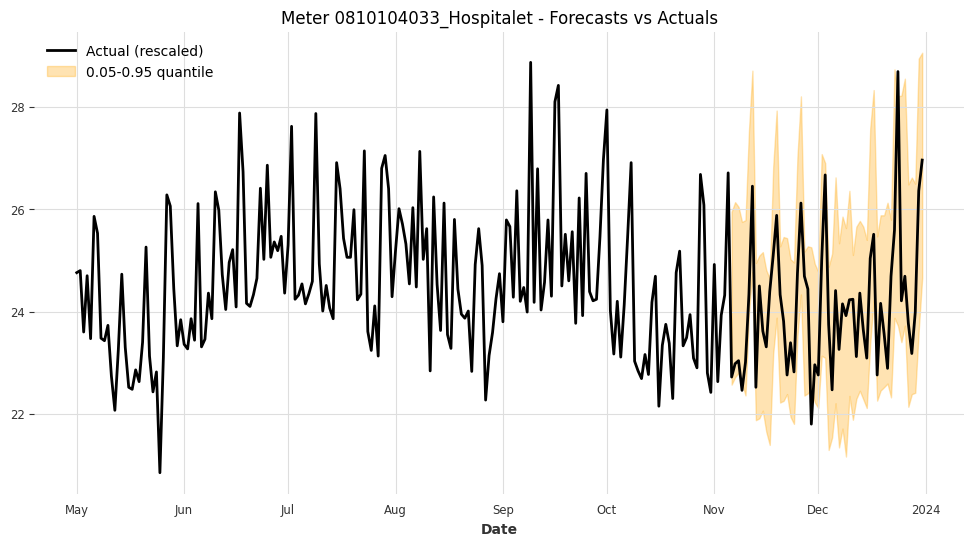

Meter 0810104033_Hospitalet - Coverage: 0.9464, Width: 3.6336



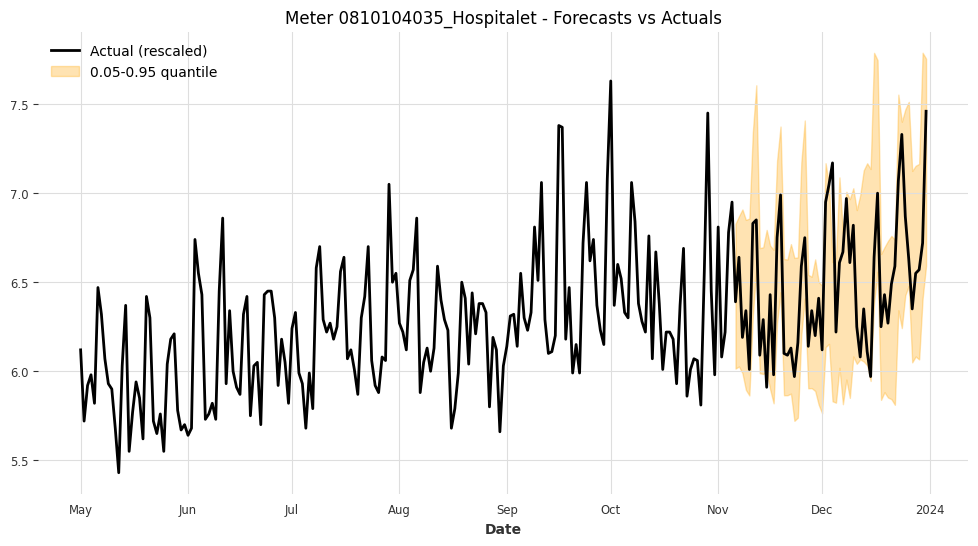

Meter 0810104035_Hospitalet - Coverage: 0.9464, Width: 0.9445



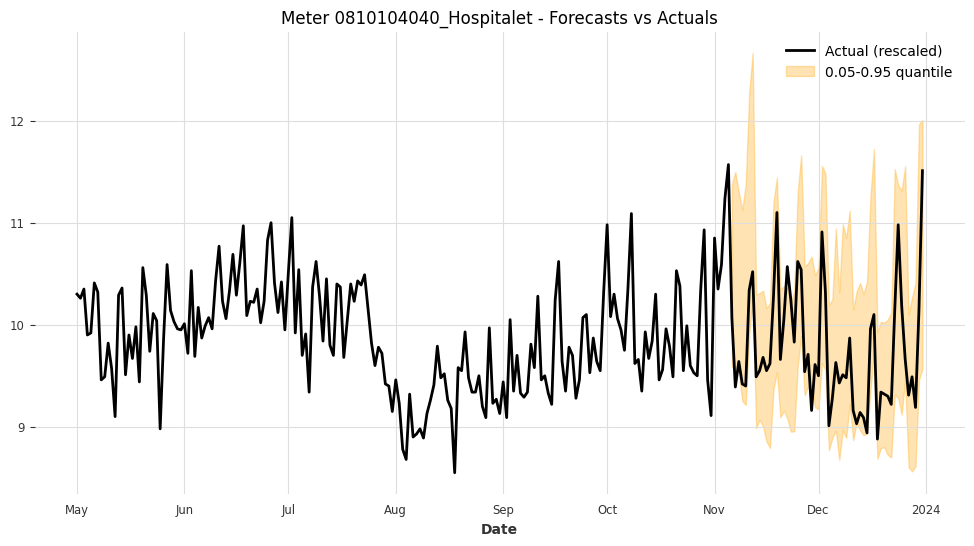

Meter 0810104040_Hospitalet - Coverage: 0.9107, Width: 1.6576



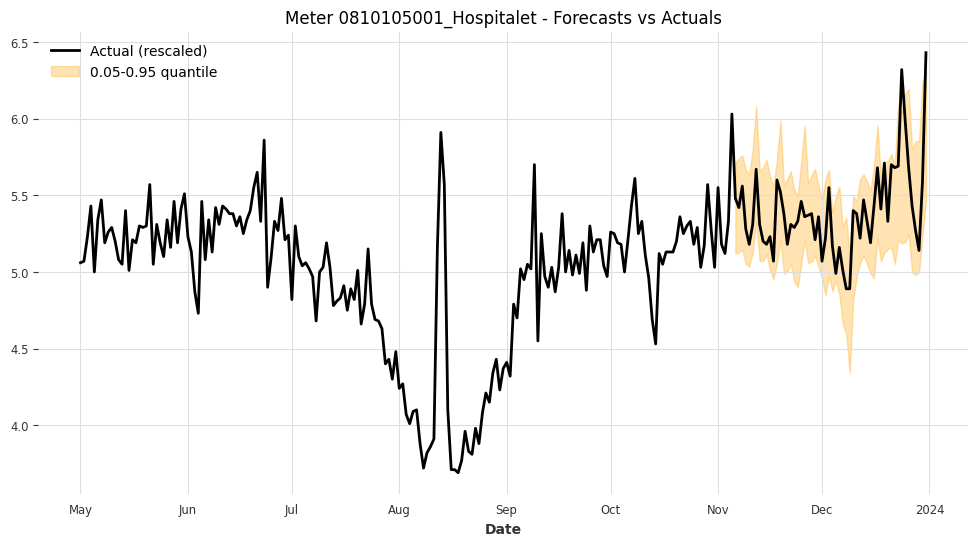

Meter 0810105001_Hospitalet - Coverage: 0.9643, Width: 0.6643



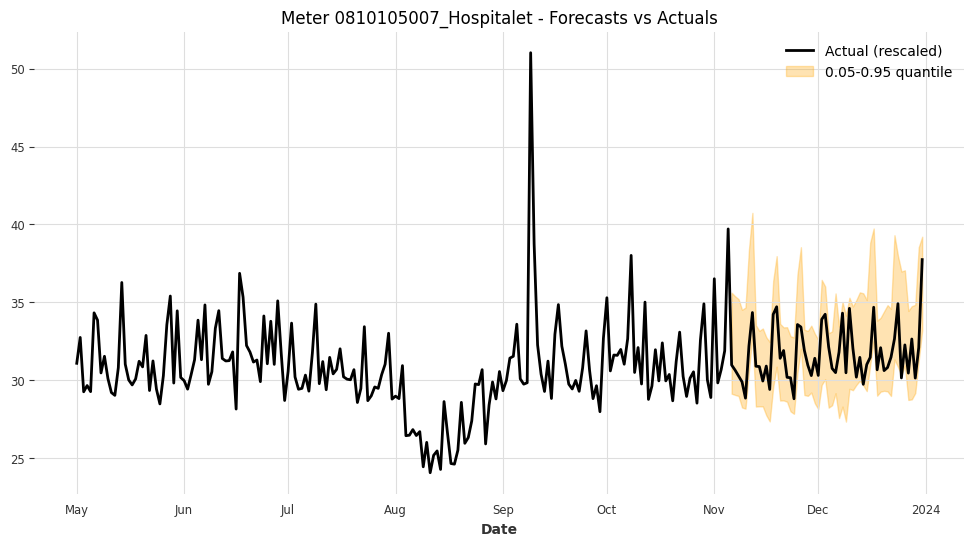

Meter 0810105007_Hospitalet - Coverage: 0.9821, Width: 5.8346



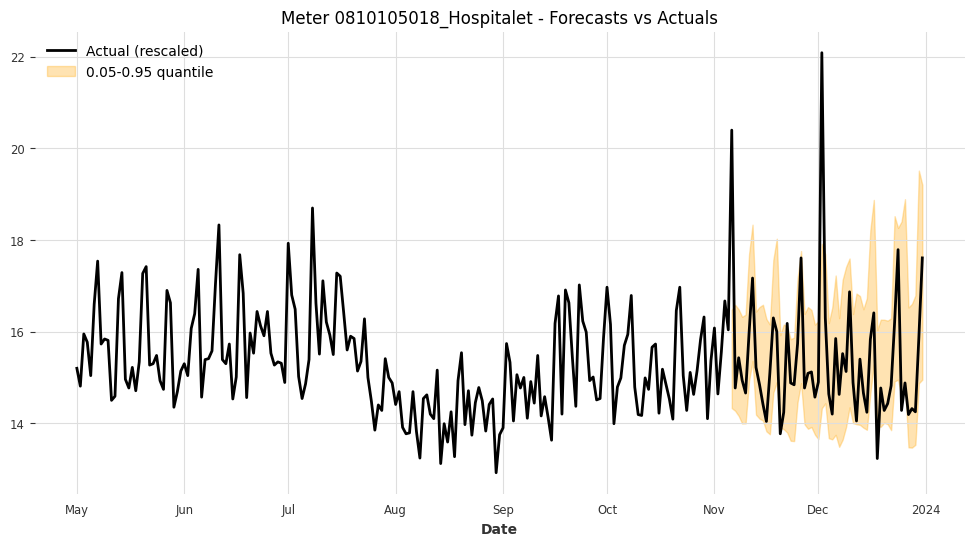

Meter 0810105018_Hospitalet - Coverage: 0.8750, Width: 2.8304



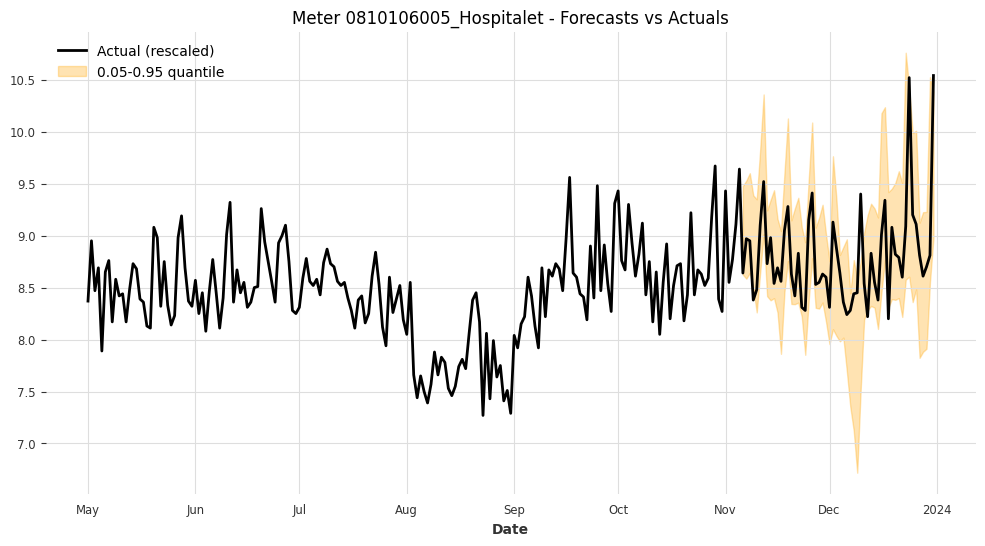

Meter 0810106005_Hospitalet - Coverage: 0.8929, Width: 1.1796



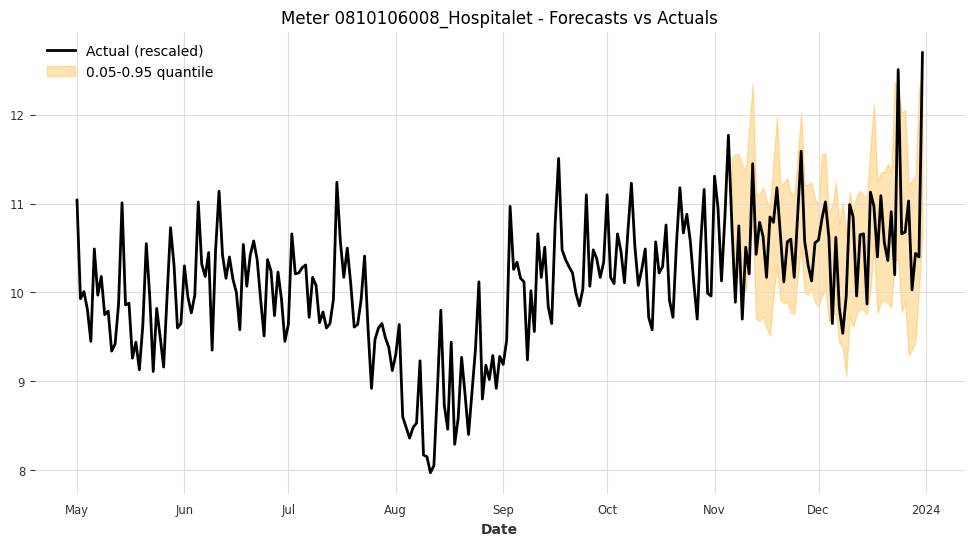

Meter 0810106008_Hospitalet - Coverage: 0.8750, Width: 1.4995



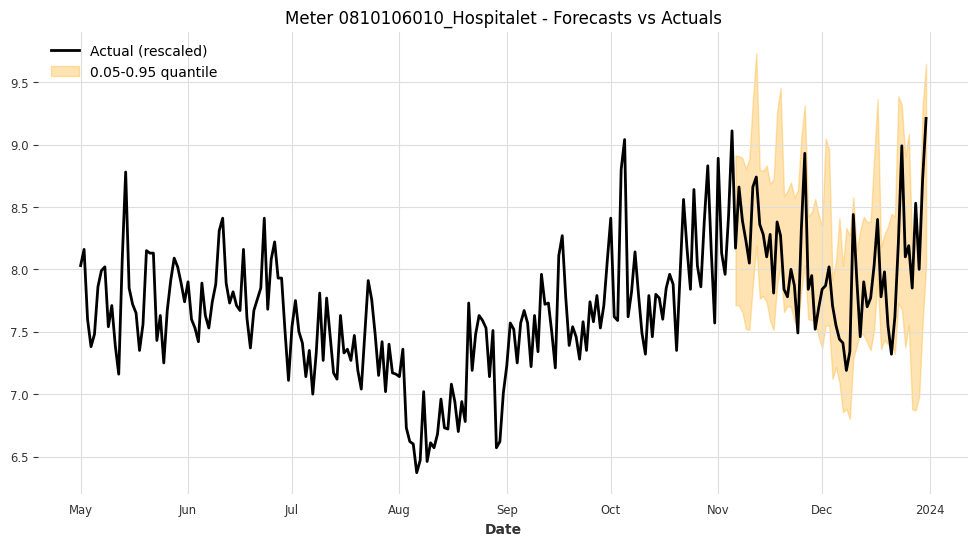

Meter 0810106010_Hospitalet - Coverage: 0.9107, Width: 1.1911



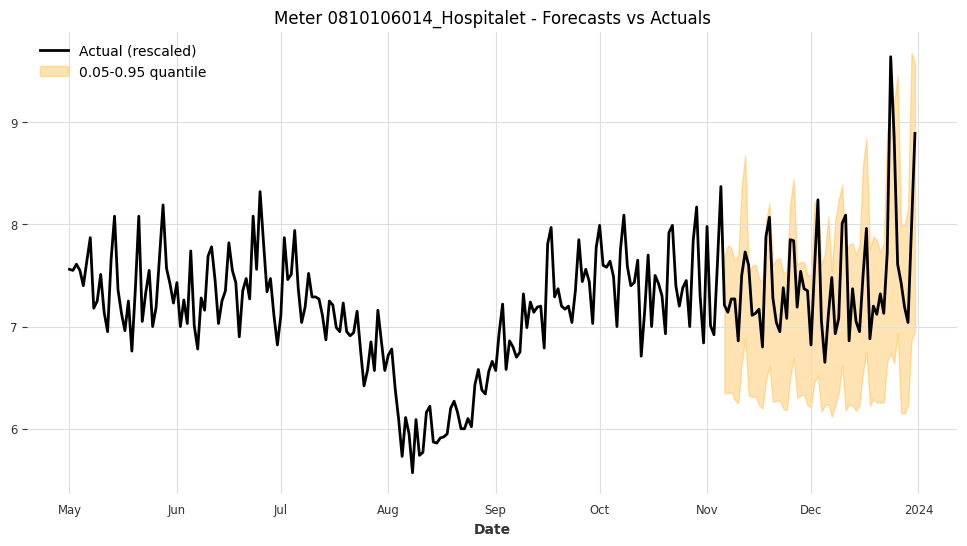

Meter 0810106014_Hospitalet - Coverage: 0.9464, Width: 1.6411



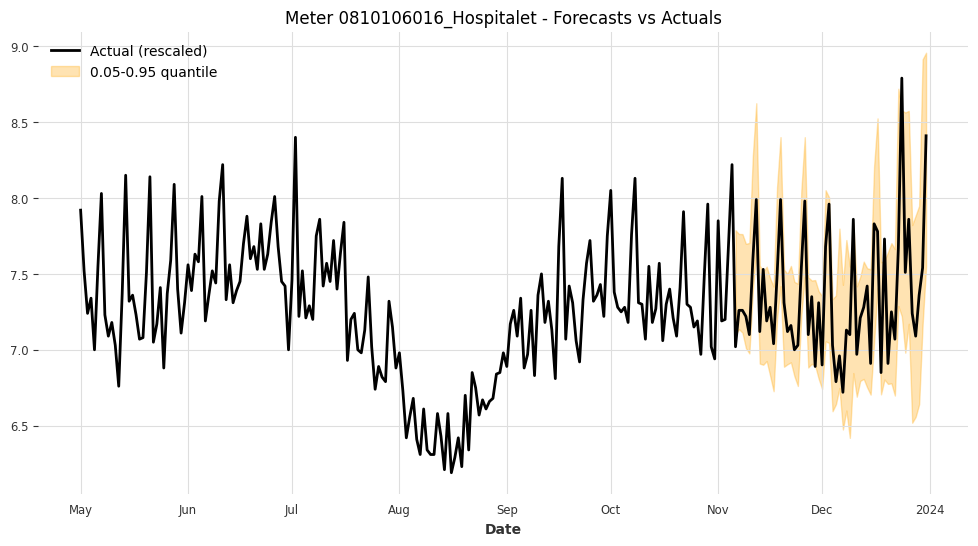

Meter 0810106016_Hospitalet - Coverage: 0.8929, Width: 0.8946



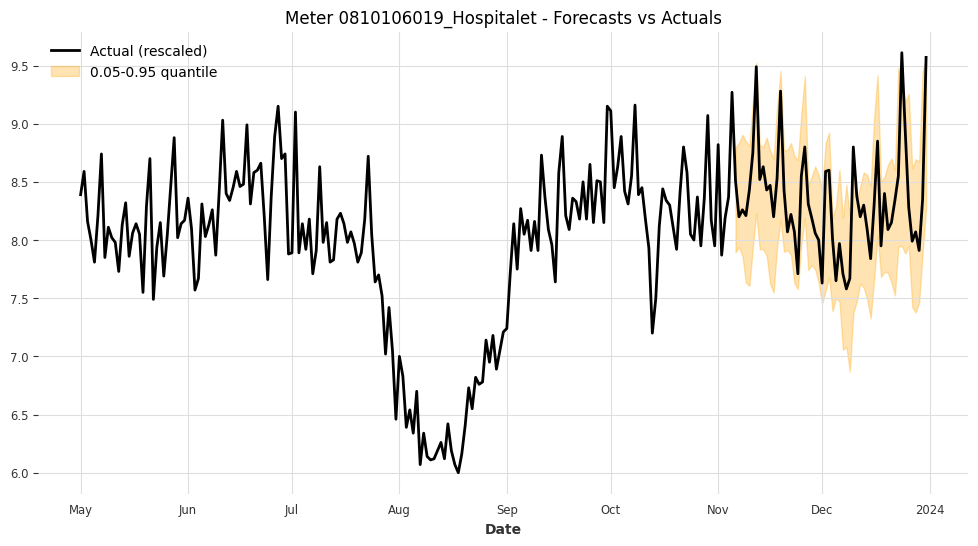

Meter 0810106019_Hospitalet - Coverage: 0.9286, Width: 1.1006



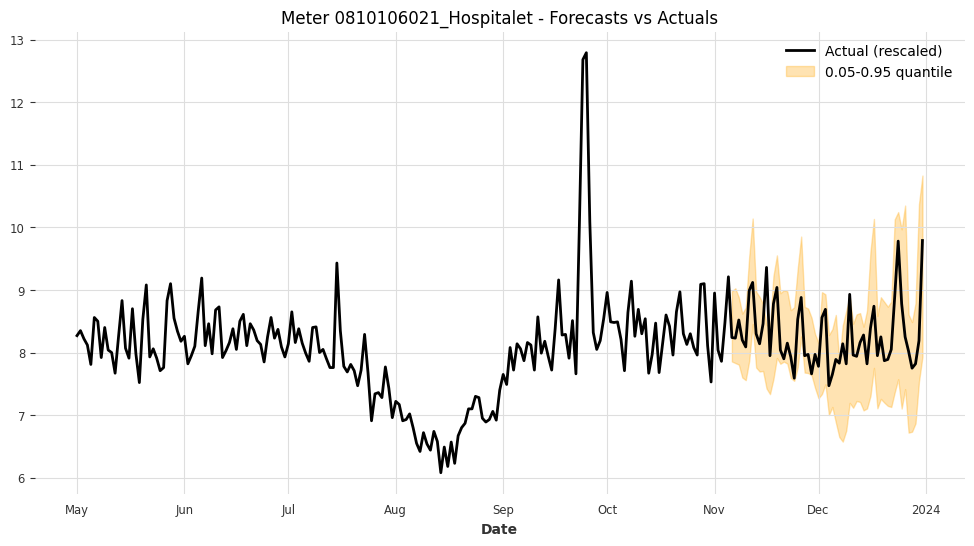

Meter 0810106021_Hospitalet - Coverage: 0.9643, Width: 1.5637



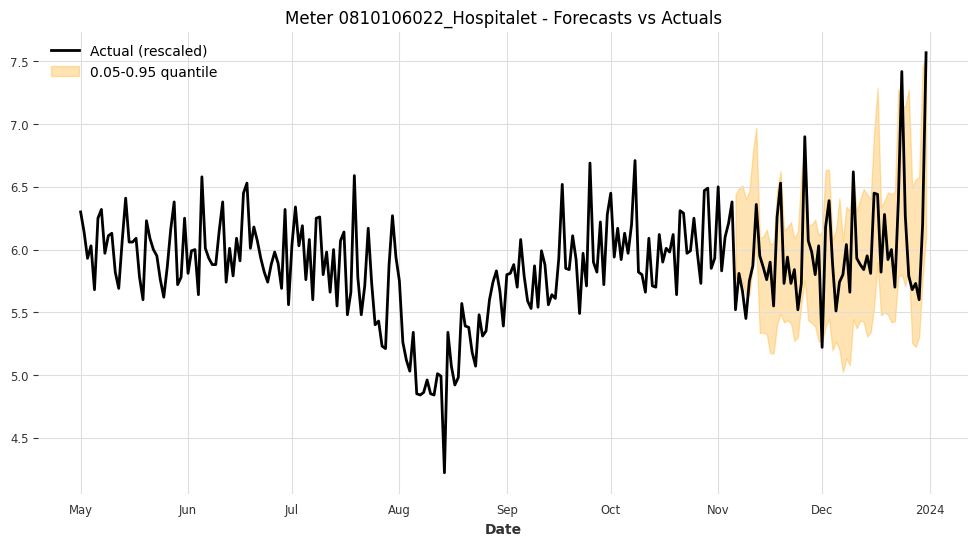

Meter 0810106022_Hospitalet - Coverage: 0.8393, Width: 1.0256



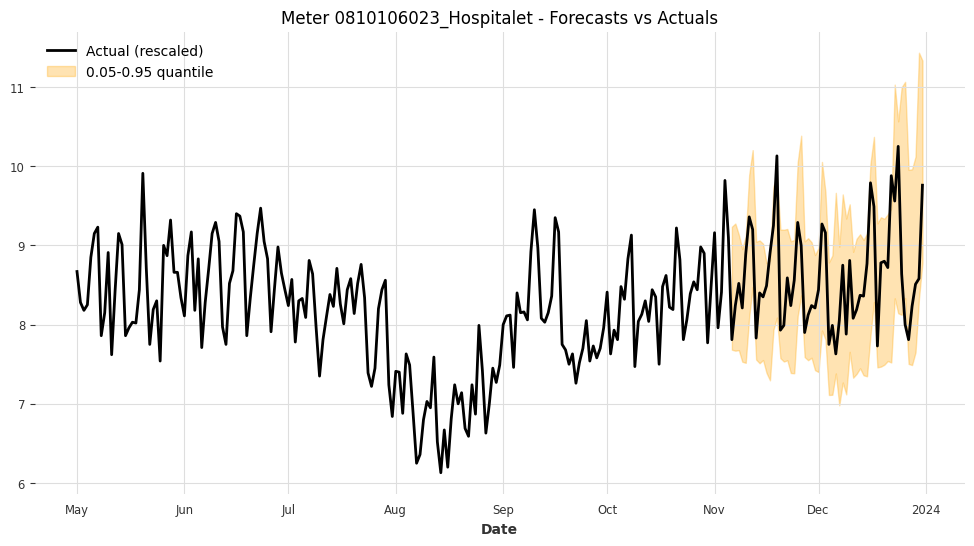

Meter 0810106023_Hospitalet - Coverage: 0.9286, Width: 1.8913



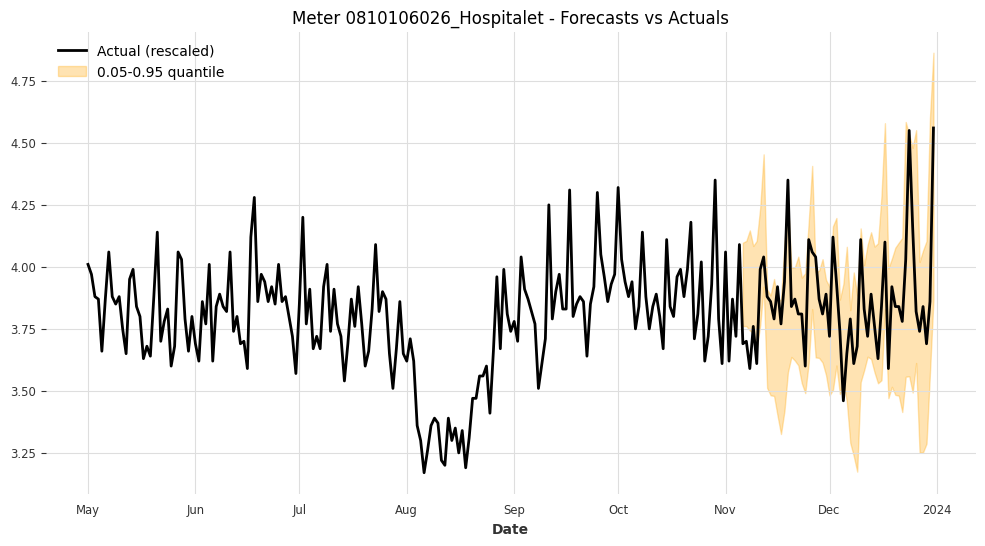

Meter 0810106026_Hospitalet - Coverage: 0.8393, Width: 0.5747



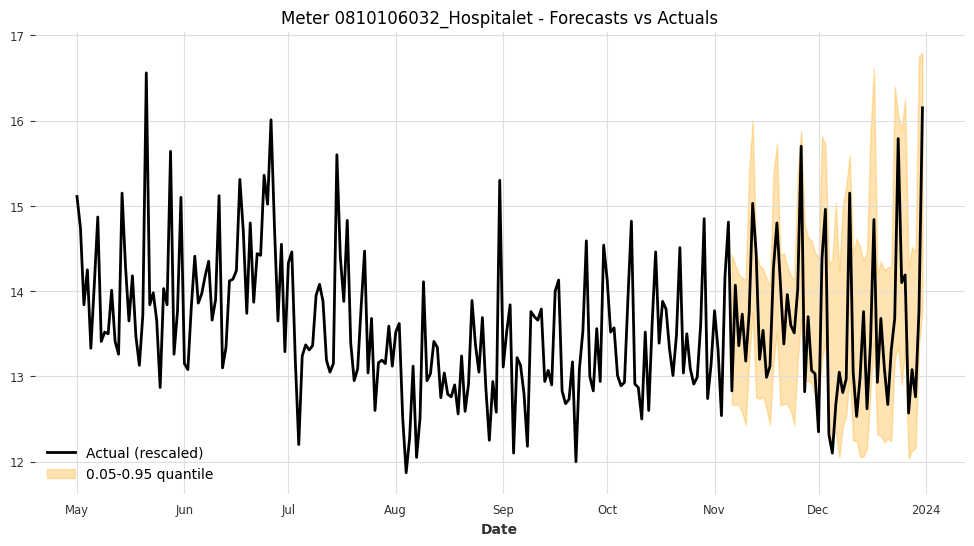

Meter 0810106032_Hospitalet - Coverage: 0.9464, Width: 2.1658



In [ ]:
import matplotlib.pyplot as plt
from darts import concatenate  # Darts utility to merge TimeSeries

for meter_id, hfcs in all_hfcs.items():
    # Get the actual time series
    ts = scaled_calib_test_series[meter_id]

    # Get scaler and results
    scaler = scalers_test[meter_id]
    df_result = all_bt_results[meter_id]
    coverage = df_result["Coverage"].iloc[0]
    width = df_result["Width rescaled"].iloc[0]

    # Start a new plot
    fig, ax = plt.subplots(figsize=(12, 6))

    # Plot actuals (rescaled)
    ts_orig = scaler.inverse_transform(ts)
    ts_orig.plot(ax=ax, label='Actual (rescaled)', lw=2)

    full_lower = []
    full_upper = []

    # Collect lower and upper quantiles from each forecast window
    for forecast in hfcs:
        if ('Consumption per meter_q0.05' in forecast.components
            and 'Consumption per meter_q0.95' in forecast.components):

            lower = forecast['Consumption per meter_q0.05']
            upper = forecast['Consumption per meter_q0.95']
            lower_orig = scaler.inverse_transform(lower)
            upper_orig = scaler.inverse_transform(upper)
            full_lower.append(lower_orig)
            full_upper.append(upper_orig)


    if full_lower and full_upper:
        # Concatenate all the TimeSeries pieces into full series
        combined_lower = concatenate(full_lower)
        combined_upper = concatenate(full_upper)

        # Plot the quantile area as a filled region
        ax.fill_between(
            combined_lower.time_index,
            combined_lower.values().flatten(),
            combined_upper.values().flatten(),
            color='orange',
            alpha=0.3,
            label='0.05-0.95 quantile'
        )

    ax.set_title(f"Meter {meter_id} - Forecasts vs Actuals")
    ax.legend()
    plt.show()

    # Print the metrics below each plot
    print(f"Meter {meter_id} - Coverage: {coverage:.4f}, Width: {width:.4f}\n")
